In [1]:
from F1_library import libraryF1dataNotebook as libraryDataF1
import pandas as pd
import fastf1 as ff1

# FORMULA 1 QATAR AIRWAYS BRITISH GRAND PRIX 2025
The British Grand Prix is a Grand Prix motor racing event organised in the United Kingdom by Motorsport UK. First held by the Royal Automobile Club (RAC) in 1926, the British Grand Prix has been held annually since 1948 and has been a round of the FIA Formula One World Championship every year since 1950. In 1952, following the transfer of the lease of the Silverstone Circuit to the British Racing Drivers' Club,[1] the RAC delegated the organisation of races held at Silverstone to the BRDC,[2] and those held at Aintree to the British Automobile Racing Club.[3] This arrangement lasted until the RAC created the Motor Sports Association in the late 1970s and it reclaimed organising control of the event. The RAC MSA was renamed Motorsport UK in 2019 when it formally split from the RAC.

The British Grand Prix is currently held at the Silverstone Circuit near the village of Silverstone in Northamptonshire in England. The 2019 event was the 70th time that the race had been run as a World Championship event since the inaugural season in 1950, and the 53rd time that a World Championship round had been held at Silverstone.

The British race is the oldest in the Formula One World Championship calendar as the 1950 race at Silverstone was round one of the first championship season in 1950. It and the Italian Grand Prix are the only two Formula One World Championship Grands Prix that have been staged during every season that the championship has been held. The British Grand Prix was a round of the World Manufacturers' Championship in both 1926 and 1927, but was never held during the existence of the European Championship. It was designated the European Grand Prix five times between 1950 and 1977, when this title was an honorary designation given each year to one Grand Prix race in Europe. All British Grands Prix dating back to 1926 have been held in England, where the British motor racing industry is primarily located.

The event is due to take place at Silverstone Circuit until at least 2034
Source: Wikipedia

## Obtain session information

In [2]:
libraryDataF1.obtain_information('sessions',year=2025,country_acronym='GBR')

,meeting_key,session_key,location,date_start,date_end,session_type,session_name,country_key,country_code,country_name,circuit_key,circuit_short_name,gmt_offset,year
0,1277,9940,Silverstone,2025-07-04T11:30:00+00:00,2025-07-04T12:30:00+00:00,Practice,Practice 1,2,GBR,United Kingdom,2,Silverstone,01:00:00,2025
1,1277,9941,Silverstone,2025-07-04T15:00:00+00:00,2025-07-04T16:00:00+00:00,Practice,Practice 2,2,GBR,United Kingdom,2,Silverstone,01:00:00,2025
2,1277,9942,Silverstone,2025-07-05T10:30:00+00:00,2025-07-05T11:30:00+00:00,Practice,Practice 3,2,GBR,United Kingdom,2,Silverstone,01:00:00,2025
3,1277,9943,Silverstone,2025-07-05T14:00:00+00:00,2025-07-05T15:00:00+00:00,Qualifying,Qualifying,2,GBR,United Kingdom,2,Silverstone,01:00:00,2025
4,1277,9947,Silverstone,2025-07-06T14:00:00+00:00,2025-07-06T16:00:00+00:00,Race,Race,2,GBR,United Kingdom,2,Silverstone,01:00:00,2025


## Free Practice 1
### Obtain setup

In [10]:
practice = libraryDataF1.obtain_information('laps',session_key=9940)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9940)
drivers = libraryDataF1.obtain_information('drivers',session_key=9940)

In [11]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

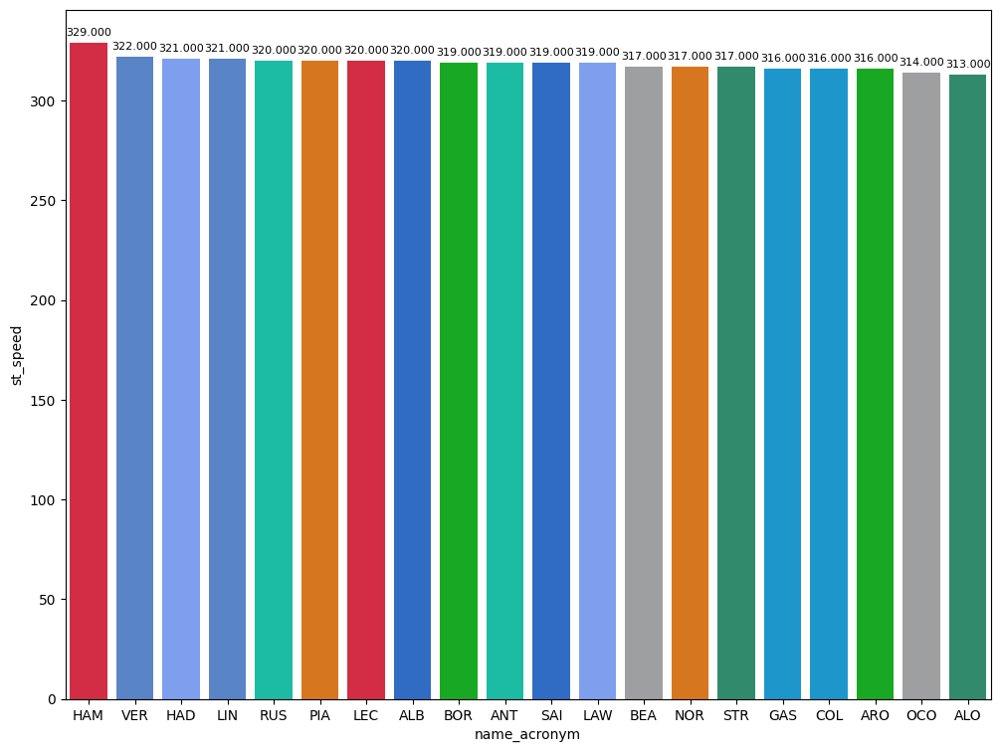

In [12]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

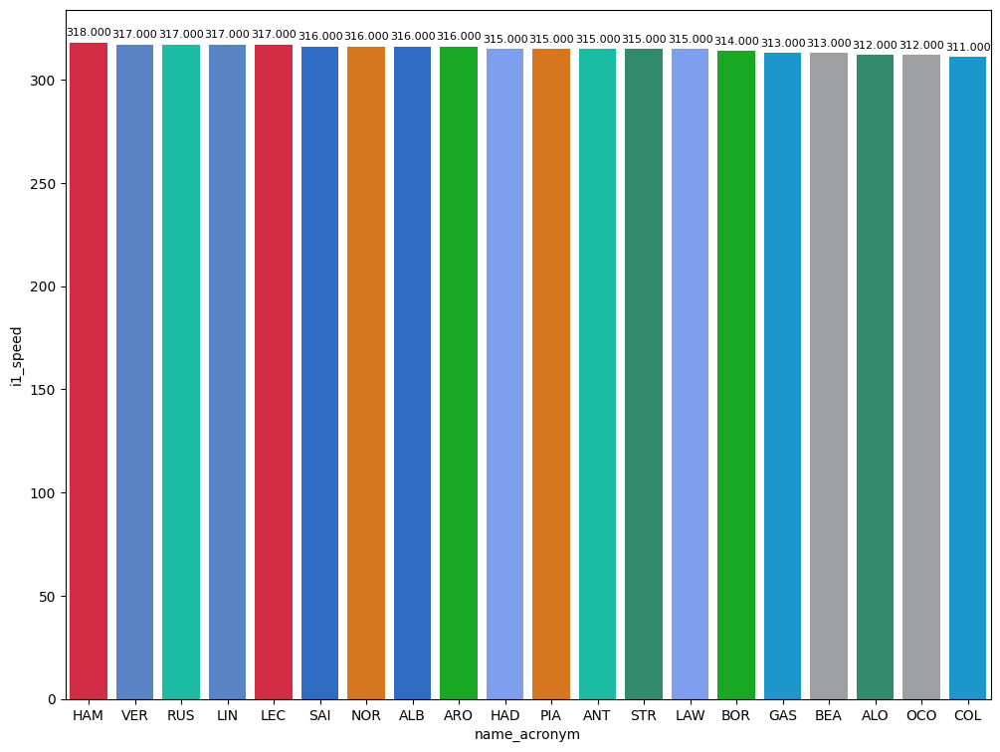

In [13]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

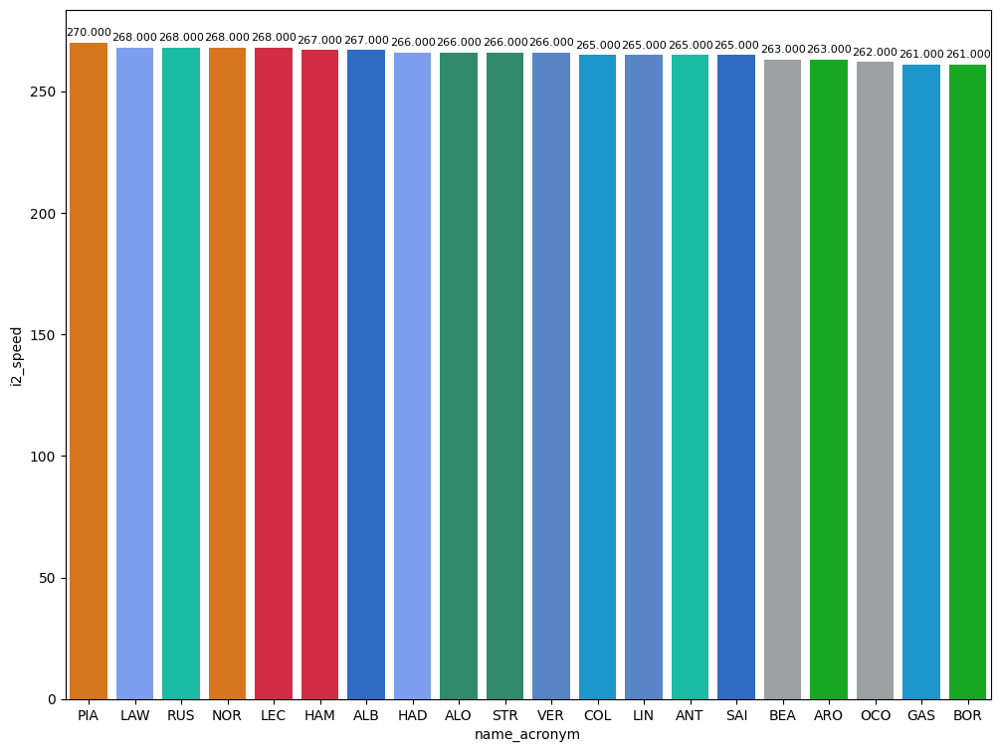

In [14]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [15]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
117,Lance STROLL,HARD,28.490,35.893,24.358,88.741
181,Isack HADJAR,MEDIUM,28.349,35.246,23.907,87.502
286,Lewis HAMILTON,SOFT,28.075,35.003,23.814,86.892


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.

In [16]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


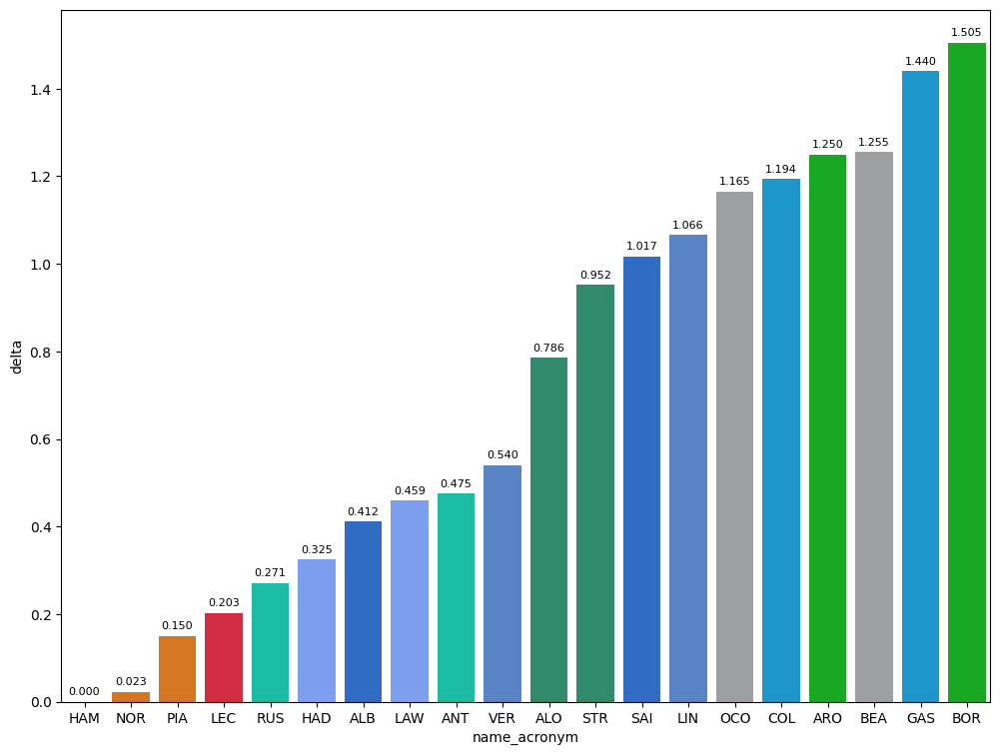

In [17]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

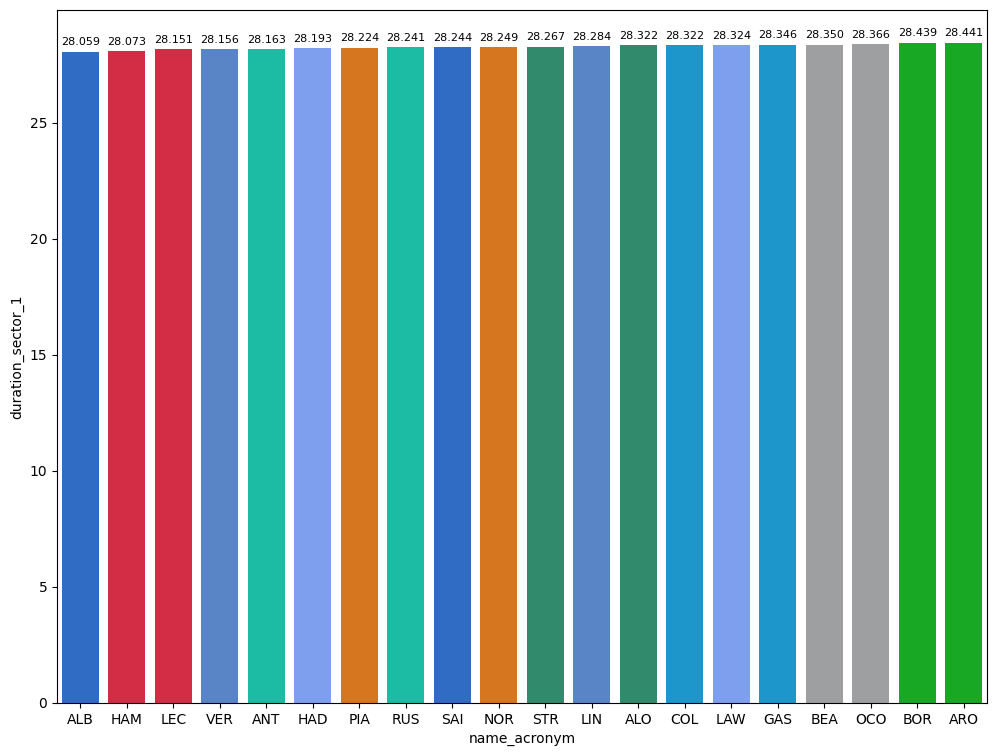

In [18]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

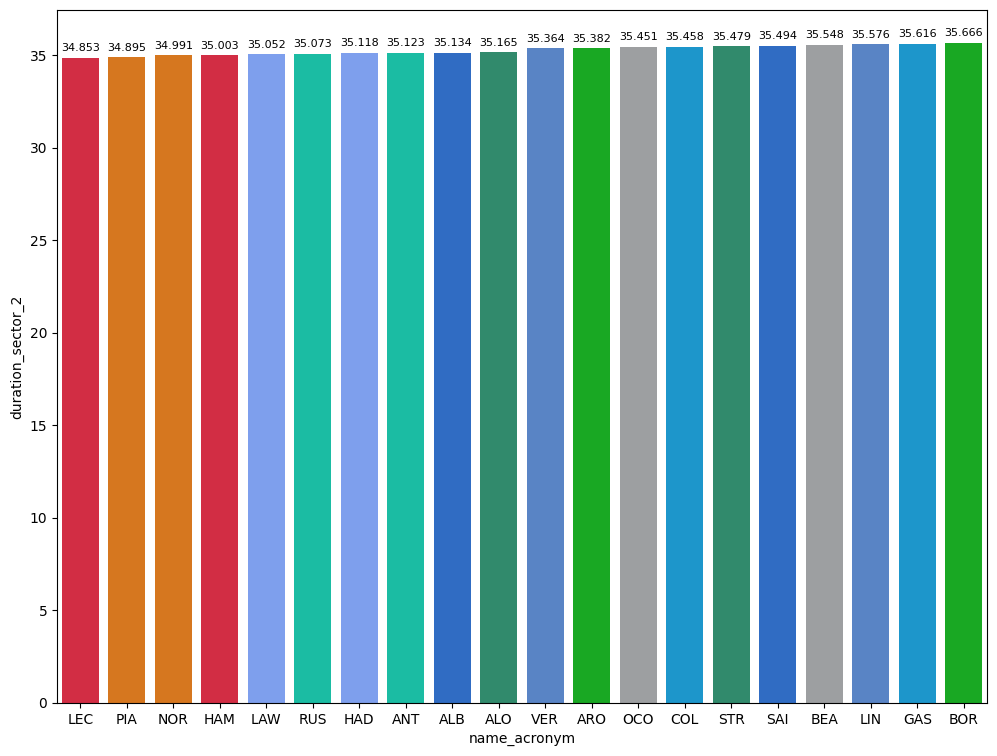

In [19]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

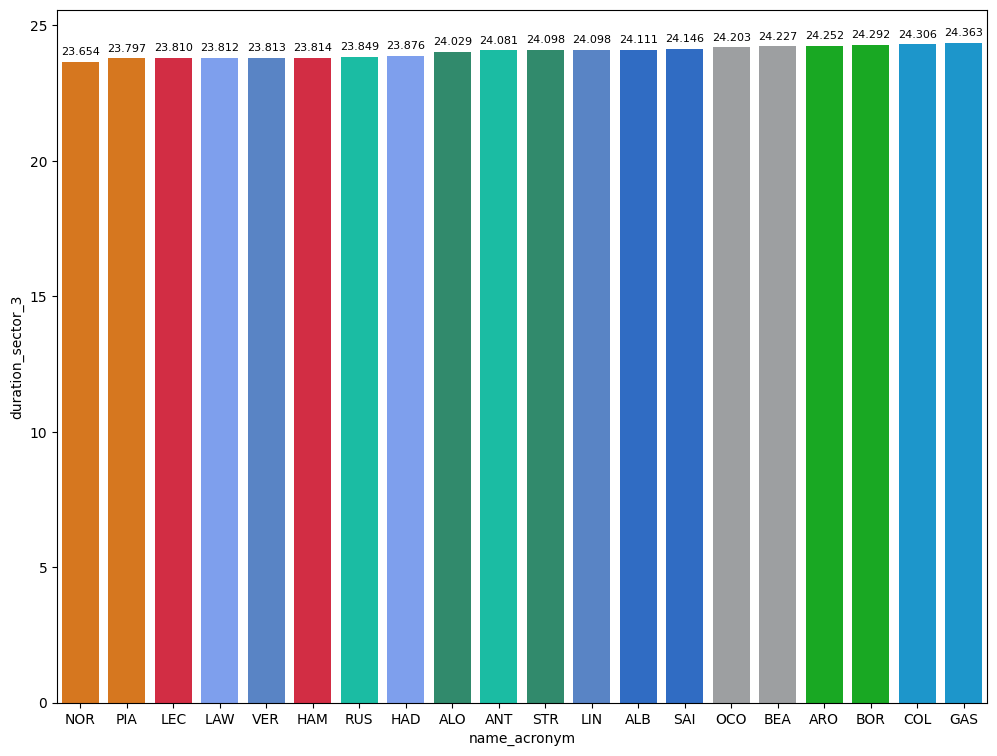

In [20]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [22]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 83").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,


## Free Practice 2
### Obtain setup

In [23]:
practice = libraryDataF1.obtain_information('laps',session_key=9941)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9941)
drivers = libraryDataF1.obtain_information('drivers',session_key=9941)

In [24]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

### Speed trap

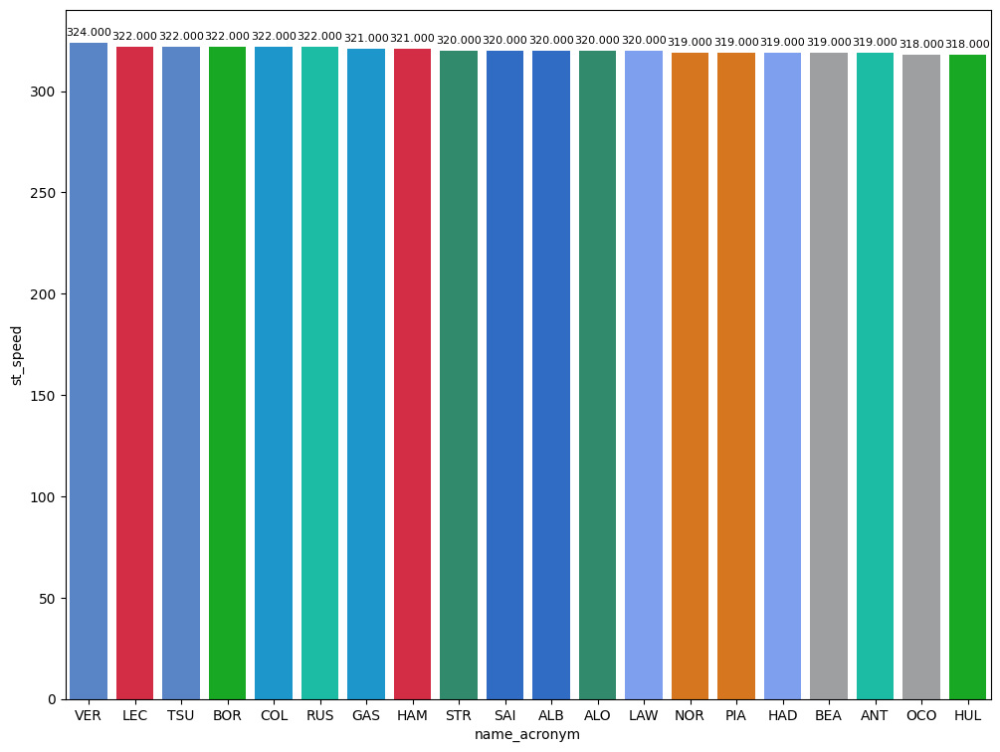

In [25]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

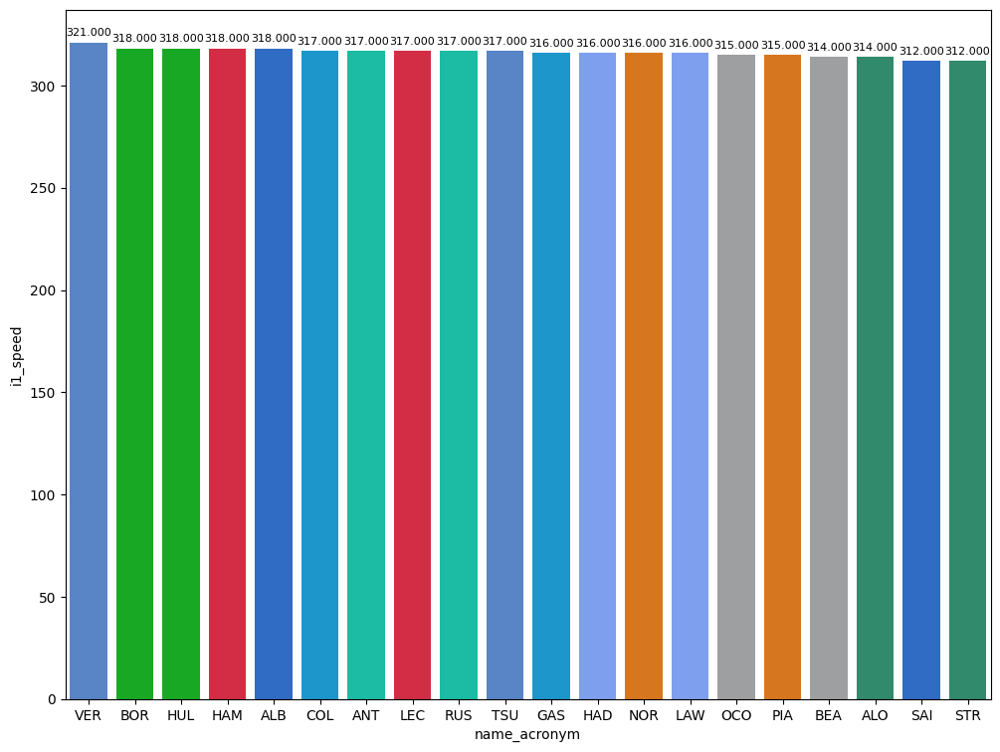

In [26]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

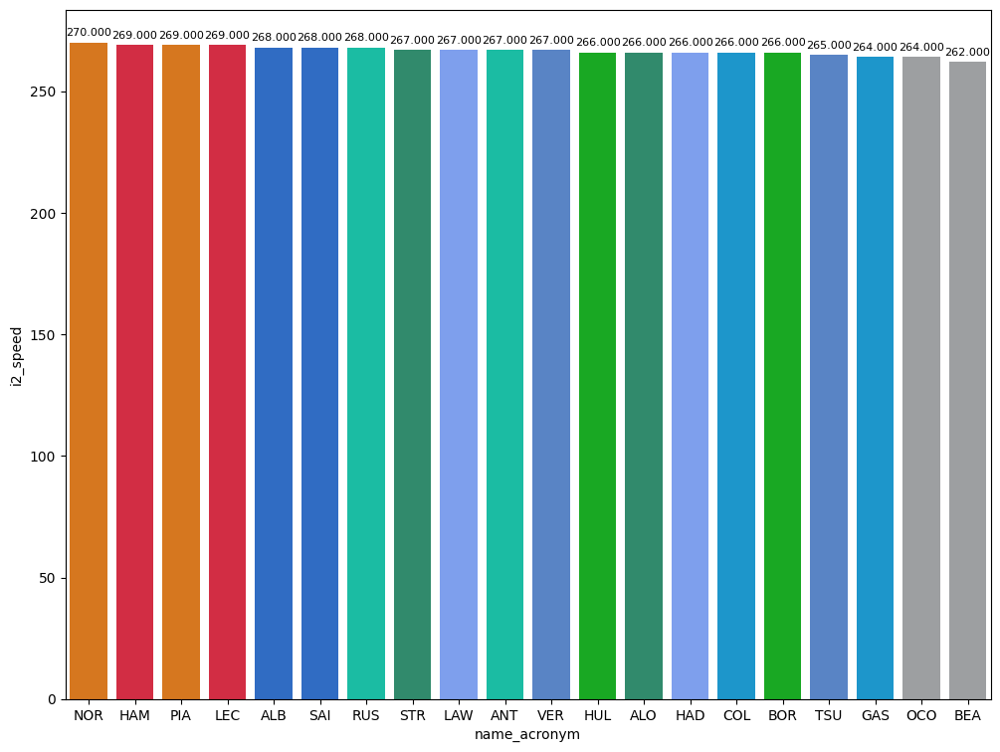

In [27]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [35]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
159,Oliver BEARMAN,HARD,28.477,35.487,24.169,88.133
158,Lewis HAMILTON,MEDIUM,28.126,34.805,23.661,86.592
211,Lando NORRIS,SOFT,27.810,34.436,23.570,85.816


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session.Due to changing conditions, only a part of the free practice were important and this part will be taken into consideration.

In [36]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


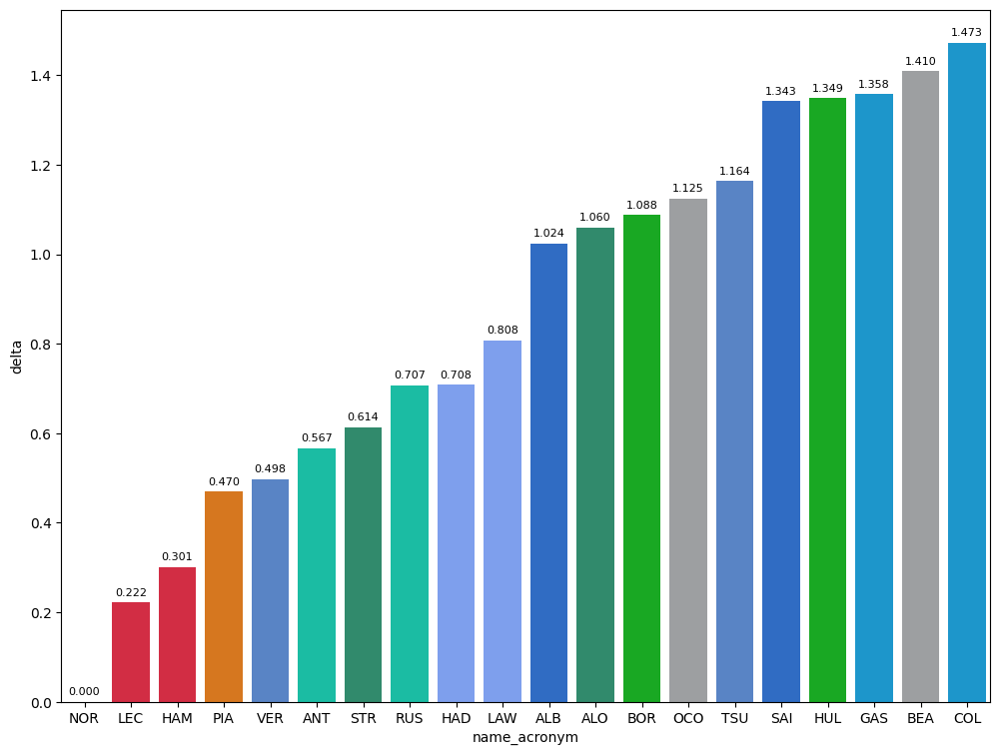

In [37]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

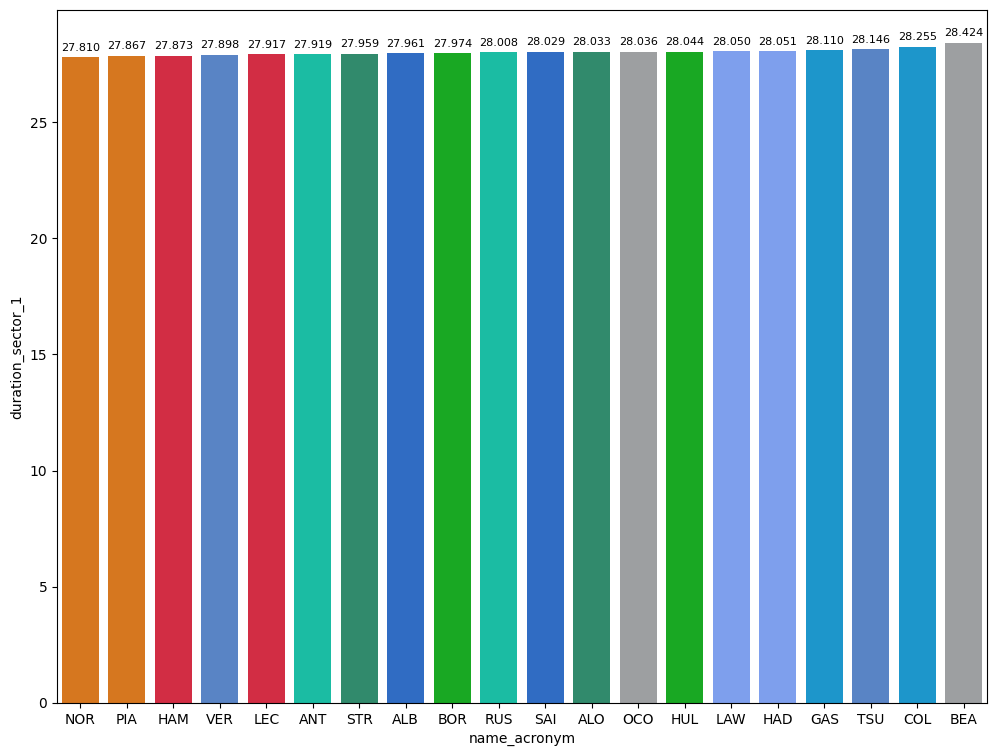

In [38]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

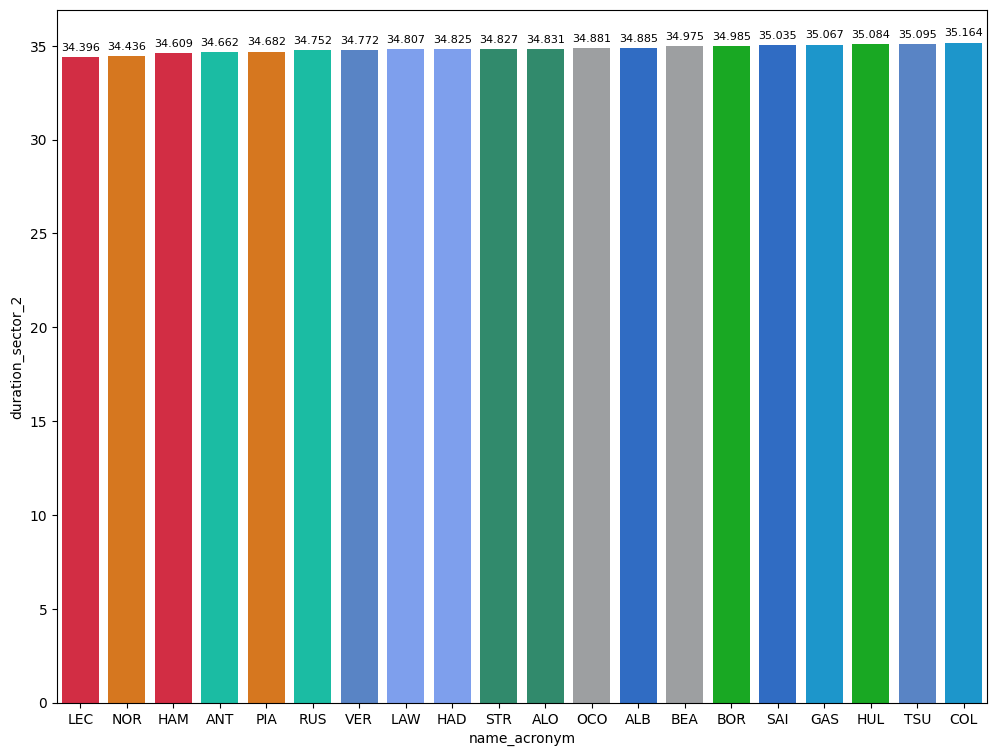

In [39]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

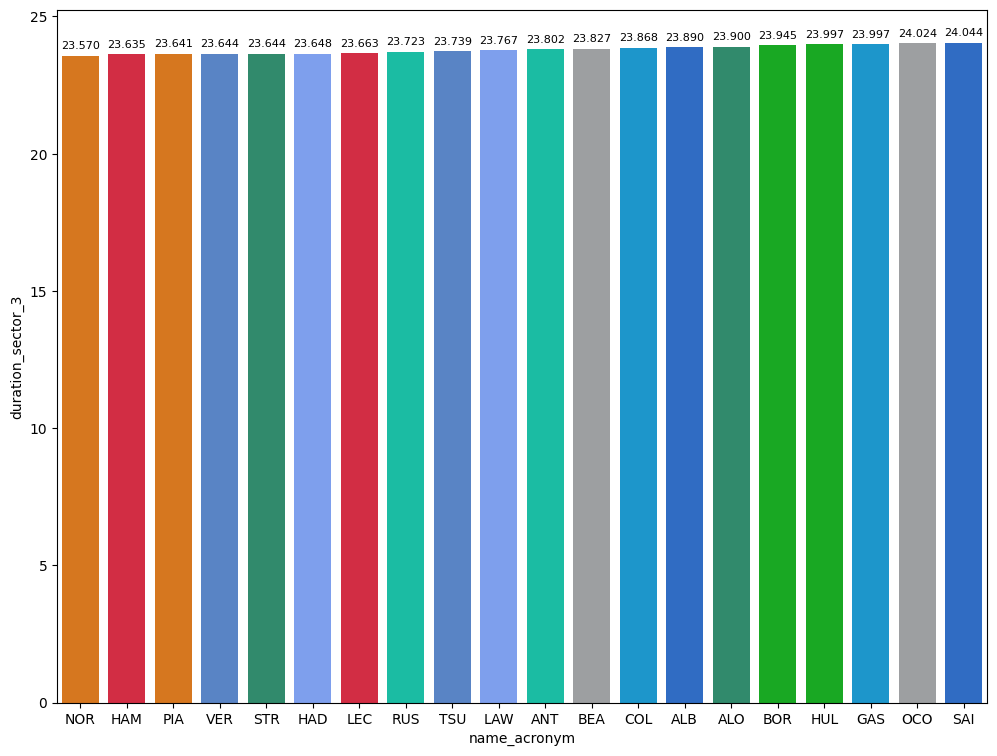

In [40]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [42]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 94").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,89.741429
MEDIUM,91.531934
HARD,91.608000


### Long runs

In [146]:
MINIMUN_SECONDS = 92
MAXIMUM_SECONDS = 120

#### Red Bull Racing

In [147]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1277,9947,1,1,1,11,INTERMEDIATE,0
14,1277,9947,1,22,1,11,INTERMEDIATE,0
30,1277,9947,2,1,12,41,INTERMEDIATE,0
32,1277,9947,2,22,12,41,INTERMEDIATE,0
42,1277,9947,3,22,42,51,MEDIUM,0
43,1277,9947,3,1,42,52,MEDIUM,0


In [148]:
data = libraryDataF1.getinfolongruns(jointables2,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

NameError: name 'jointables2' is not defined

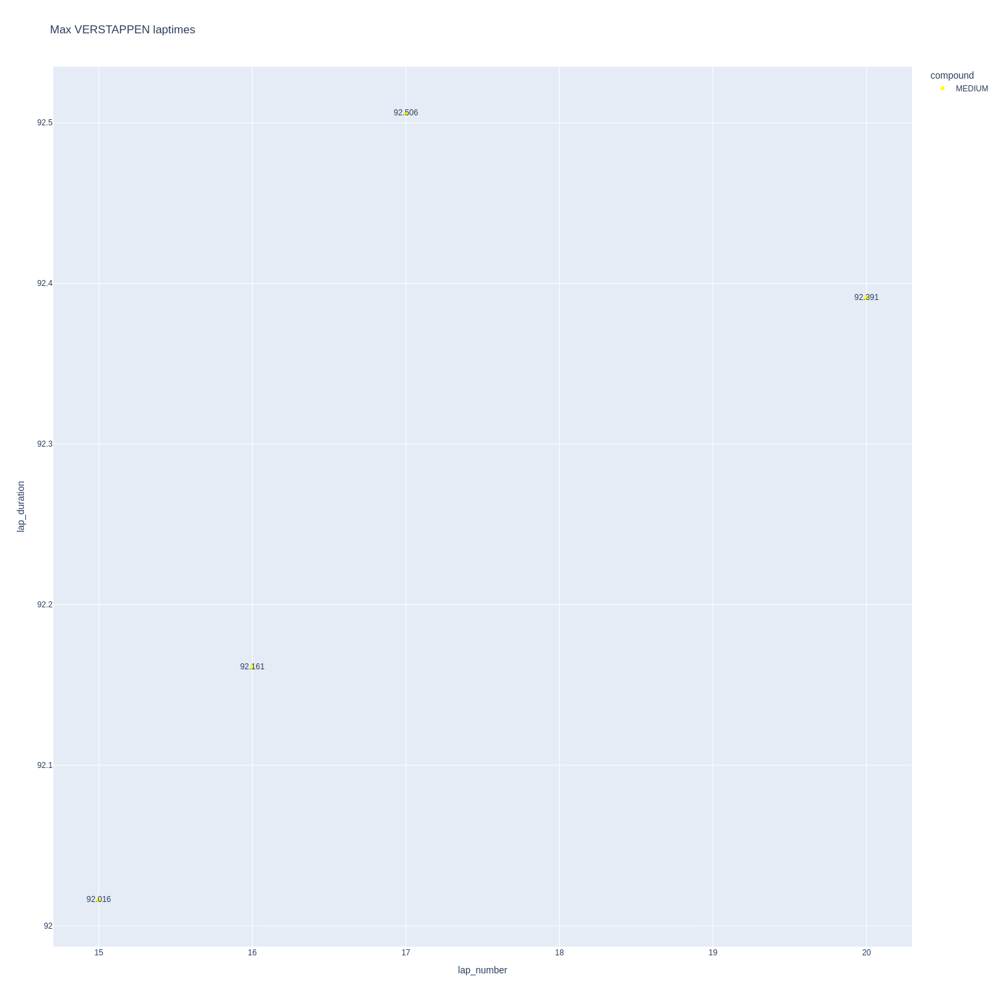

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

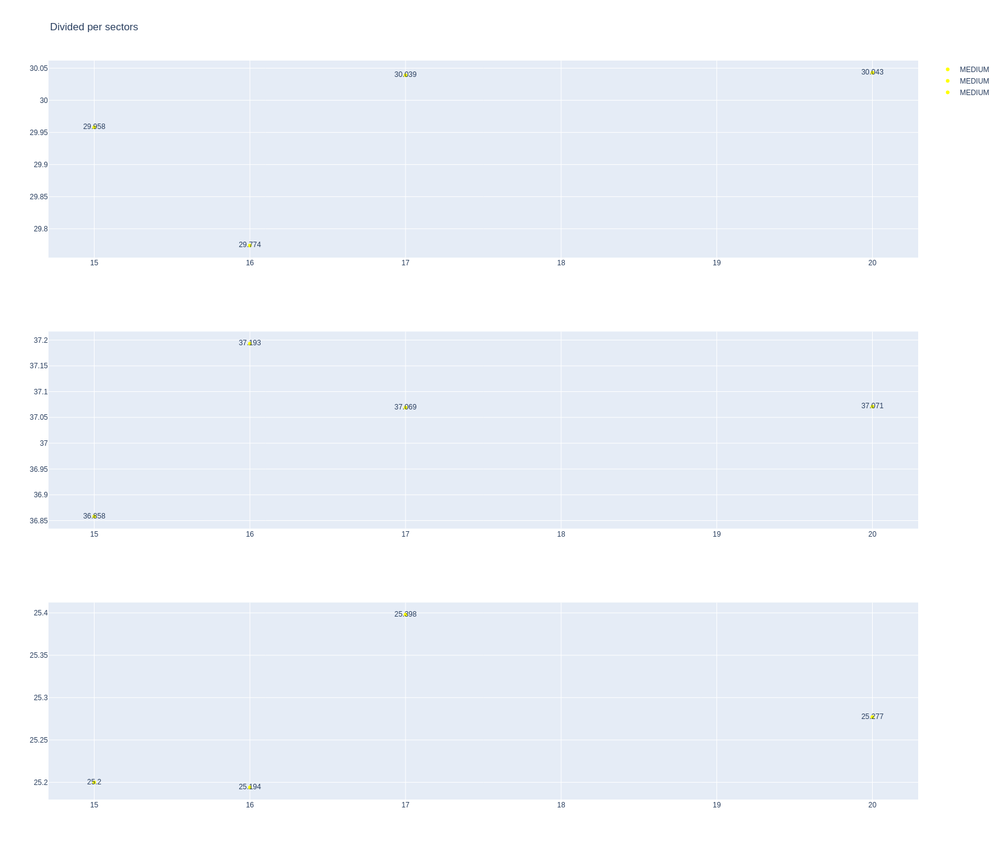

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
414,Yuki TSUNODA,MEDIUM,2025-07-04T15:53:38.333000+00:00,19,29.983,37.859,25.653,93.495
434,Yuki TSUNODA,MEDIUM,2025-07-04T15:55:11.786000+00:00,20,30.137,37.801,25.635,93.573
473,Yuki TSUNODA,MEDIUM,2025-07-04T15:58:20.276000+00:00,22,30.263,37.613,25.505,93.381
493,Yuki TSUNODA,MEDIUM,2025-07-04T15:59:53.629000+00:00,23,30.127,37.365,25.349,92.841


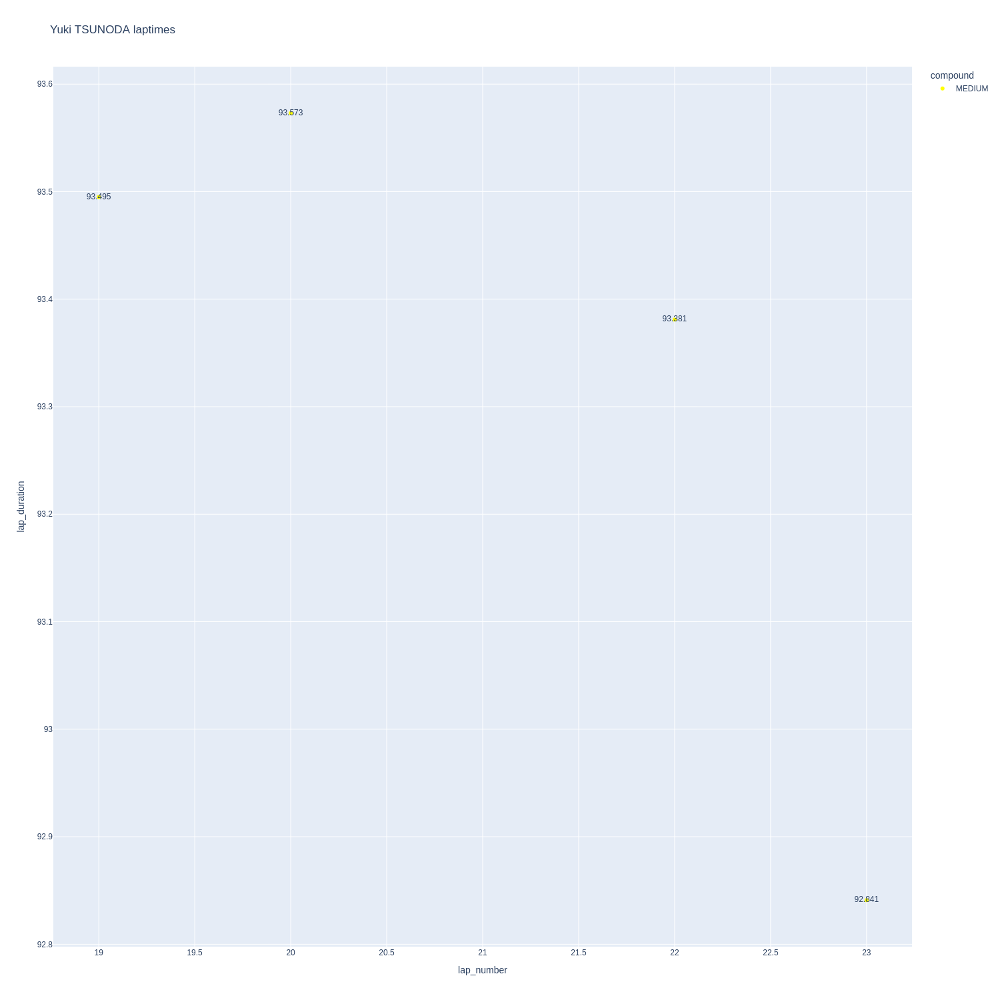

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

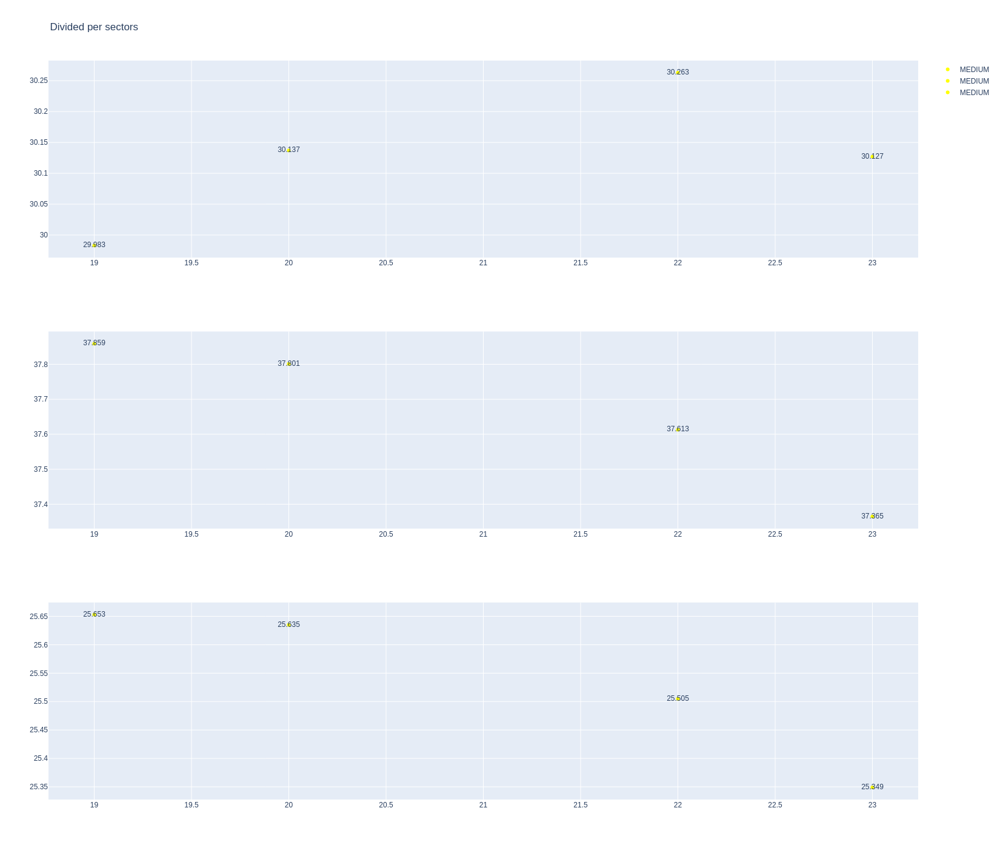

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [ ]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
12,1277,9941,1,16,1,6,MEDIUM,0
13,1277,9941,1,44,1,6,MEDIUM,0
33,1277,9941,2,16,7,9,MEDIUM,6
38,1277,9941,2,44,7,10,MEDIUM,6
49,1277,9941,3,16,10,12,SOFT,0
59,1277,9941,3,44,11,15,SOFT,0
66,1277,9941,4,16,13,15,SOFT,3
80,1277,9941,4,44,16,22,MEDIUM,10
84,1277,9941,5,16,16,29,MEDIUM,9
91,1277,9941,5,44,23,29,SOFT,5


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
356,Charles LECLERC,MEDIUM,2025-07-04T15:48:51.648000+00:00,20,29.972,36.949,25.222,92.143
374,Charles LECLERC,MEDIUM,2025-07-04T15:50:23.934000+00:00,21,30.257,37.164,25.134,92.555
393,Charles LECLERC,MEDIUM,2025-07-04T15:51:56.375000+00:00,22,30.053,37.064,25.483,92.600
412,Charles LECLERC,MEDIUM,2025-07-04T15:53:28.962000+00:00,23,30.196,36.970,25.448,92.614
432,Charles LECLERC,MEDIUM,2025-07-04T15:55:01.614000+00:00,24,30.194,36.929,25.137,92.260
451,Charles LECLERC,MEDIUM,2025-07-04T15:56:34.676000+00:00,25,30.339,36.994,25.189,92.522
470,Charles LECLERC,MEDIUM,2025-07-04T15:58:06.342000+00:00,26,30.048,37.079,25.310,92.437
490,Charles LECLERC,MEDIUM,2025-07-04T15:59:38.871000+00:00,27,30.114,36.807,25.189,92.110


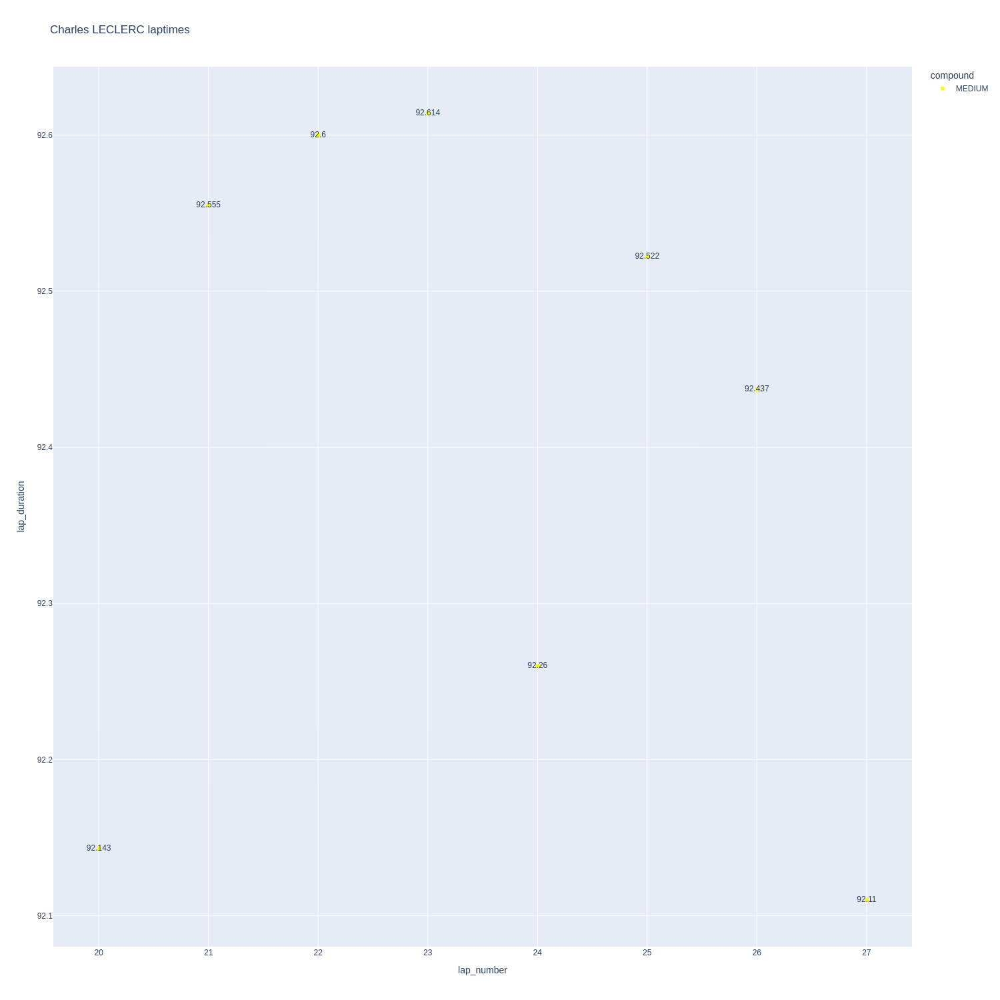

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

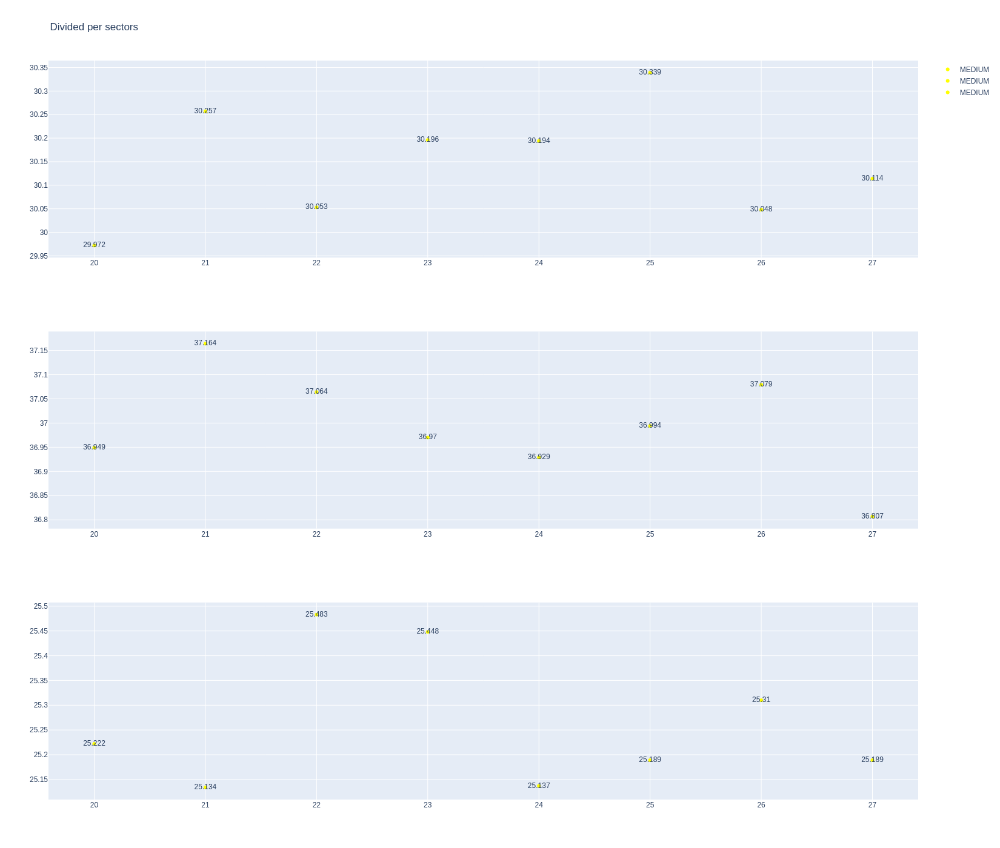

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
332,Lewis HAMILTON,MEDIUM,2025-07-04T15:46:40.468000+00:00,19,29.882,37.215,25.414,92.511
348,Lewis HAMILTON,MEDIUM,2025-07-04T15:48:13.114000+00:00,20,30.363,37.829,25.619,93.811
365,Lewis HAMILTON,MEDIUM,2025-07-04T15:49:46.834000+00:00,21,30.328,37.562,25.515,93.405
430,Lewis HAMILTON,SOFT,2025-07-04T15:54:54.223000+00:00,24,30.040,37.542,25.343,92.925
450,Lewis HAMILTON,SOFT,2025-07-04T15:56:27.122000+00:00,25,30.001,37.016,25.317,92.334


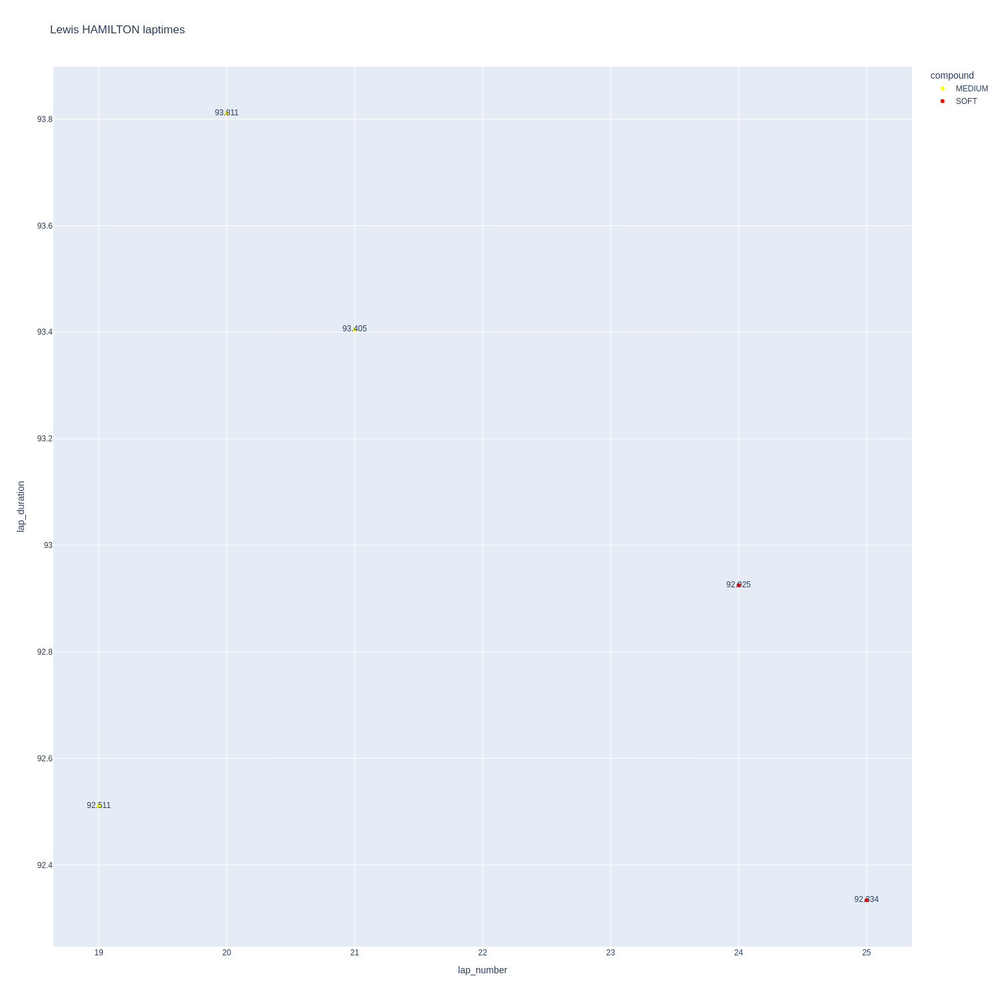

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

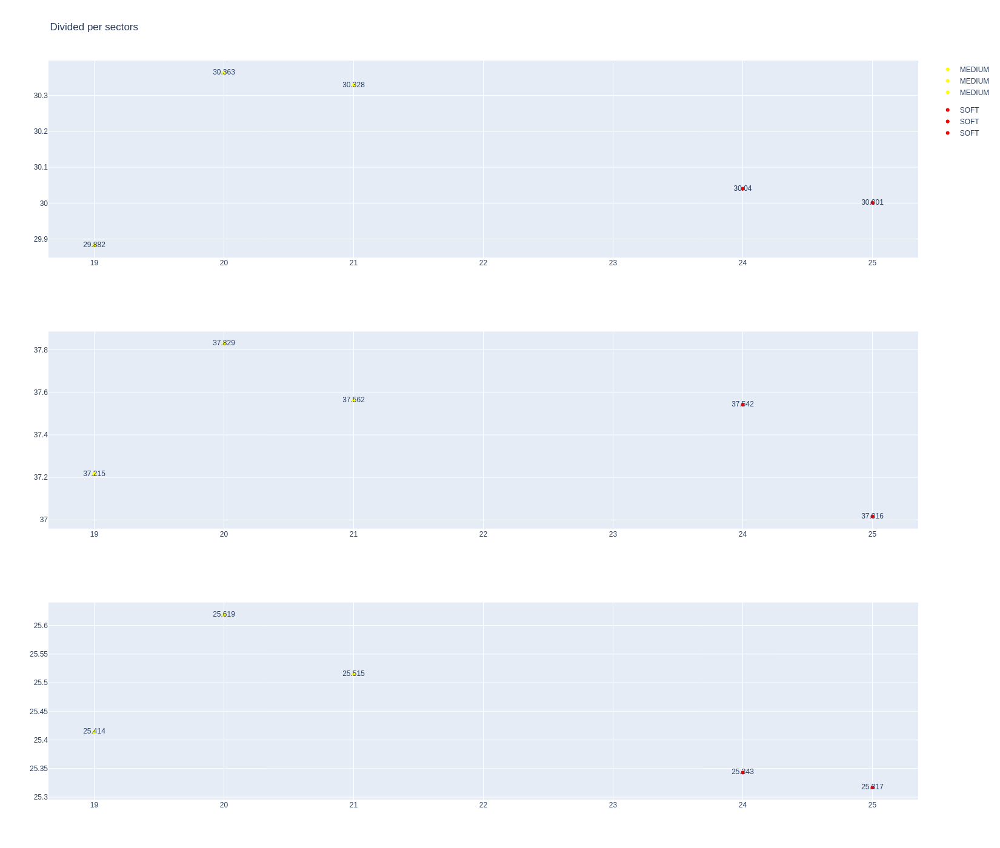

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [ ]:
stintInformation.query('driver_number == 63 or driver_number == 12')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1277,9941,1,12,1,3,MEDIUM,0
2,1277,9941,1,63,1,3,MEDIUM,0
21,1277,9941,2,12,4,6,MEDIUM,3
22,1277,9941,2,63,4,6,MEDIUM,3
35,1277,9941,3,12,7,9,SOFT,0
36,1277,9941,3,63,7,9,SOFT,0
51,1277,9941,4,63,10,12,SOFT,3
55,1277,9941,4,12,10,15,MEDIUM,6
70,1277,9941,5,63,13,27,MEDIUM,6
83,1277,9941,5,12,16,28,MEDIUM,12


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
246,Kimi ANTONELLI,MEDIUM,2025-07-04T15:35:02.471000+00:00,11,29.756,37.281,25.606,92.643
258,Kimi ANTONELLI,MEDIUM,2025-07-04T15:36:34.924000+00:00,12,29.909,37.258,25.490,92.657
278,Kimi ANTONELLI,MEDIUM,2025-07-04T15:39:39.673000+00:00,14,29.711,37.233,25.376,92.320
288,Kimi ANTONELLI,MEDIUM,2025-07-04T15:41:11.950000+00:00,15,30.054,37.172,25.082,92.308
318,Kimi ANTONELLI,MEDIUM,2025-07-04T15:44:57.885000+00:00,17,29.860,37.170,25.382,92.412
346,Kimi ANTONELLI,MEDIUM,2025-07-04T15:48:06.964000+00:00,19,30.103,37.392,25.452,92.947
364,Kimi ANTONELLI,MEDIUM,2025-07-04T15:49:39.931000+00:00,20,30.222,37.316,25.447,92.985
383,Kimi ANTONELLI,MEDIUM,2025-07-04T15:51:12.875000+00:00,21,30.259,37.492,25.465,93.216
402,Kimi ANTONELLI,MEDIUM,2025-07-04T15:52:46.146000+00:00,22,30.228,37.494,25.421,93.143
422,Kimi ANTONELLI,MEDIUM,2025-07-04T15:54:19.276000+00:00,23,30.316,37.382,25.476,93.174


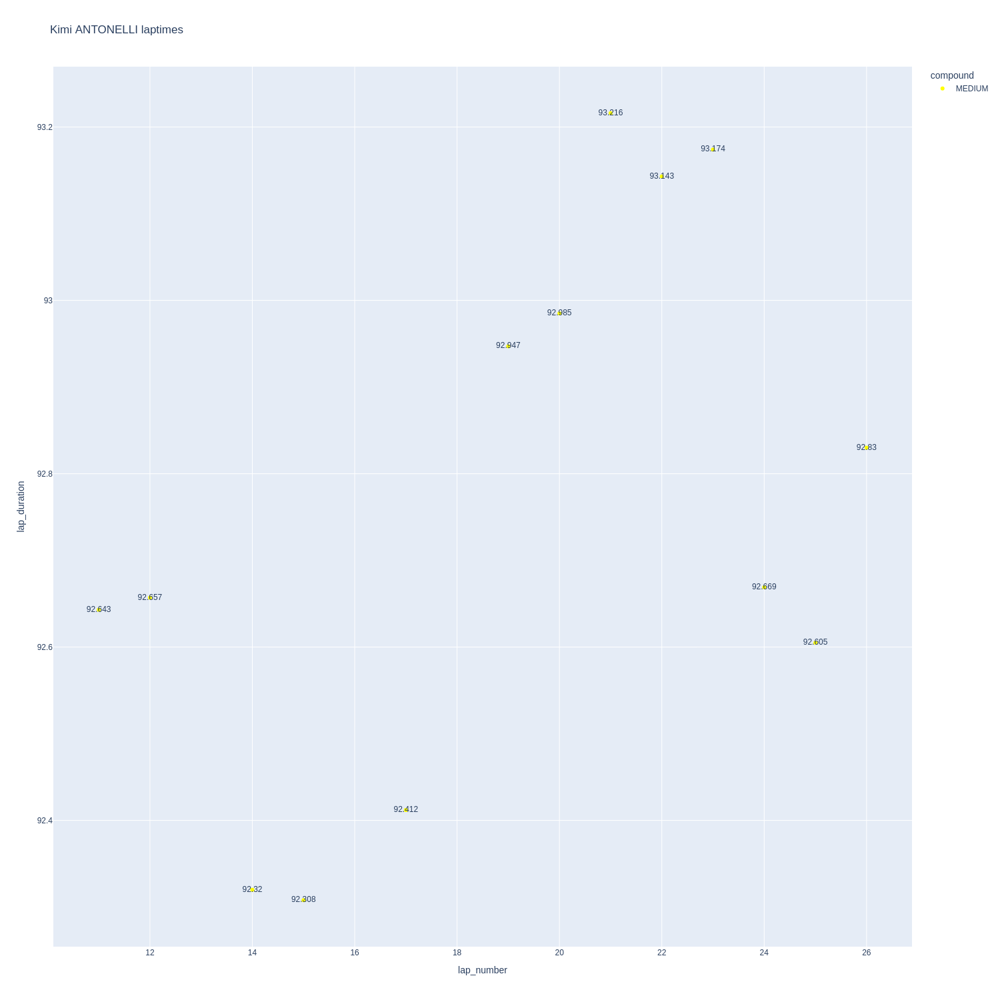

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

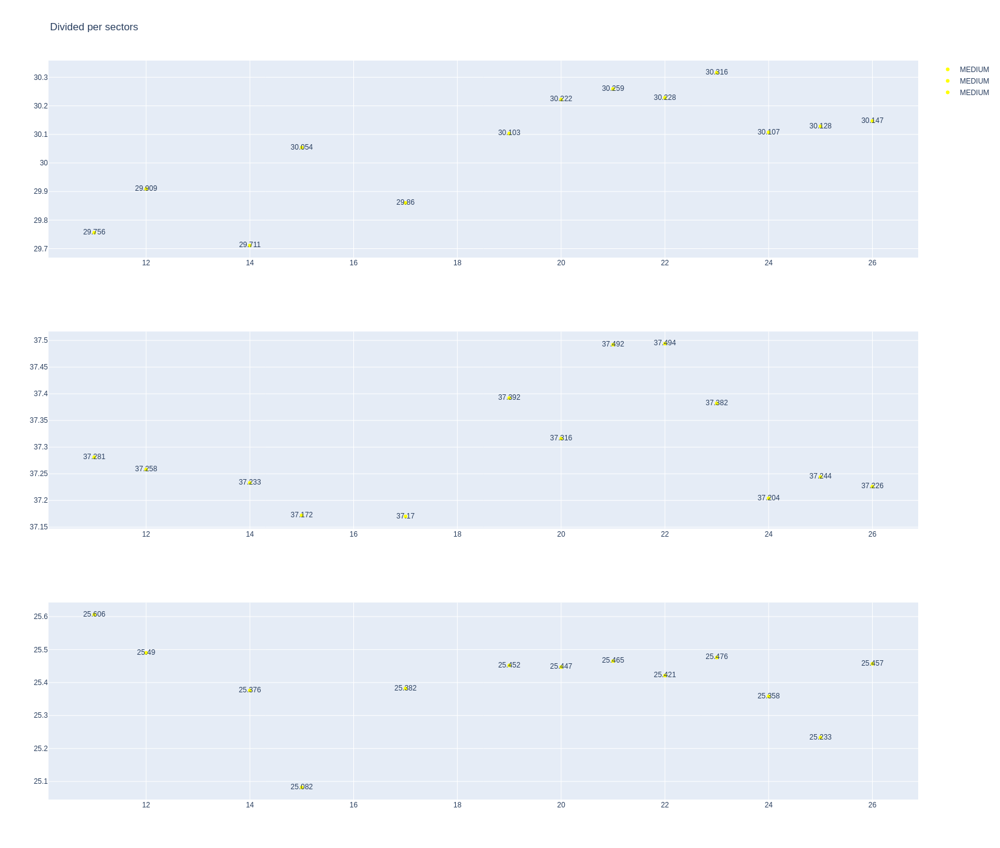

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
298,George RUSSELL,MEDIUM,2025-07-04T15:42:16.410000+00:00,14,29.857,37.394,25.342,92.593
309,George RUSSELL,MEDIUM,2025-07-04T15:43:49.039000+00:00,15,30.044,37.754,25.350,93.148
321,George RUSSELL,MEDIUM,2025-07-04T15:45:22.091000+00:00,16,30.486,37.571,25.413,93.470
335,George RUSSELL,MEDIUM,2025-07-04T15:46:55.571000+00:00,17,30.336,37.521,25.462,93.319
351,George RUSSELL,MEDIUM,2025-07-04T15:48:28.865000+00:00,18,30.342,37.168,25.431,92.941
369,George RUSSELL,MEDIUM,2025-07-04T15:50:01.800000+00:00,19,30.177,37.153,25.295,92.625
388,George RUSSELL,MEDIUM,2025-07-04T15:51:34.475000+00:00,20,30.190,37.290,25.439,92.919
407,George RUSSELL,MEDIUM,2025-07-04T15:53:07.409000+00:00,21,30.423,37.032,25.412,92.867
426,George RUSSELL,MEDIUM,2025-07-04T15:54:40.333000+00:00,22,30.248,37.034,25.189,92.471
446,George RUSSELL,MEDIUM,2025-07-04T15:56:12.775000+00:00,23,30.217,37.000,25.443,92.660


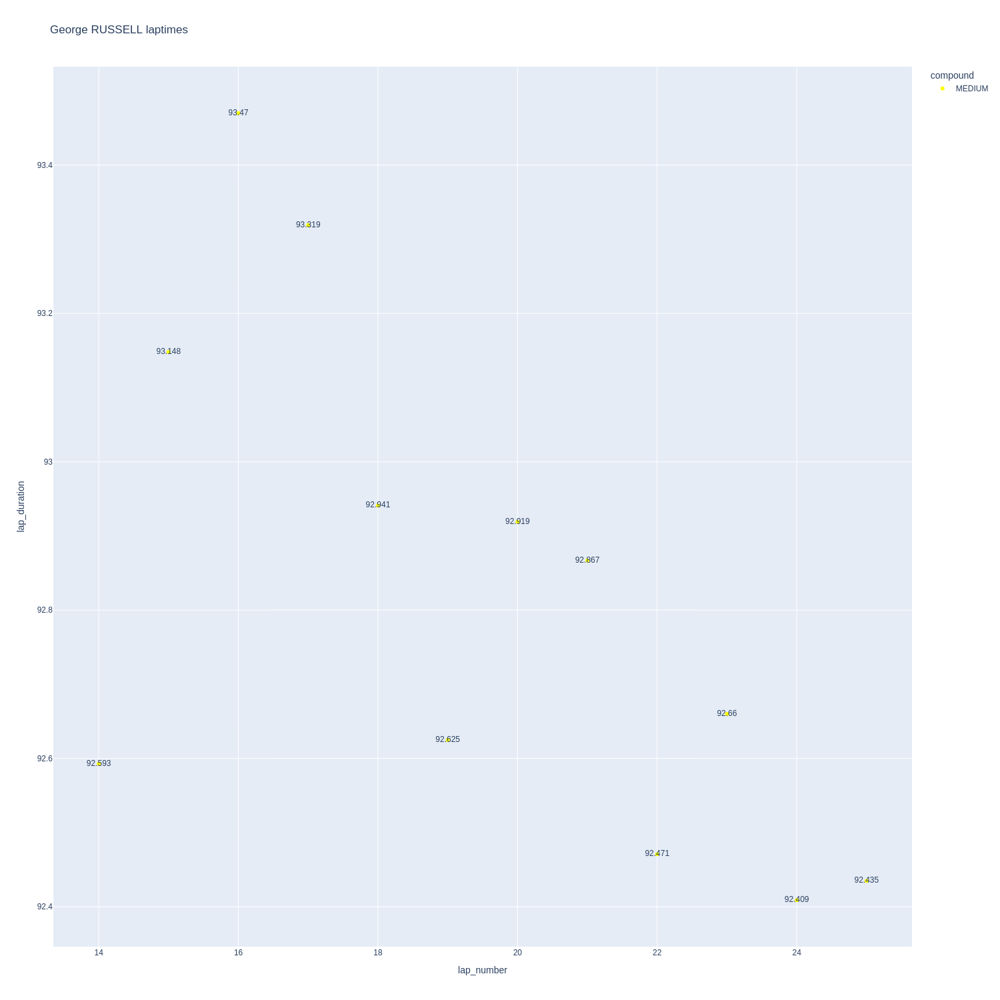

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

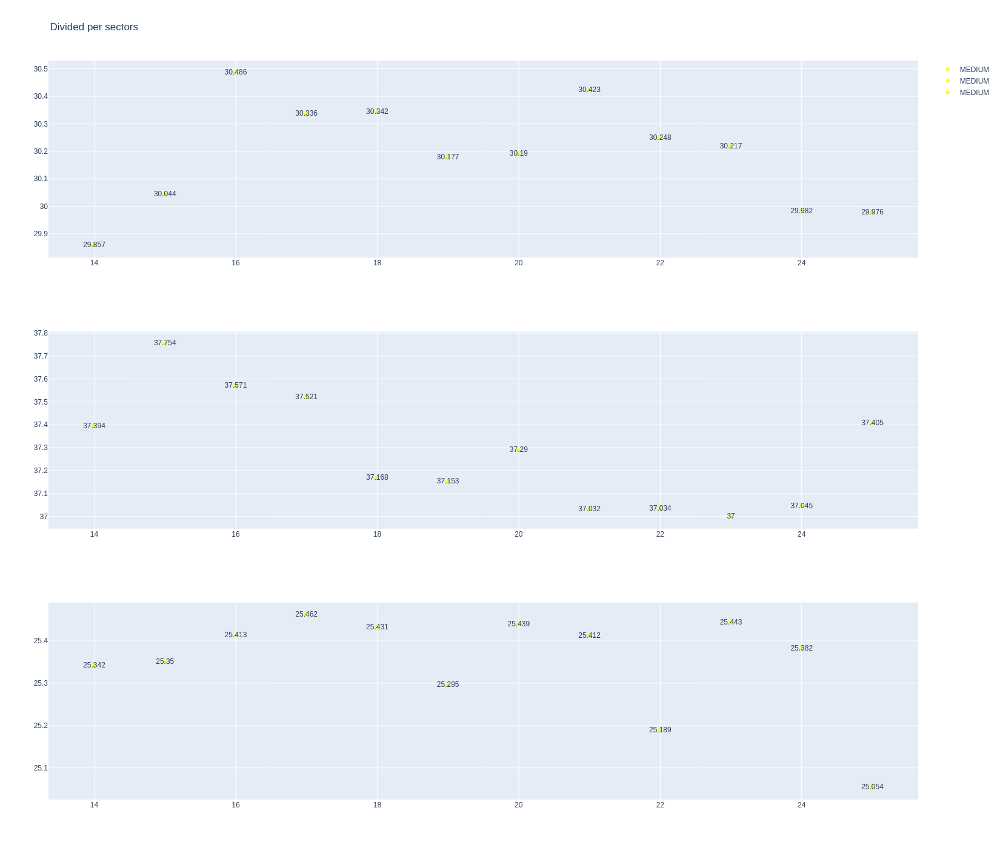

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [ ]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1277,9941,1,81,1,3,MEDIUM,0
9,1277,9941,1,4,1,6,MEDIUM,0
23,1277,9941,2,81,4,6,MEDIUM,3
30,1277,9941,2,4,7,9,MEDIUM,6
37,1277,9941,3,81,7,9,MEDIUM,6
52,1277,9941,4,81,10,12,SOFT,9
54,1277,9941,3,4,10,15,SOFT,0
67,1277,9941,5,81,13,16,SOFT,3
81,1277,9941,4,4,16,23,MEDIUM,9
86,1277,9941,6,81,17,27,MEDIUM,9


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
366,Lando NORRIS,MEDIUM,2025-07-04T15:49:48.405000+00:00,18,29.801,37.122,25.445,92.368
385,Lando NORRIS,MEDIUM,2025-07-04T15:51:20.804000+00:00,19,29.925,37.113,25.175,92.213
404,Lando NORRIS,MEDIUM,2025-07-04T15:52:52.994000+00:00,20,29.929,37.092,25.276,92.297
424,Lando NORRIS,MEDIUM,2025-07-04T15:54:25.276000+00:00,21,30.010,37.269,25.083,92.362
443,Lando NORRIS,MEDIUM,2025-07-04T15:55:57.647000+00:00,22,30.235,36.971,25.117,92.323


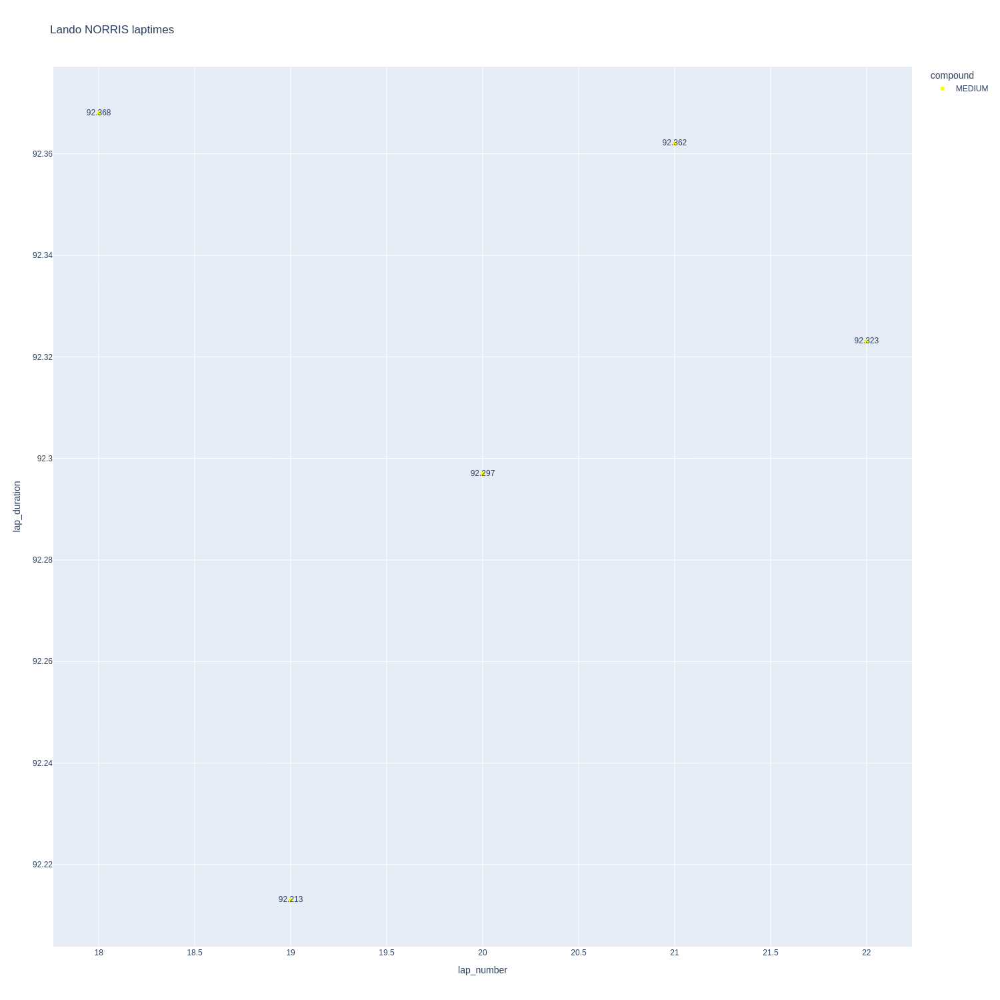

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

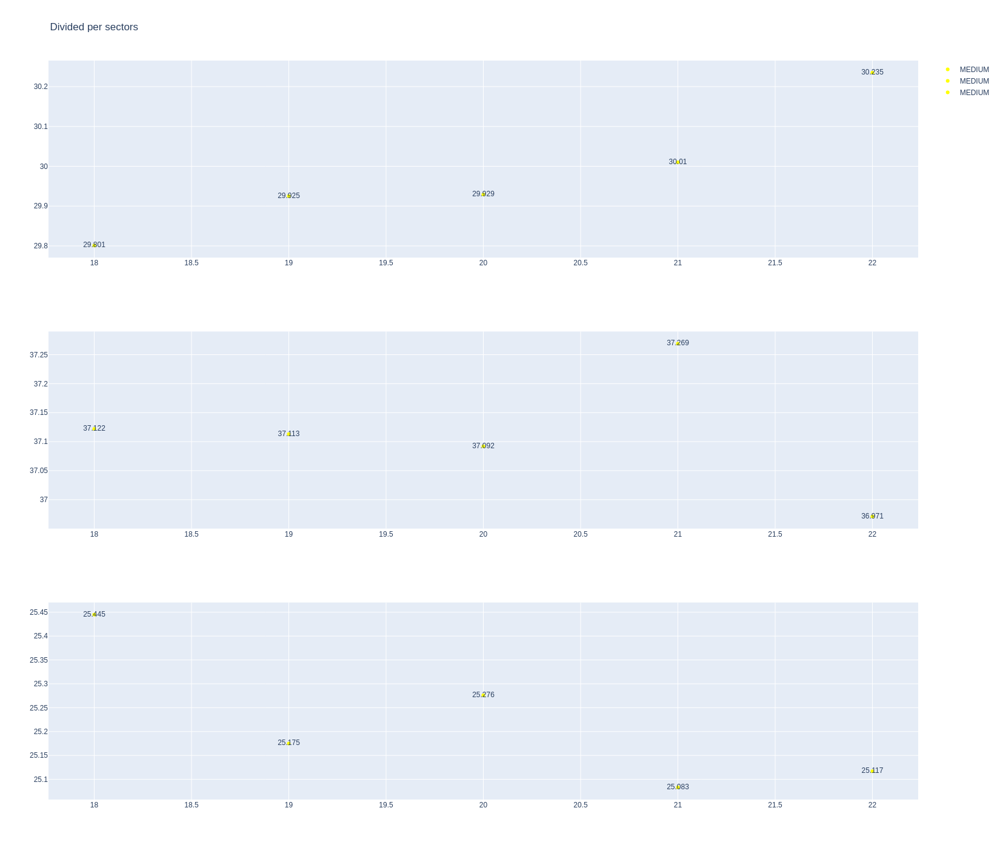

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
352,Oscar PIASTRI,MEDIUM,2025-07-04T15:48:33.875000+00:00,18,29.483,37.182,25.617,92.282
370,Oscar PIASTRI,MEDIUM,2025-07-04T15:50:05.534000+00:00,19,29.787,37.273,25.511,92.571
389,Oscar PIASTRI,MEDIUM,2025-07-04T15:51:38.120000+00:00,20,29.800,37.374,25.251,92.425
408,Oscar PIASTRI,MEDIUM,2025-07-04T15:53:10.683000+00:00,21,30.064,37.091,25.162,92.317
427,Oscar PIASTRI,MEDIUM,2025-07-04T15:54:42.895000+00:00,22,29.975,37.061,25.071,92.107
447,Oscar PIASTRI,MEDIUM,2025-07-04T15:56:15.094000+00:00,23,29.977,37.124,25.187,92.288
487,Oscar PIASTRI,MEDIUM,2025-07-04T15:59:23.686000+00:00,25,30.043,37.028,25.125,92.196


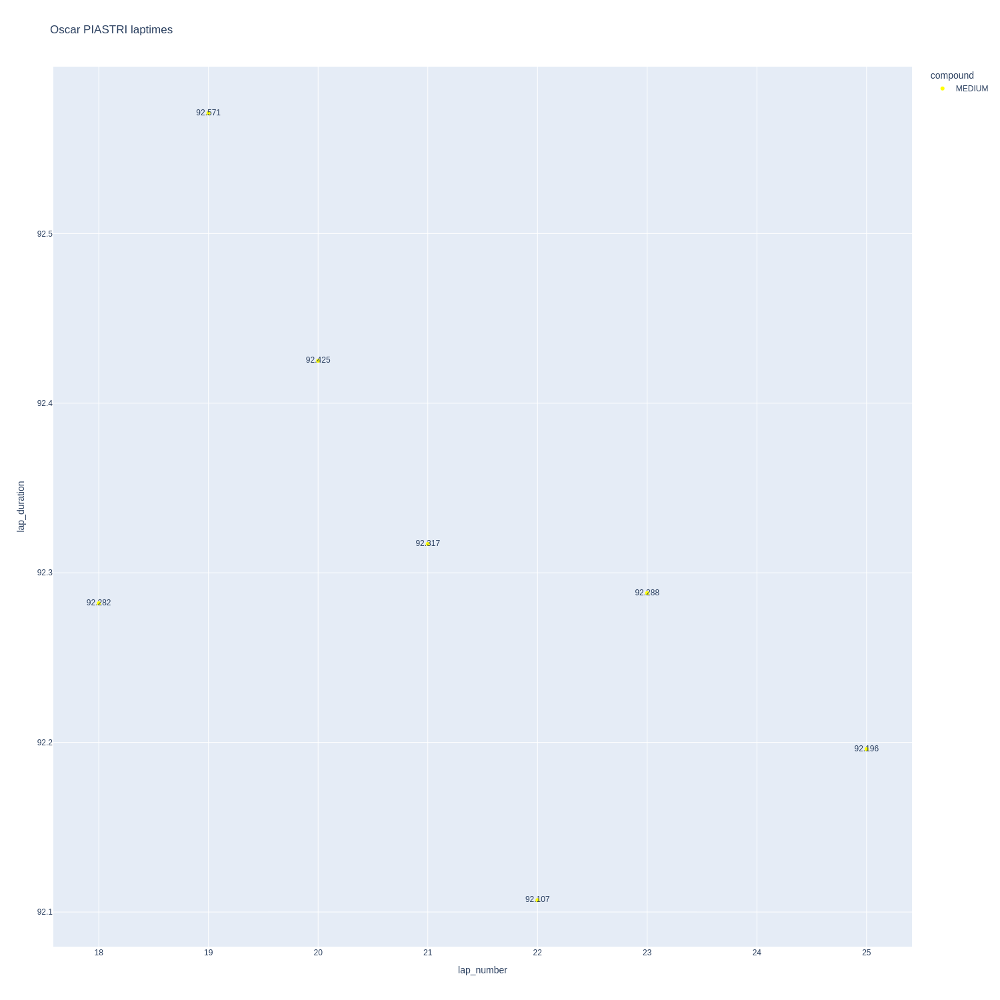

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

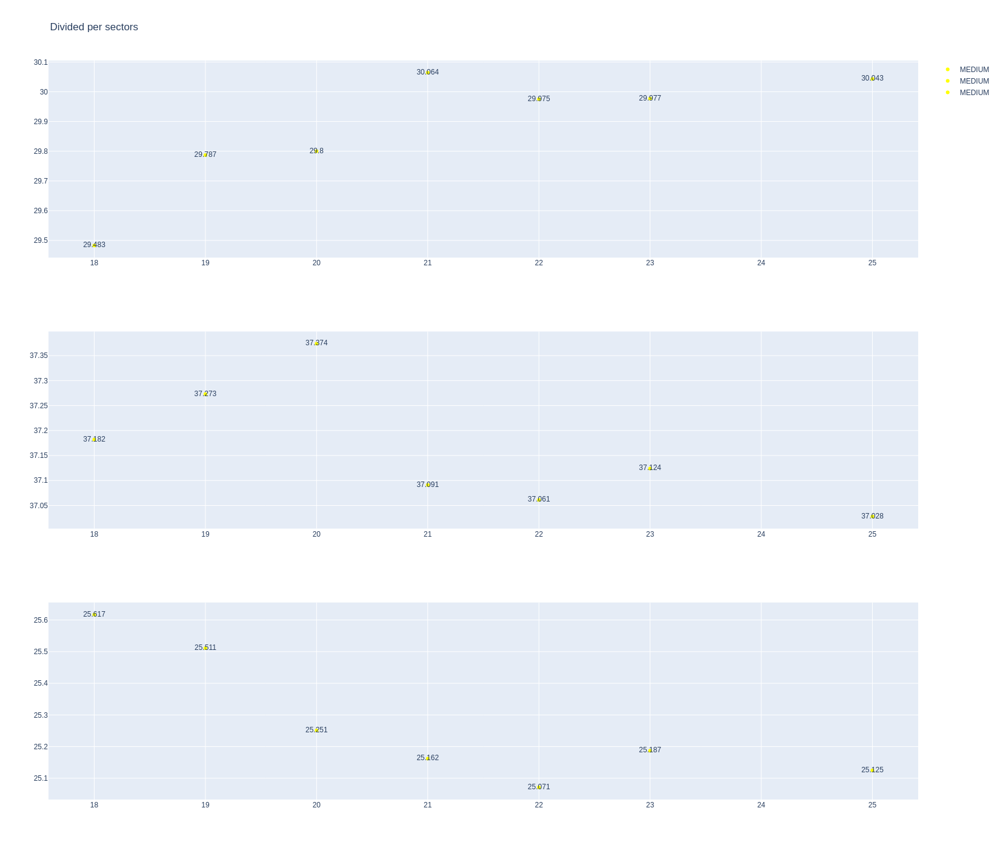

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [ ]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
5,1277,9941,1,18,1,5,MEDIUM,0
17,1277,9941,1,14,1,8,MEDIUM,0
24,1277,9941,2,18,6,8,MEDIUM,5
41,1277,9941,2,14,9,11,SOFT,0
42,1277,9941,3,18,9,11,SOFT,0
61,1277,9941,3,14,12,14,SOFT,0
62,1277,9941,4,18,12,14,SOFT,3
75,1277,9941,4,14,15,24,MEDIUM,8
76,1277,9941,5,18,15,24,MEDIUM,8


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
368,Fernando ALONSO,MEDIUM,2025-07-04T15:49:58.391000+00:00,16,29.740,37.838,25.839,93.417
387,Fernando ALONSO,MEDIUM,2025-07-04T15:51:31.806000+00:00,17,29.907,37.718,25.739,93.364
406,Fernando ALONSO,MEDIUM,2025-07-04T15:53:05.120000+00:00,18,30.060,37.413,25.661,93.134
425,Fernando ALONSO,MEDIUM,2025-07-04T15:54:38.324000+00:00,19,30.029,37.439,25.602,93.070
445,Fernando ALONSO,MEDIUM,2025-07-04T15:56:11.398000+00:00,20,30.104,37.347,25.510,92.961
465,Fernando ALONSO,MEDIUM,2025-07-04T15:57:44.337000+00:00,21,29.960,37.363,25.551,92.874
484,Fernando ALONSO,MEDIUM,2025-07-04T15:59:17.224000+00:00,22,30.086,37.524,26.194,93.804


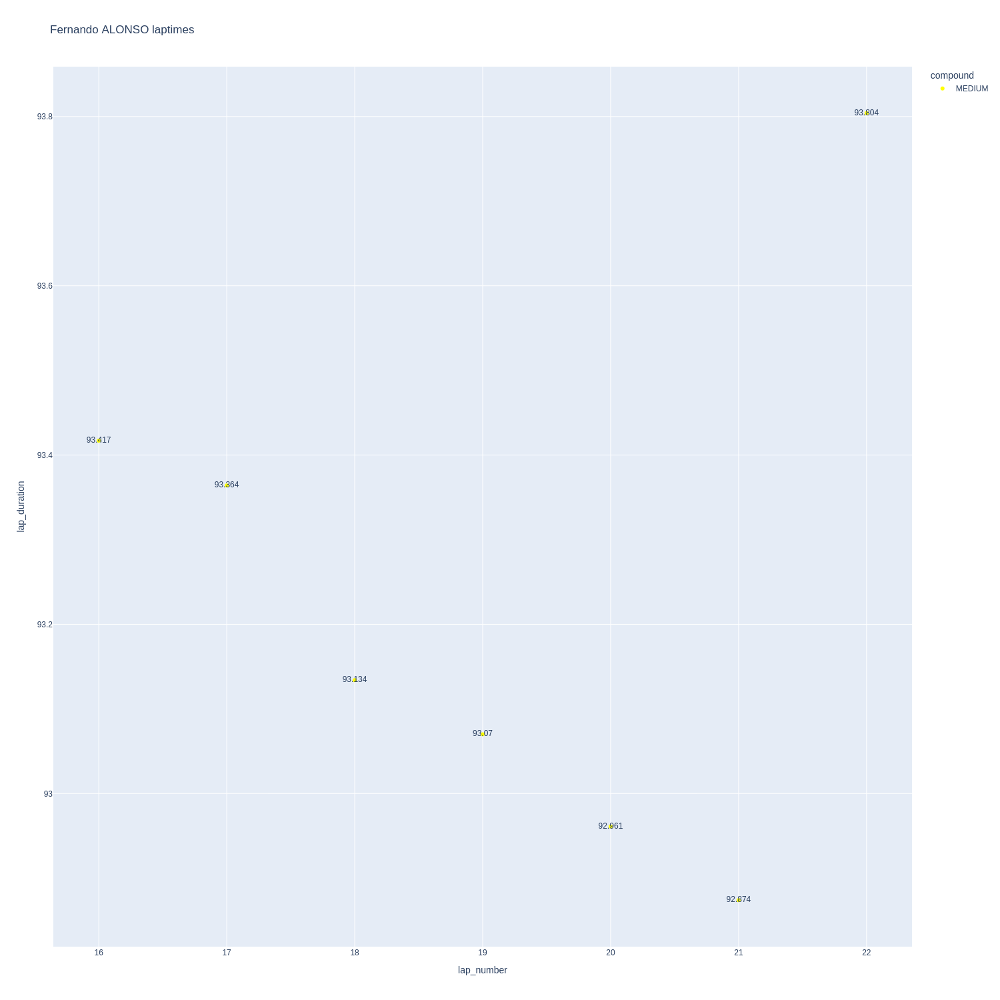

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

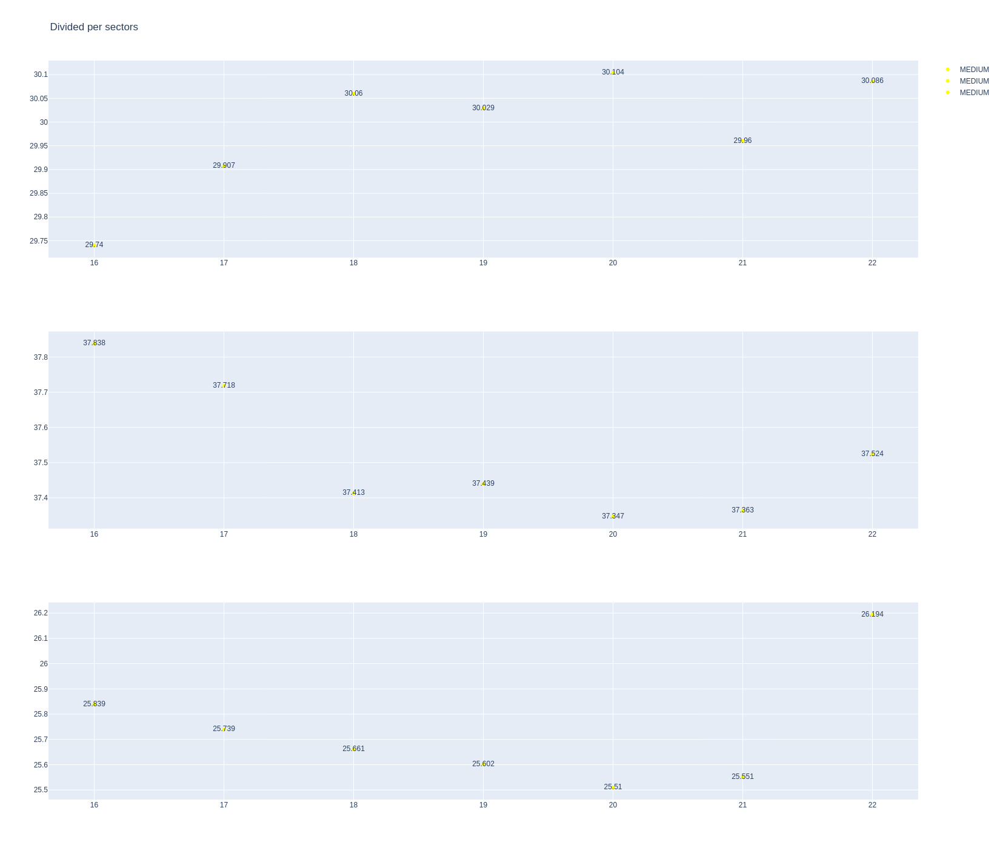

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
375,Lance STROLL,MEDIUM,2025-07-04T15:50:26.922000+00:00,16,29.663,37.585,25.164,92.412
394,Lance STROLL,MEDIUM,2025-07-04T15:51:59.258000+00:00,17,29.869,37.620,25.493,92.982
413,Lance STROLL,MEDIUM,2025-07-04T15:53:32.208000+00:00,18,30.174,37.621,25.552,93.347
433,Lance STROLL,MEDIUM,2025-07-04T15:55:05.598000+00:00,19,30.086,37.713,25.379,93.178
452,Lance STROLL,MEDIUM,2025-07-04T15:56:38.827000+00:00,20,30.301,37.530,25.578,93.409
492,Lance STROLL,MEDIUM,2025-07-04T15:59:48.473000+00:00,22,30.099,37.619,25.599,93.317


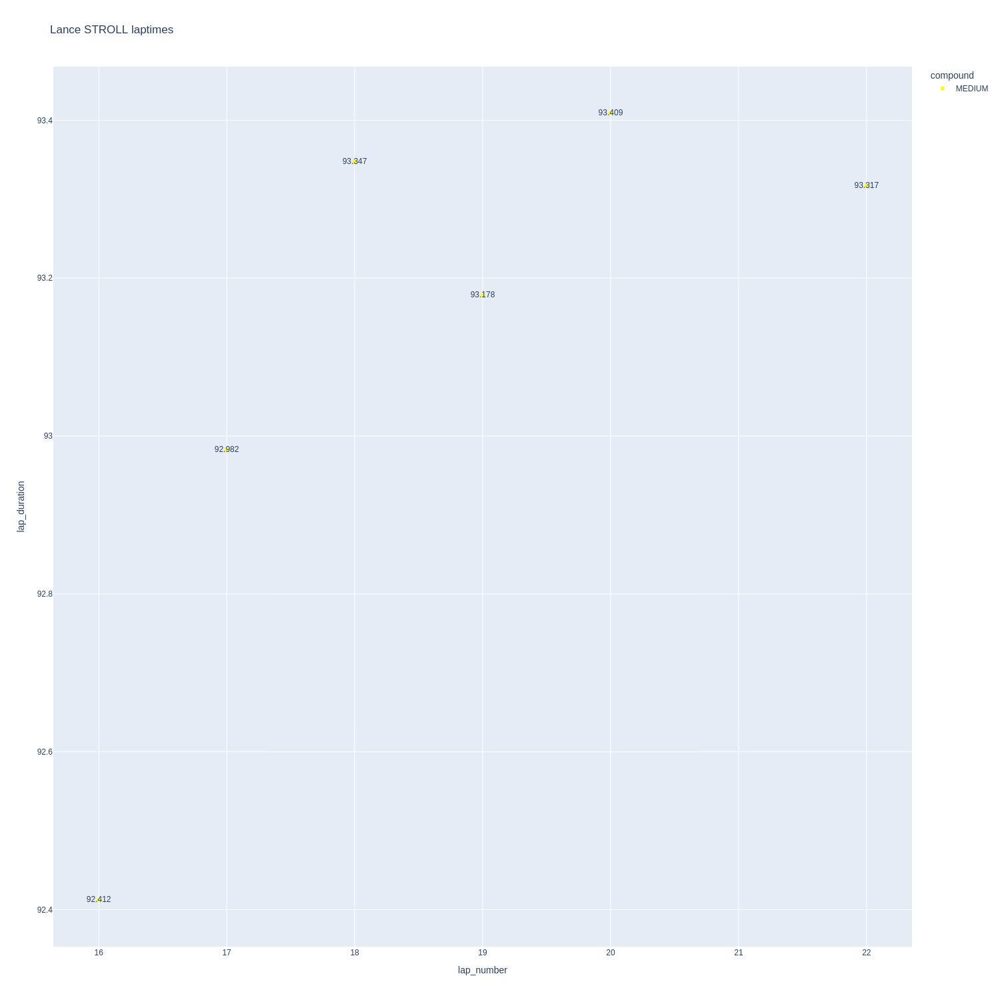

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

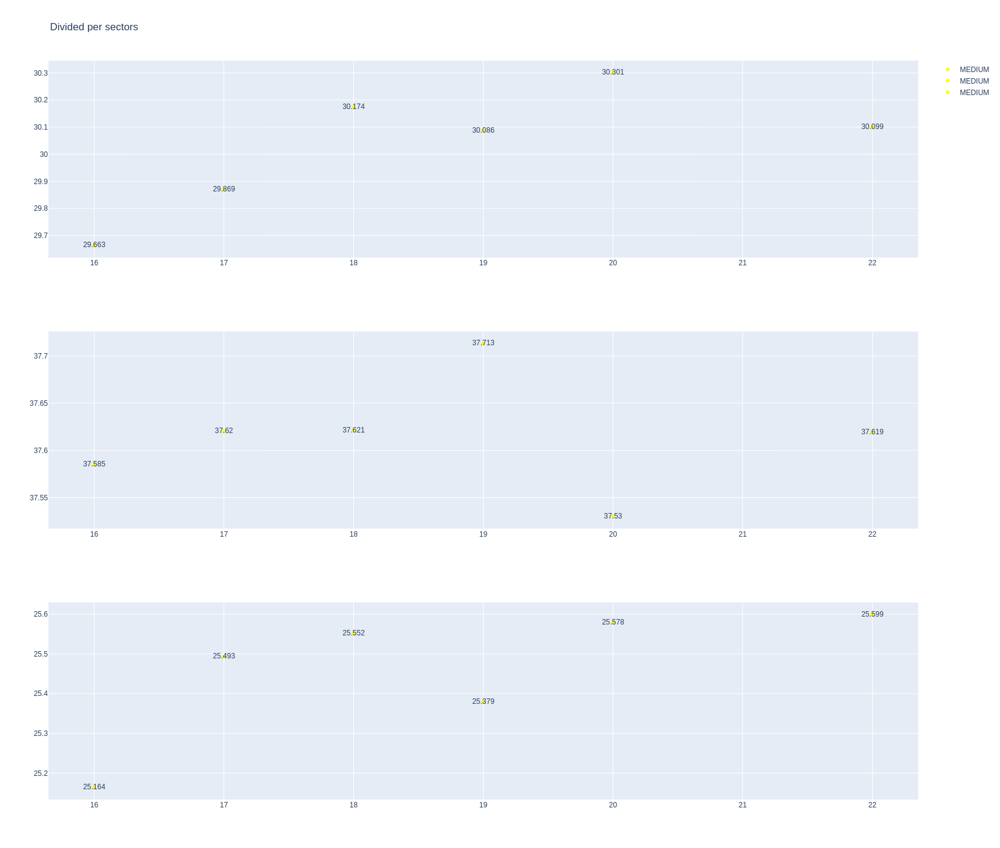

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [ ]:
stintInformation.query('driver_number == 30 or driver_number == 6')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1277,9941,1,6,1,6,MEDIUM,0
16,1277,9941,1,30,1,7,MEDIUM,0
31,1277,9941,2,6,7,9,SOFT,0
40,1277,9941,2,30,8,10,SOFT,0
56,1277,9941,3,6,10,24,SOFT,3
60,1277,9941,3,30,11,25,MEDIUM,7
93,1277,9941,4,6,25,27,MEDIUM,6
94,1277,9941,4,30,26,28,SOFT,3


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
262,Liam LAWSON,MEDIUM,2025-07-04T15:36:56.435000+00:00,12,29.883,37.919,25.855,93.657
273,Liam LAWSON,MEDIUM,2025-07-04T15:38:30.110000+00:00,13,29.963,37.907,25.939,93.809
281,Liam LAWSON,MEDIUM,2025-07-04T15:40:03.817000+00:00,14,30.078,37.774,25.753,93.605
293,Liam LAWSON,MEDIUM,2025-07-04T15:41:37.518000+00:00,15,30.040,37.975,25.947,93.962
305,Liam LAWSON,MEDIUM,2025-07-04T15:43:11.373000+00:00,16,30.042,37.885,25.695,93.622
317,Liam LAWSON,MEDIUM,2025-07-04T15:44:45.072000+00:00,17,29.978,37.859,25.594,93.431
329,Liam LAWSON,MEDIUM,2025-07-04T15:46:18.404000+00:00,18,30.101,37.704,25.493,93.298
343,Liam LAWSON,MEDIUM,2025-07-04T15:47:51.719000+00:00,19,30.302,37.675,25.504,93.481
361,Liam LAWSON,MEDIUM,2025-07-04T15:49:25.306000+00:00,20,30.331,37.524,25.503,93.358
380,Liam LAWSON,MEDIUM,2025-07-04T15:50:58.651000+00:00,21,30.050,37.670,25.245,92.965


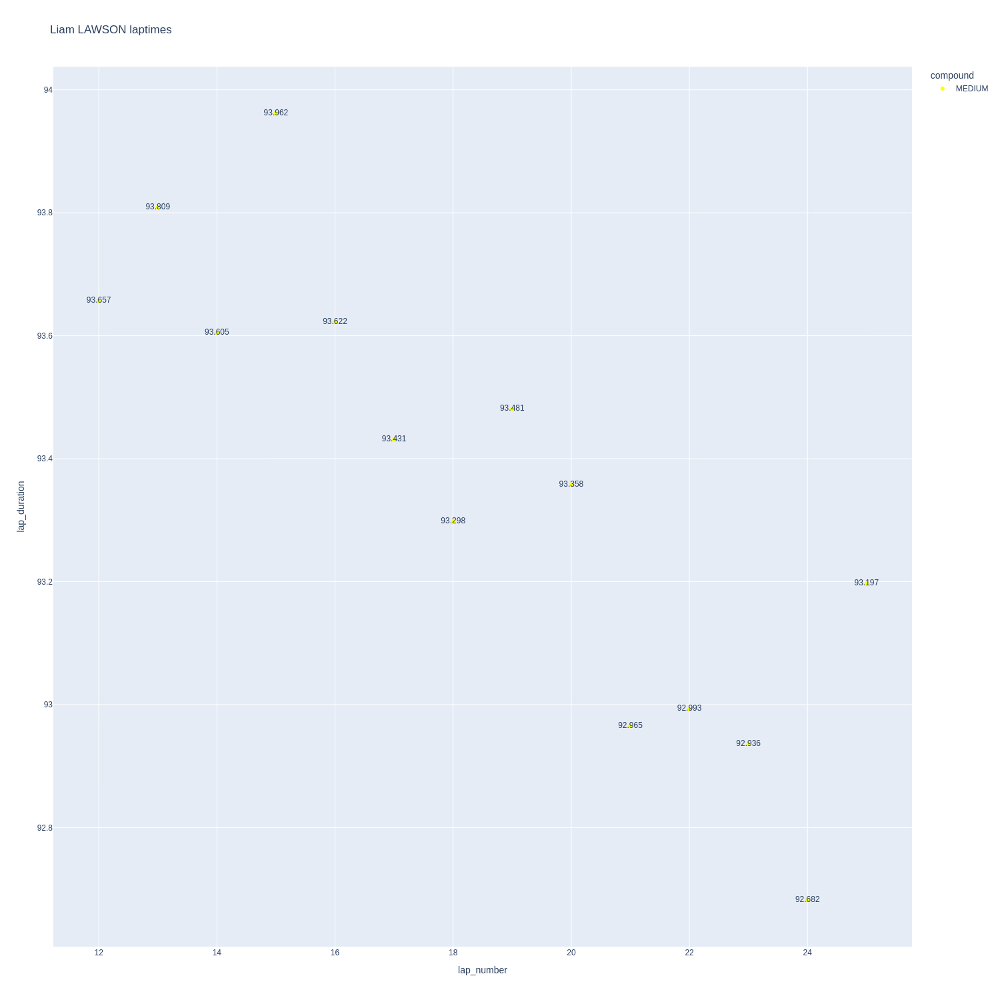

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

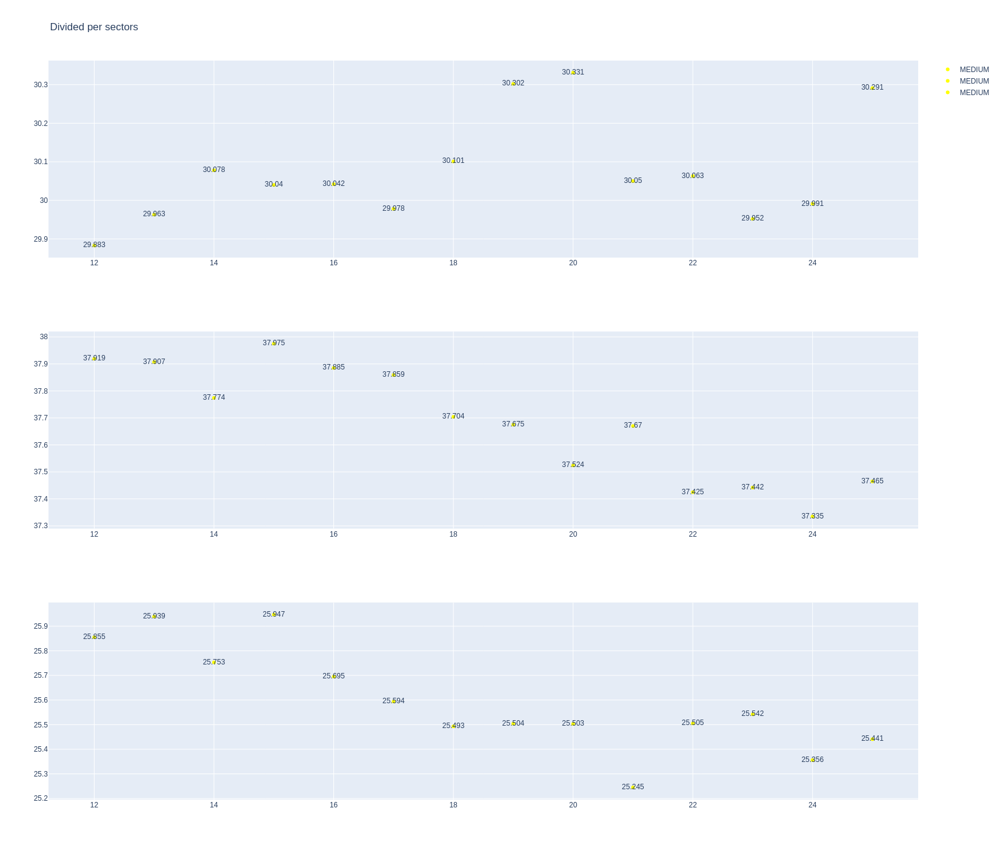

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
259,Isack HADJAR,SOFT,2025-07-04T15:36:41.232000+00:00,11,29.843,37.740,25.473,93.056
270,Isack HADJAR,SOFT,2025-07-04T15:38:14.317000+00:00,12,30.212,37.596,25.618,93.426
280,Isack HADJAR,SOFT,2025-07-04T15:39:47.689000+00:00,13,30.055,37.571,25.412,93.038
290,Isack HADJAR,SOFT,2025-07-04T15:41:20.777000+00:00,14,30.146,37.393,25.616,93.155
302,Isack HADJAR,SOFT,2025-07-04T15:42:53.832000+00:00,15,30.043,37.447,25.508,92.998
315,Isack HADJAR,SOFT,2025-07-04T15:44:26.877000+00:00,16,30.148,37.663,25.622,93.433
326,Isack HADJAR,SOFT,2025-07-04T15:46:00.295000+00:00,17,30.259,37.717,25.497,93.473
341,Isack HADJAR,SOFT,2025-07-04T15:47:33.744000+00:00,18,30.258,37.688,25.577,93.523
378,Isack HADJAR,SOFT,2025-07-04T15:50:45.062000+00:00,20,30.351,37.769,25.613,93.733
397,Isack HADJAR,SOFT,2025-07-04T15:52:18.814000+00:00,21,30.290,37.617,25.771,93.678


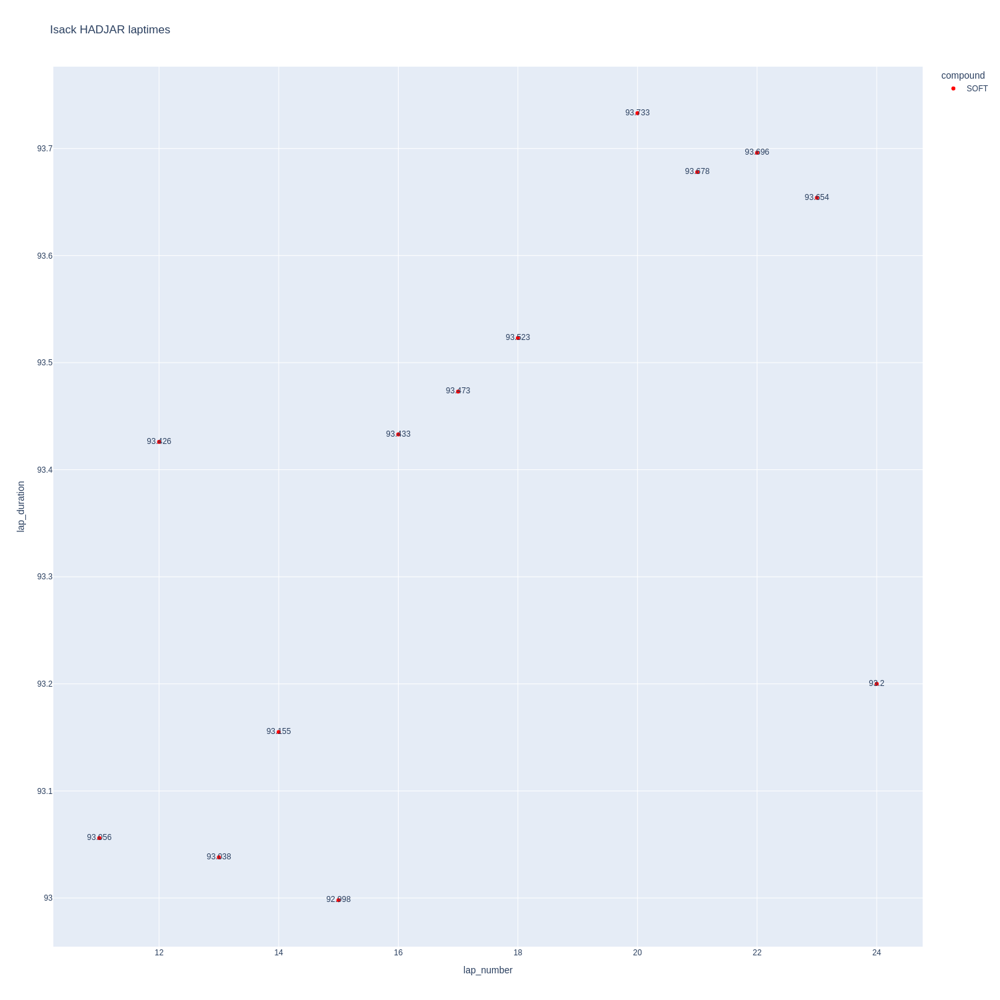

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

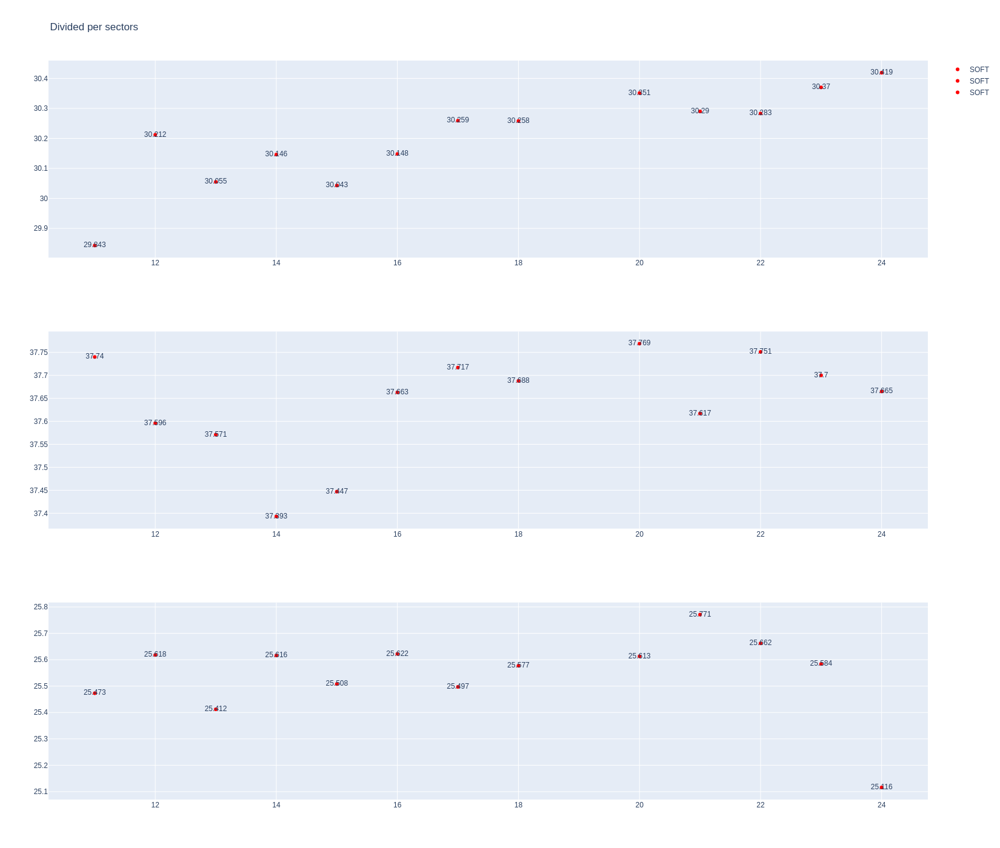

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [ ]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
6,1277,9941,1,31,1,5,HARD,0
8,1277,9941,1,87,1,5,HARD,0
25,1277,9941,2,31,6,8,HARD,5
27,1277,9941,2,87,6,8,HARD,0
43,1277,9941,3,31,9,11,HARD,8
44,1277,9941,3,87,9,11,HARD,8
63,1277,9941,4,31,12,14,SOFT,0
64,1277,9941,4,87,12,14,SOFT,0
73,1277,9941,5,31,15,17,SOFT,3
74,1277,9941,5,87,15,17,SOFT,3


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
377,Esteban OCON,HARD,2025-07-04T15:50:37.895000+00:00,19,29.939,37.940,25.714,93.593
396,Esteban OCON,HARD,2025-07-04T15:52:11.587000+00:00,20,30.005,37.665,25.794,93.464
416,Esteban OCON,HARD,2025-07-04T15:53:45.068000+00:00,21,30.056,37.826,25.835,93.717
436,Esteban OCON,HARD,2025-07-04T15:55:18.770000+00:00,22,30.300,37.579,25.764,93.643
476,Esteban OCON,HARD,2025-07-04T15:58:29.324000+00:00,24,30.150,37.562,25.465,93.177


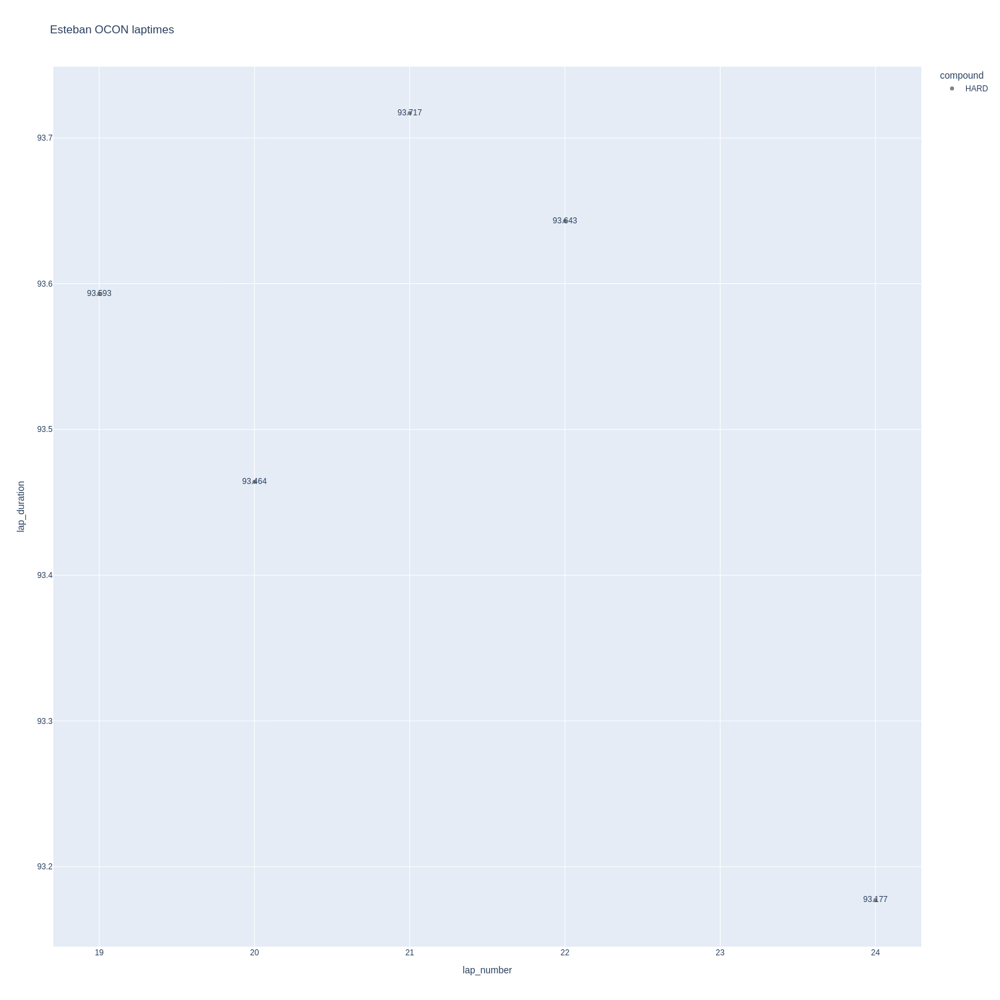

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

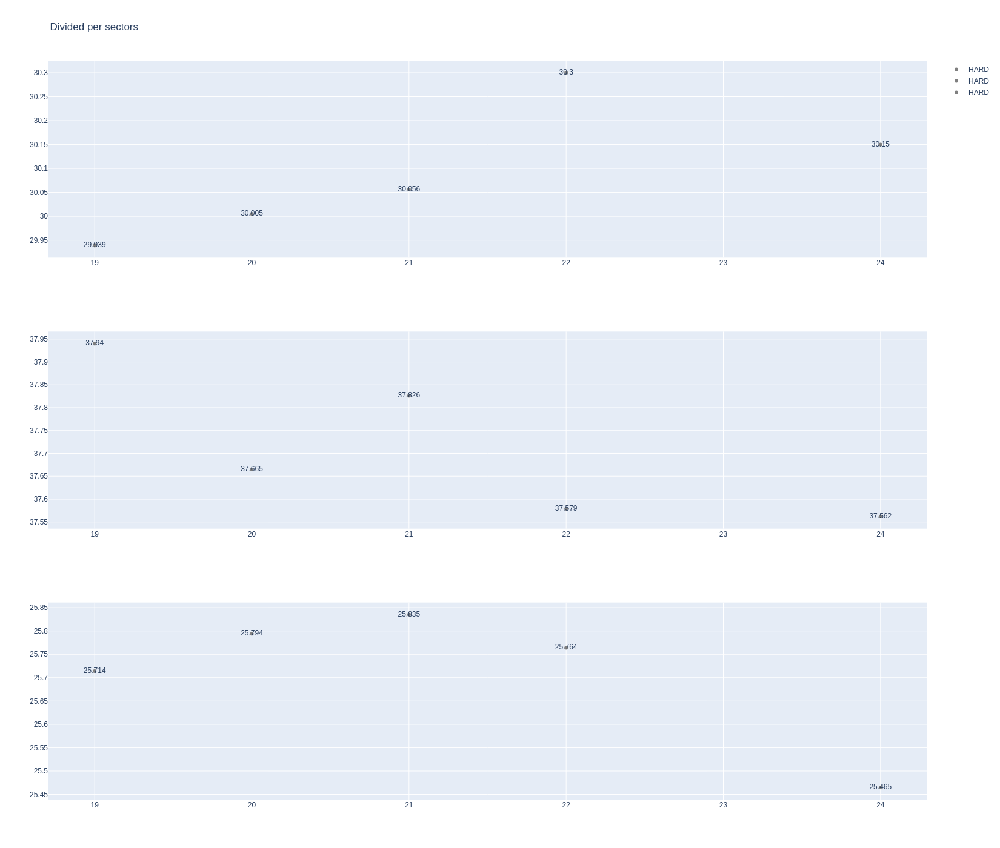

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
362,Oliver BEARMAN,HARD,2025-07-04T15:49:27.446000+00:00,19,30.186,37.456,25.739,93.381
381,Oliver BEARMAN,HARD,2025-07-04T15:51:00.874000+00:00,20,29.961,37.550,25.547,93.058
400,Oliver BEARMAN,HARD,2025-07-04T15:52:34.004000+00:00,21,30.171,37.404,25.753,93.328
420,Oliver BEARMAN,HARD,2025-07-04T15:54:07.193000+00:00,22,30.267,37.415,25.581,93.263
440,Oliver BEARMAN,HARD,2025-07-04T15:55:40.473000+00:00,23,30.216,37.672,25.711,93.599
460,Oliver BEARMAN,HARD,2025-07-04T15:57:14.158000+00:00,24,30.369,37.563,25.623,93.555
477,Oliver BEARMAN,HARD,2025-07-04T15:58:47.679000+00:00,25,30.050,37.360,25.284,92.694


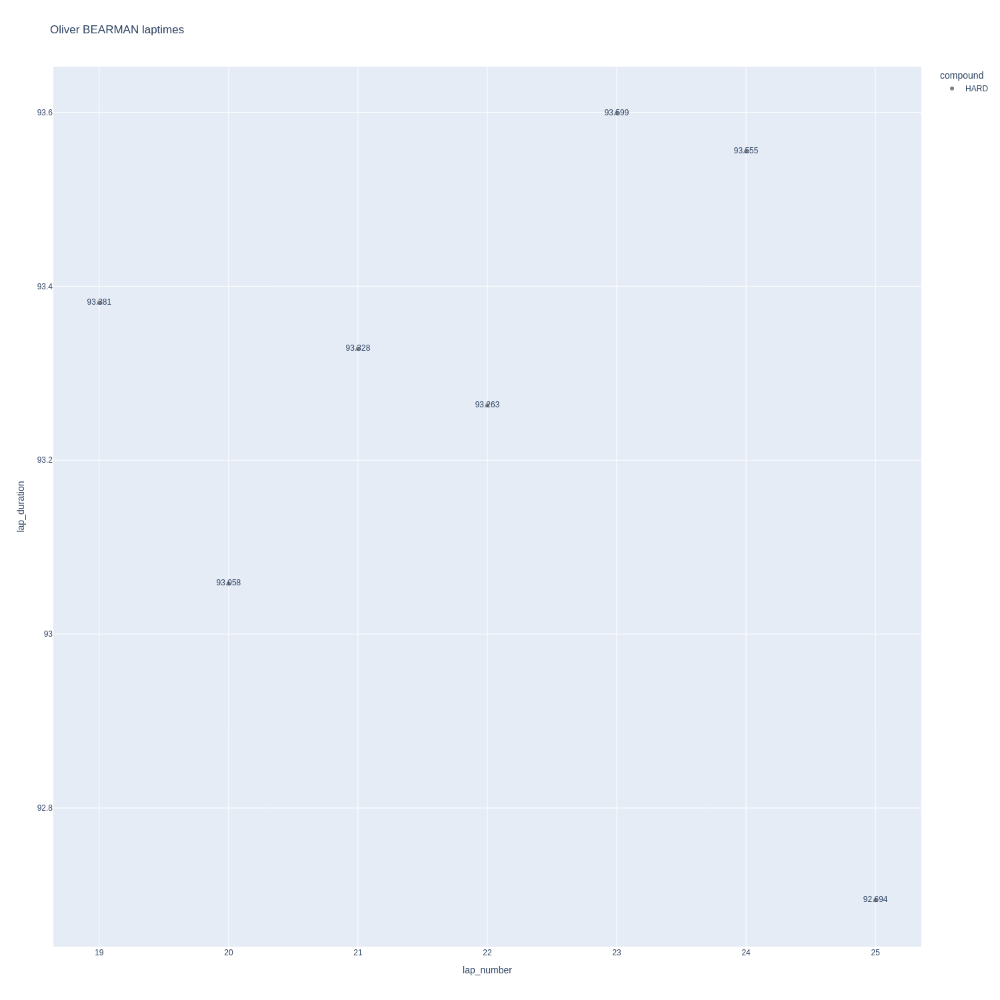

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

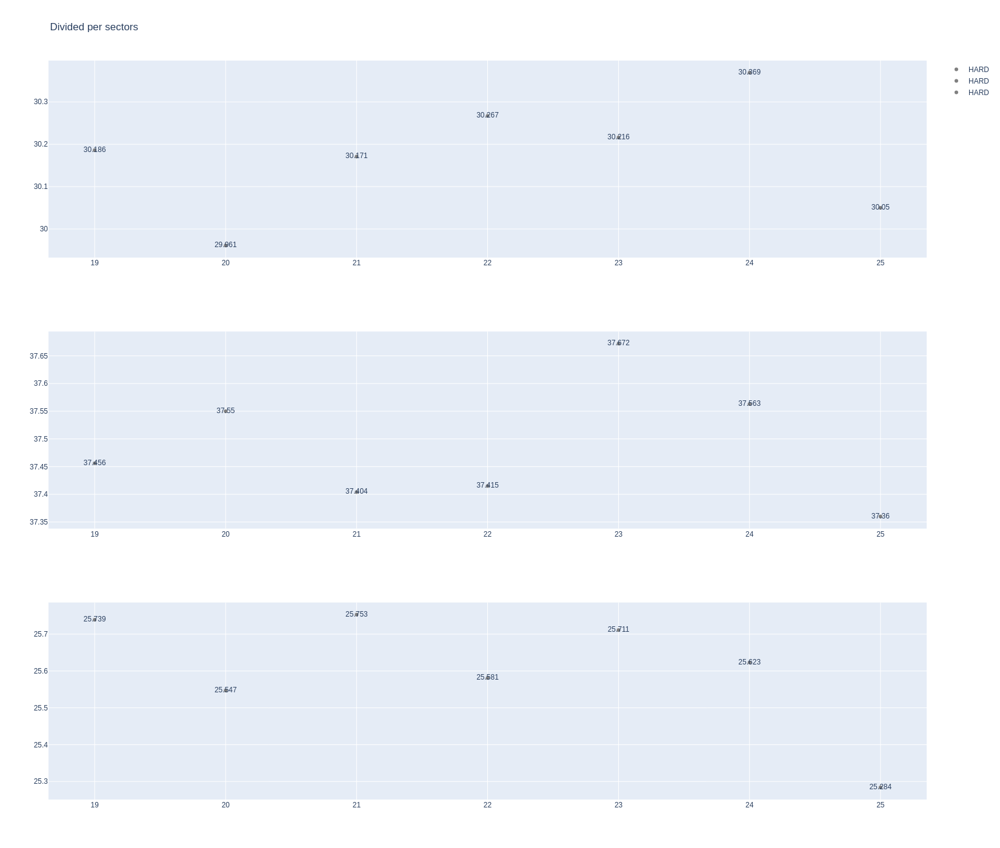

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [ ]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1277,9941,1,43,1,5,MEDIUM,0
11,1277,9941,1,10,1,6,MEDIUM,0
26,1277,9941,2,43,6,8,MEDIUM,0
32,1277,9941,2,10,7,9,MEDIUM,6
45,1277,9941,3,43,9,14,SOFT,0
48,1277,9941,3,10,10,12,MEDIUM,9
65,1277,9941,4,10,13,15,SOFT,0
78,1277,9941,4,43,15,29,MEDIUM,8
79,1277,9941,5,10,16,17,SOFT,3
87,1277,9941,6,10,18,24,MEDIUM,7


In [ ]:
data =libraryDataF1.getinfolongruns(jointables2,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
297,Franco COLAPINTO,MEDIUM,2025-07-04T15:42:05.717000+00:00,16,29.699,37.732,25.810,93.241
308,Franco COLAPINTO,MEDIUM,2025-07-04T15:43:38.974000+00:00,17,30.000,37.470,25.571,93.041
320,Franco COLAPINTO,MEDIUM,2025-07-04T15:45:12+00:00,18,30.156,37.206,25.564,92.926
334,Franco COLAPINTO,MEDIUM,2025-07-04T15:46:44.875000+00:00,19,30.187,37.604,25.744,93.535
350,Franco COLAPINTO,MEDIUM,2025-07-04T15:48:18.357000+00:00,20,30.314,37.730,25.812,93.856
367,Franco COLAPINTO,MEDIUM,2025-07-04T15:49:52.234000+00:00,21,30.184,37.781,25.739,93.704
448,Franco COLAPINTO,MEDIUM,2025-07-04T15:56:20.977000+00:00,25,30.468,37.616,25.509,93.593
488,Franco COLAPINTO,MEDIUM,2025-07-04T15:59:28.762000+00:00,27,30.338,37.624,25.583,93.545


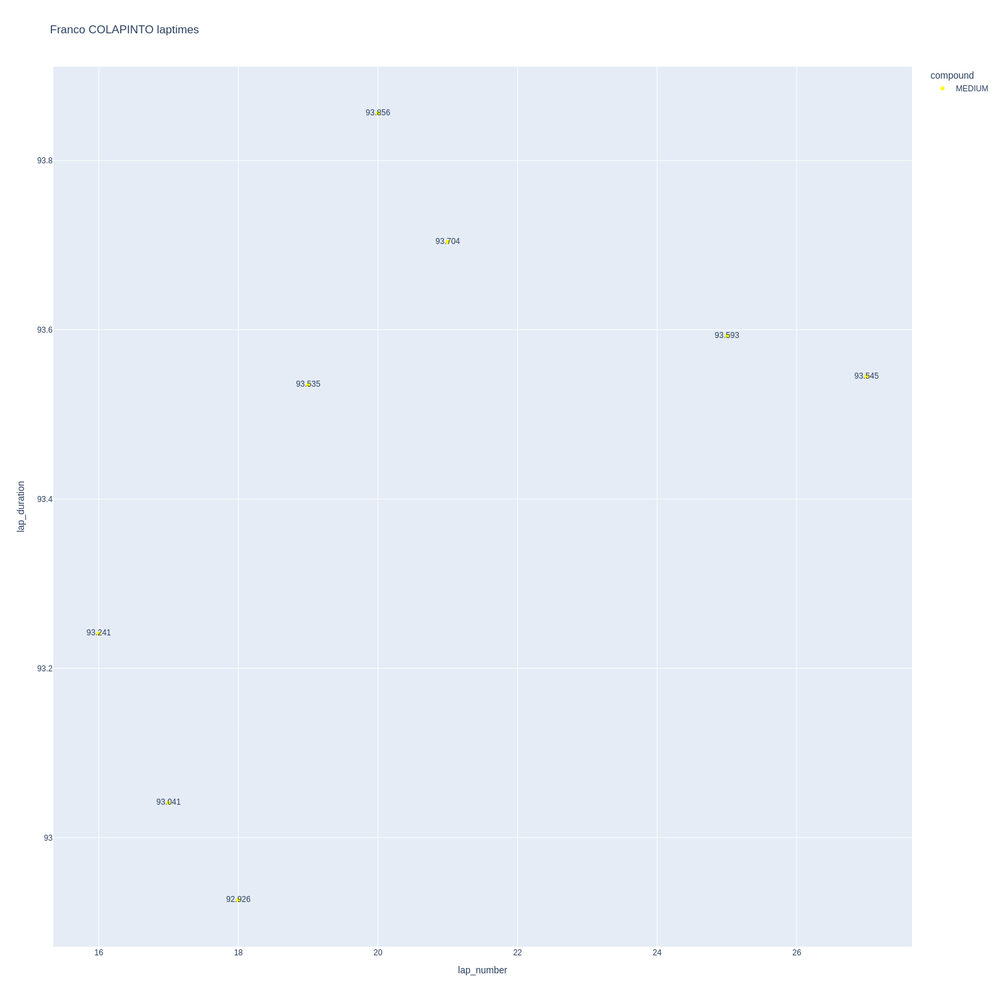

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

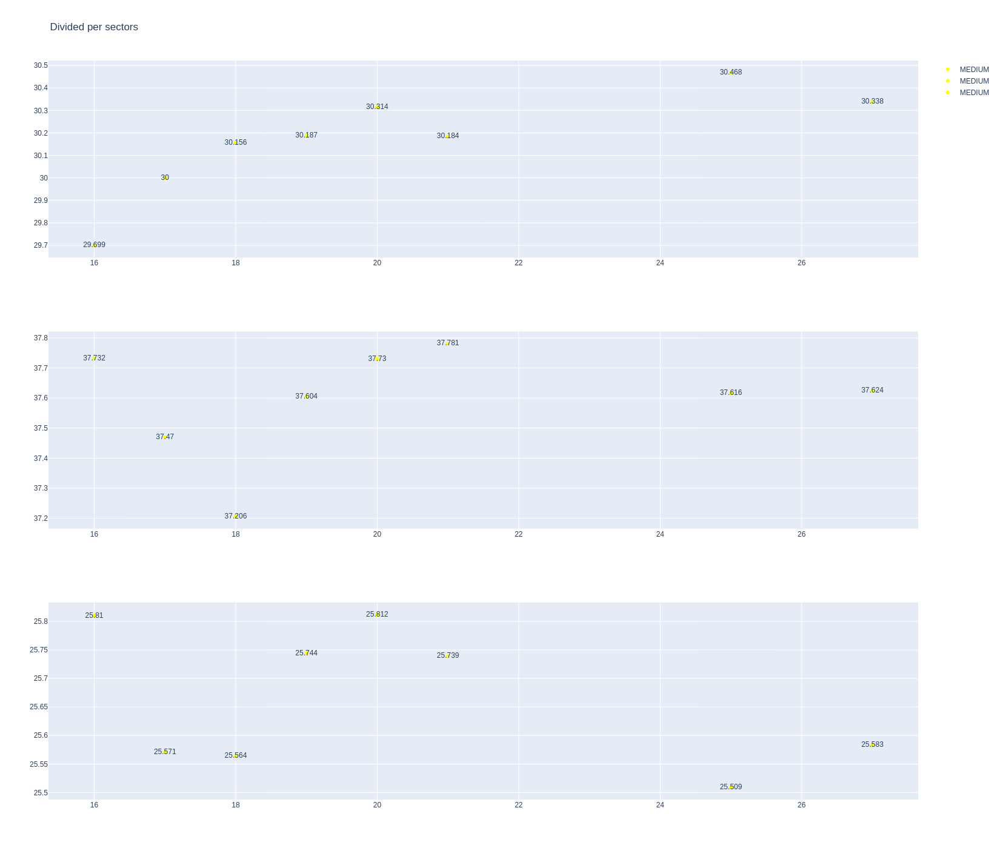

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
153,Pierre GASLY,MEDIUM,2025-07-04T15:17:39.625000+00:00,9,28.977,35.990,27.965,92.932
444,Pierre GASLY,MEDIUM,2025-07-04T15:56:02.922000+00:00,20,30.057,37.808,25.740,93.605
464,Pierre GASLY,MEDIUM,2025-07-04T15:57:36.515000+00:00,21,30.186,37.749,25.691,93.626
483,Pierre GASLY,MEDIUM,2025-07-04T15:59:10.082000+00:00,22,30.147,37.689,25.598,93.434


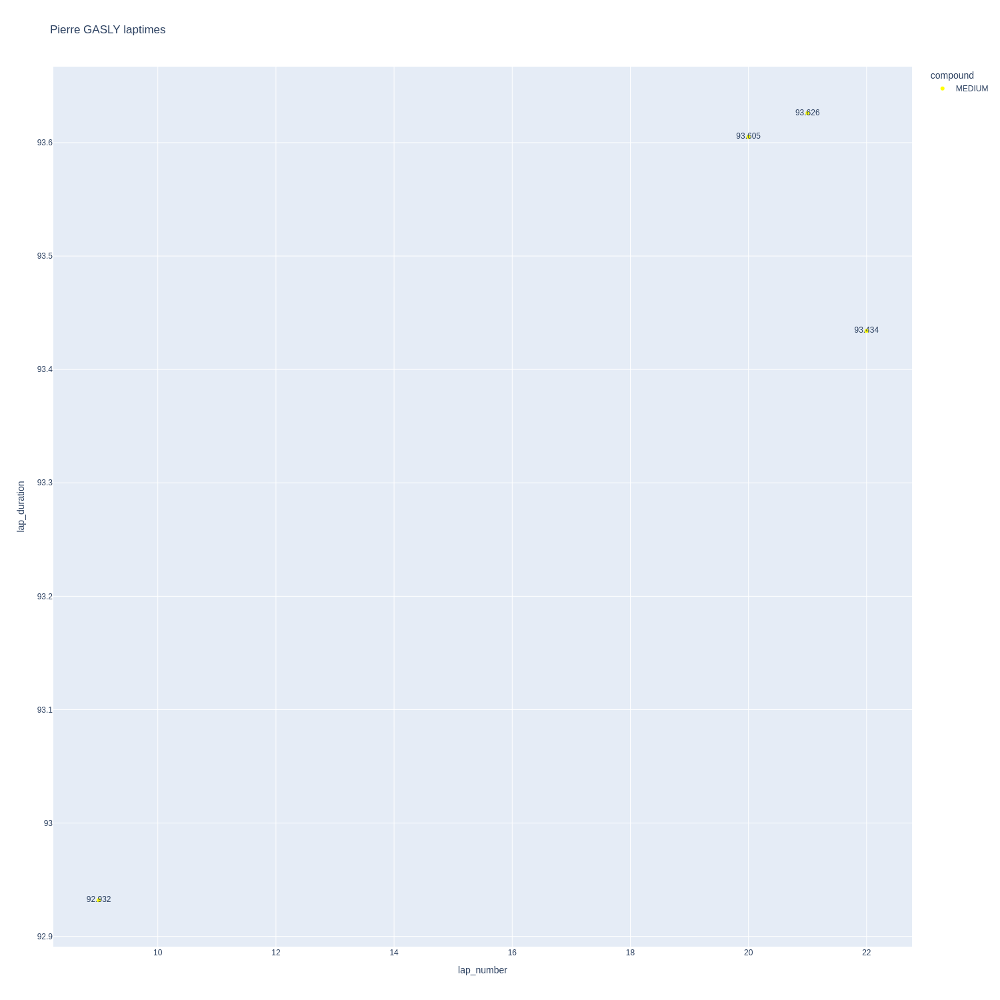

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

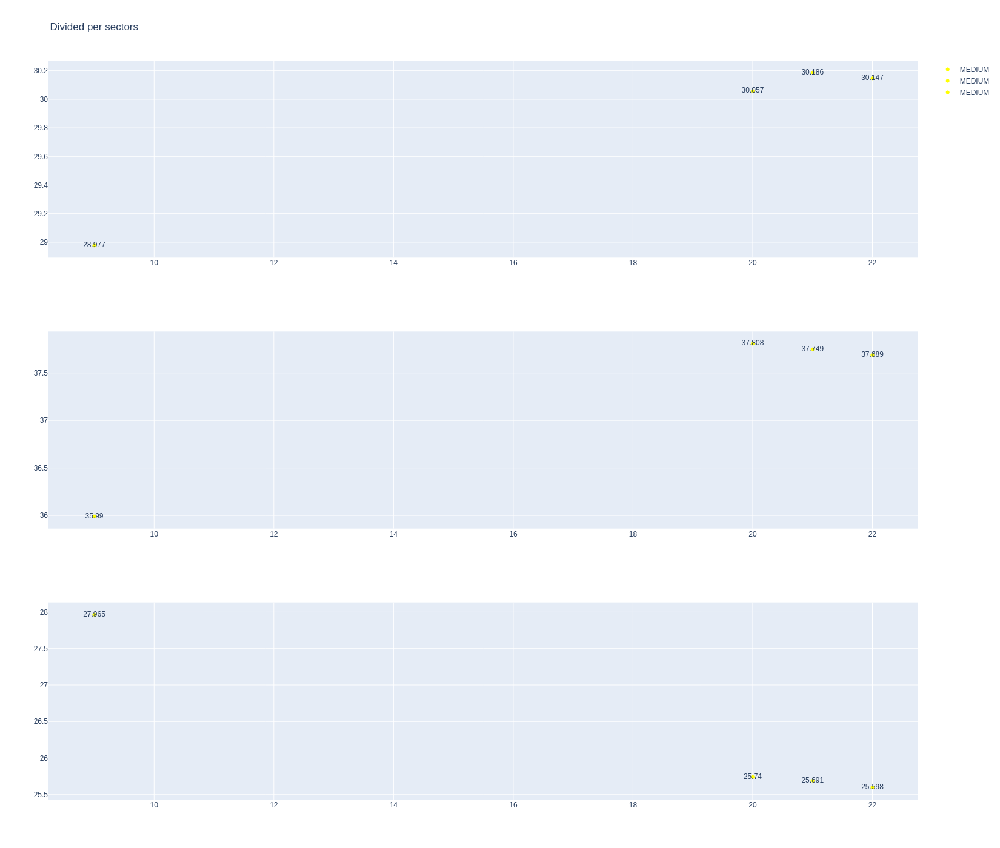

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [ ]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
14,1277,9941,1,55,1,6,MEDIUM,0
18,1277,9941,1,23,1,9,MEDIUM,0
29,1277,9941,2,55,7,8,MEDIUM,0
46,1277,9941,3,55,9,14,SOFT,0
47,1277,9941,2,23,10,12,SOFT,0
69,1277,9941,3,23,13,26,MEDIUM,9
77,1277,9941,4,55,15,27,SOFT,0
96,1277,9941,4,23,27,30,SOFT,3


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
263,Alexander ALBON,MEDIUM,2025-07-04T15:37:43.270000+00:00,14,29.529,37.619,25.399,92.547
276,Alexander ALBON,MEDIUM,2025-07-04T15:39:15.915000+00:00,15,29.691,37.791,25.530,93.012
287,Alexander ALBON,MEDIUM,2025-07-04T15:40:48.872000+00:00,16,29.740,37.639,25.558,92.937
299,Alexander ALBON,MEDIUM,2025-07-04T15:42:21.773000+00:00,17,30.070,38.036,25.557,93.663
310,Alexander ALBON,MEDIUM,2025-07-04T15:43:55.343000+00:00,18,29.977,37.832,25.546,93.355
322,Alexander ALBON,MEDIUM,2025-07-04T15:45:28.778000+00:00,19,30.124,37.621,25.420,93.165
337,Alexander ALBON,MEDIUM,2025-07-04T15:47:01.947000+00:00,20,30.081,37.630,25.511,93.222
353,Alexander ALBON,MEDIUM,2025-07-04T15:48:35.175000+00:00,21,30.133,37.640,25.688,93.461
371,Alexander ALBON,MEDIUM,2025-07-04T15:50:08.672000+00:00,22,30.071,37.576,25.535,93.182
390,Alexander ALBON,MEDIUM,2025-07-04T15:51:41.840000+00:00,23,29.963,37.604,25.846,93.413


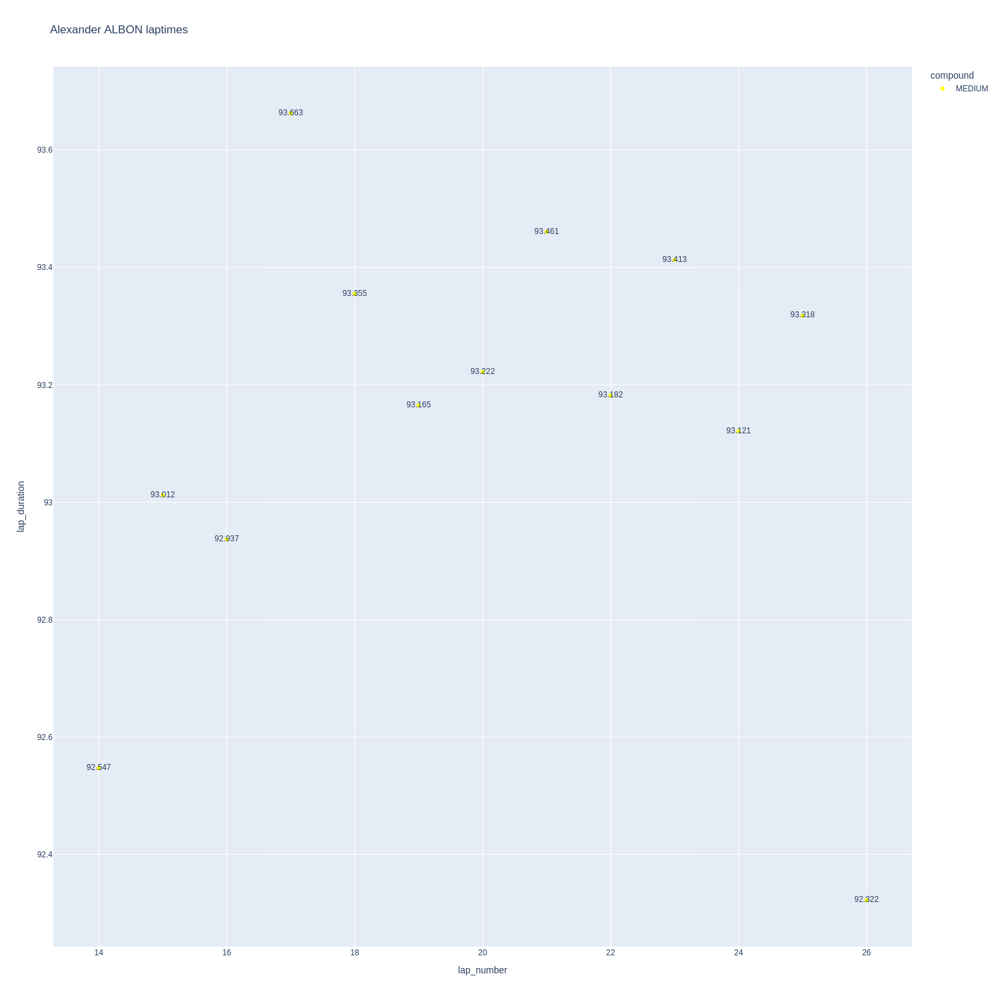

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

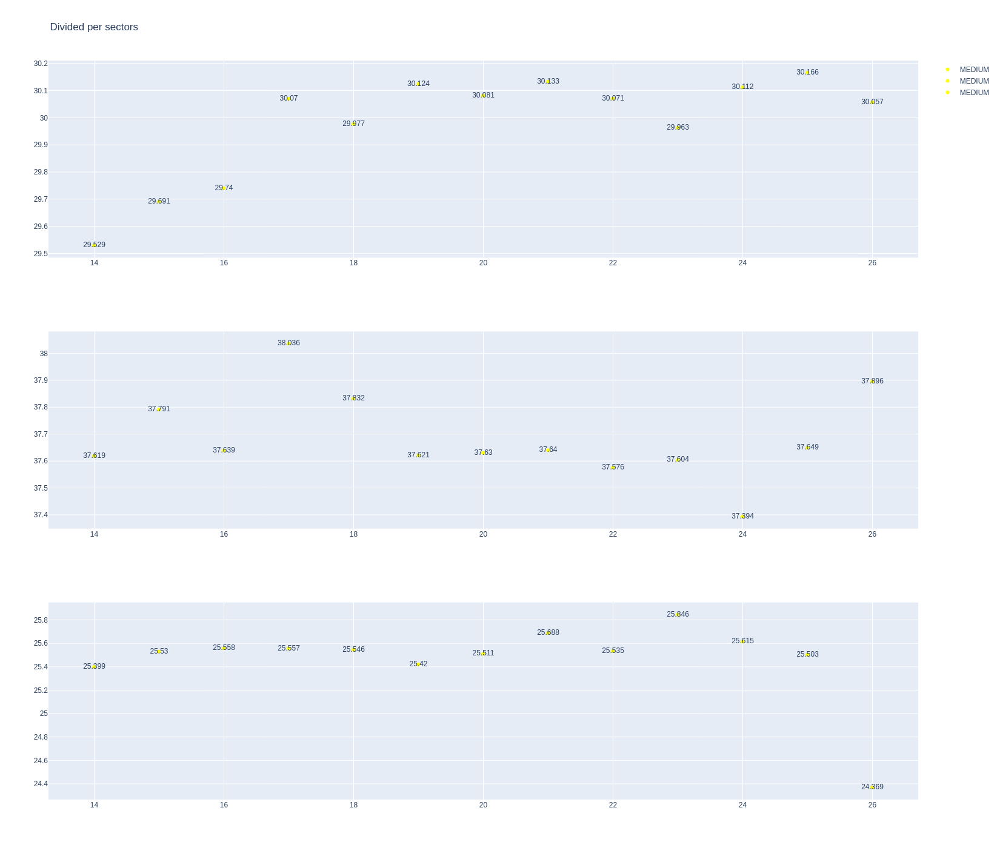

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data= libraryDataF1.getinfolongruns(jointables2,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
325,Carlos SAINZ,SOFT,2025-07-04T15:45:54.460000+00:00,16,29.461,37.495,25.481,92.437
340,Carlos SAINZ,SOFT,2025-07-04T15:47:26.883000+00:00,17,29.748,37.829,25.760,93.337
357,Carlos SAINZ,SOFT,2025-07-04T15:49:00.142000+00:00,18,29.907,37.831,25.588,93.326
376,Carlos SAINZ,SOFT,2025-07-04T15:50:33.634000+00:00,19,30.052,37.982,25.603,93.637
395,Carlos SAINZ,SOFT,2025-07-04T15:52:07.175000+00:00,20,30.027,37.980,25.724,93.731
435,Carlos SAINZ,SOFT,2025-07-04T15:55:15.020000+00:00,22,30.168,37.747,25.423,93.338
454,Carlos SAINZ,SOFT,2025-07-04T15:56:48.341000+00:00,23,30.079,37.664,25.636,93.379
474,Carlos SAINZ,SOFT,2025-07-04T15:58:21.701000+00:00,24,29.946,37.623,25.379,92.948
494,Carlos SAINZ,SOFT,2025-07-04T15:59:54.692000+00:00,25,29.909,37.630,25.362,92.901


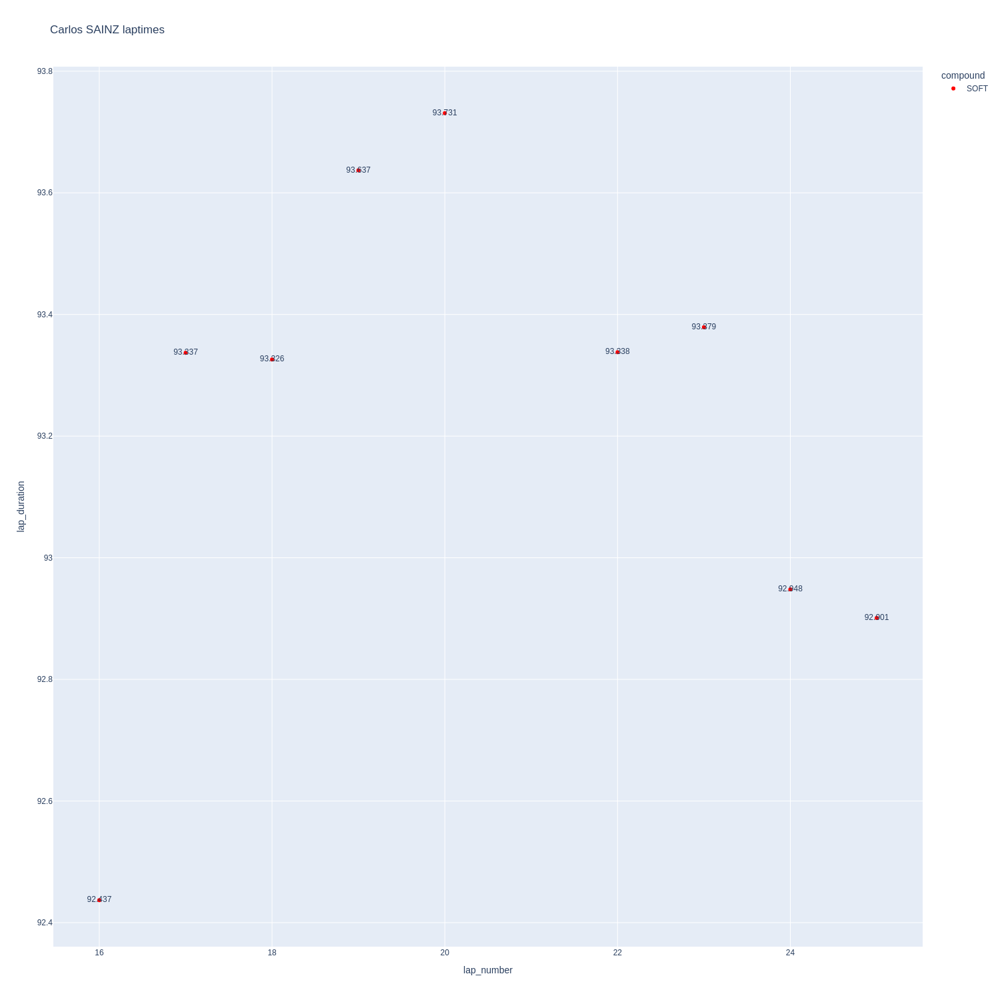

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

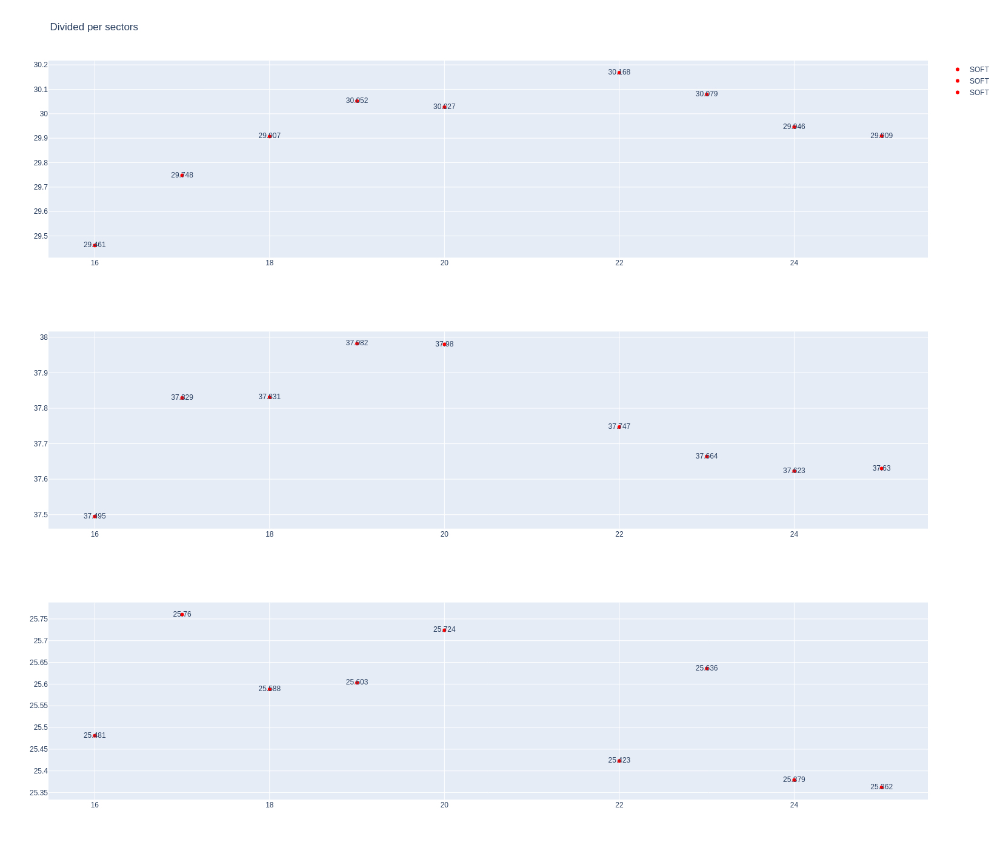

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [ ]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1277,9941,1,5,1,5,MEDIUM,0
19,1277,9941,1,27,1,9,MEDIUM,0
28,1277,9941,2,5,6,10,MEDIUM,5
53,1277,9941,2,27,10,15,SOFT,0
57,1277,9941,3,5,11,13,SOFT,0
72,1277,9941,4,5,14,22,MEDIUM,10
82,1277,9941,3,27,16,26,MEDIUM,9
90,1277,9941,5,5,23,27,SOFT,3
95,1277,9941,4,27,27,29,SOFT,6


In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
304,Nico HULKENBERG,MEDIUM,2025-07-04T15:43:08.384000+00:00,17,29.706,37.409,25.577,92.692
316,Nico HULKENBERG,MEDIUM,2025-07-04T15:44:40.900000+00:00,18,29.856,37.642,25.691,93.189
328,Nico HULKENBERG,MEDIUM,2025-07-04T15:46:14.123000+00:00,19,29.830,37.554,25.467,92.851
342,Nico HULKENBERG,MEDIUM,2025-07-04T15:47:47.020000+00:00,20,30.141,37.420,25.684,93.245
360,Nico HULKENBERG,MEDIUM,2025-07-04T15:49:20.306000+00:00,21,30.209,37.818,25.780,93.807
379,Nico HULKENBERG,MEDIUM,2025-07-04T15:50:54.020000+00:00,22,30.222,37.739,25.544,93.505
398,Nico HULKENBERG,MEDIUM,2025-07-04T15:52:27.528000+00:00,23,30.103,37.657,25.686,93.446
418,Nico HULKENBERG,MEDIUM,2025-07-04T15:54:01.068000+00:00,24,29.965,37.353,25.490,92.808
438,Nico HULKENBERG,MEDIUM,2025-07-04T15:55:33.848000+00:00,25,30.155,37.531,25.410,93.096
458,Nico HULKENBERG,MEDIUM,2025-07-04T15:57:06.937000+00:00,26,30.274,37.506,25.202,92.982


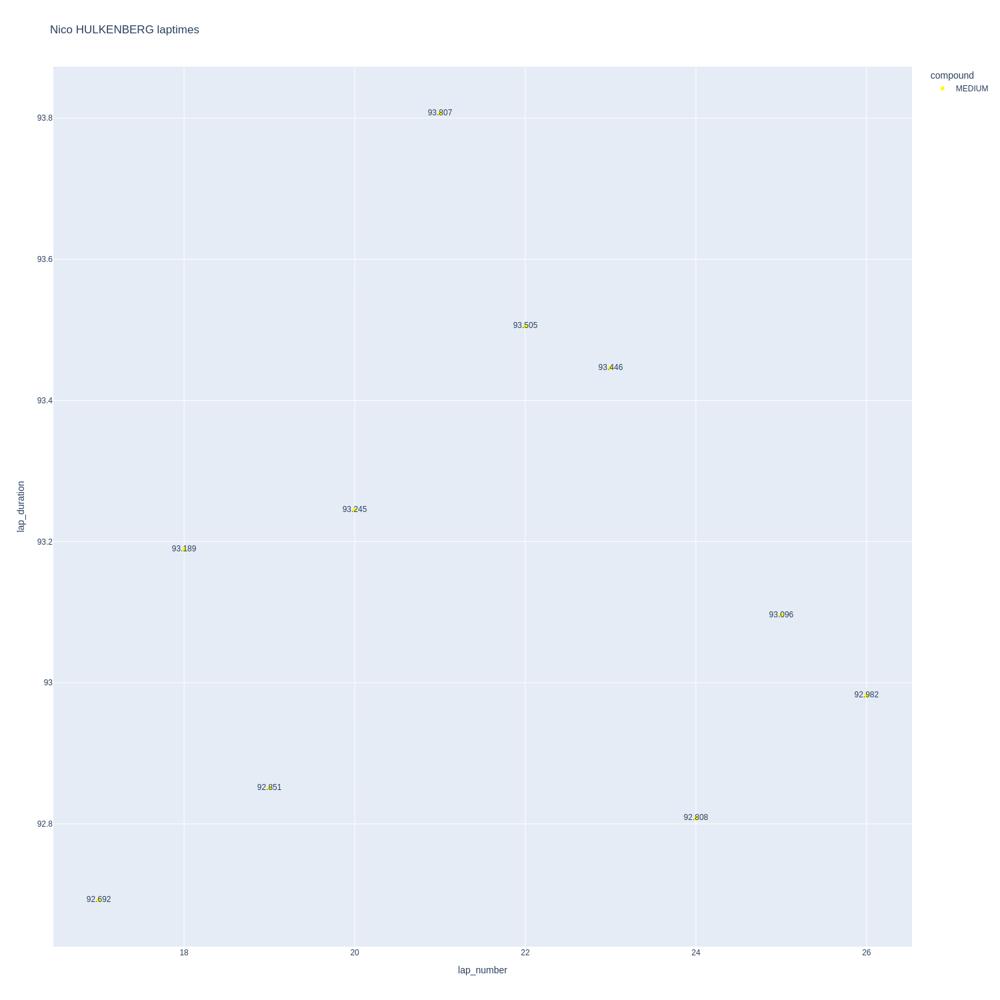

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

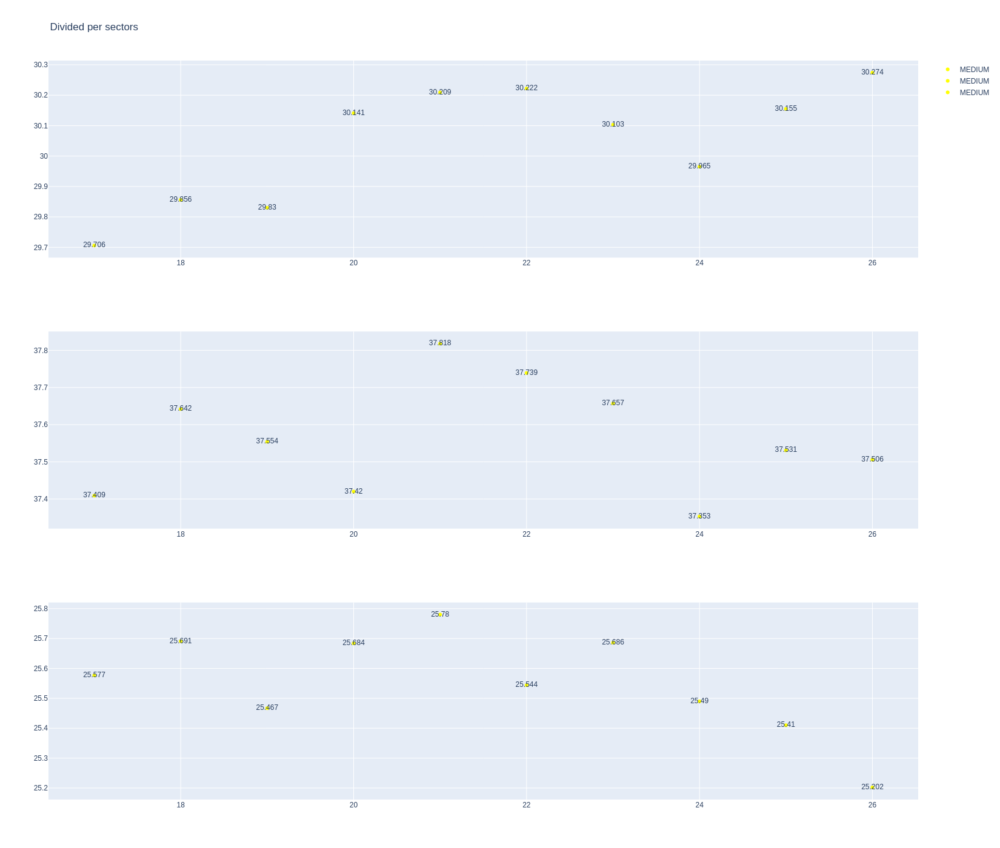

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [ ]:
data = libraryDataF1.getinfolongruns(jointables2,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
312,Gabriel BORTOLETO,MEDIUM,2025-07-04T15:44:00.089000+00:00,15,29.592,37.555,25.475,92.622
323,Gabriel BORTOLETO,MEDIUM,2025-07-04T15:45:32.719000+00:00,16,30.113,37.708,25.780,93.601
338,Gabriel BORTOLETO,MEDIUM,2025-07-04T15:47:06.257000+00:00,17,30.070,37.754,25.857,93.681
391,Gabriel BORTOLETO,MEDIUM,2025-07-04T15:51:48.204000+00:00,20,30.187,37.858,25.920,93.965
411,Gabriel BORTOLETO,MEDIUM,2025-07-04T15:53:22.153000+00:00,21,30.098,37.885,25.960,93.943
475,Gabriel BORTOLETO,SOFT,2025-07-04T15:58:24.415000+00:00,24,29.913,37.394,25.542,92.849
495,Gabriel BORTOLETO,SOFT,2025-07-04T15:59:57.348000+00:00,25,29.908,37.459,25.618,92.985


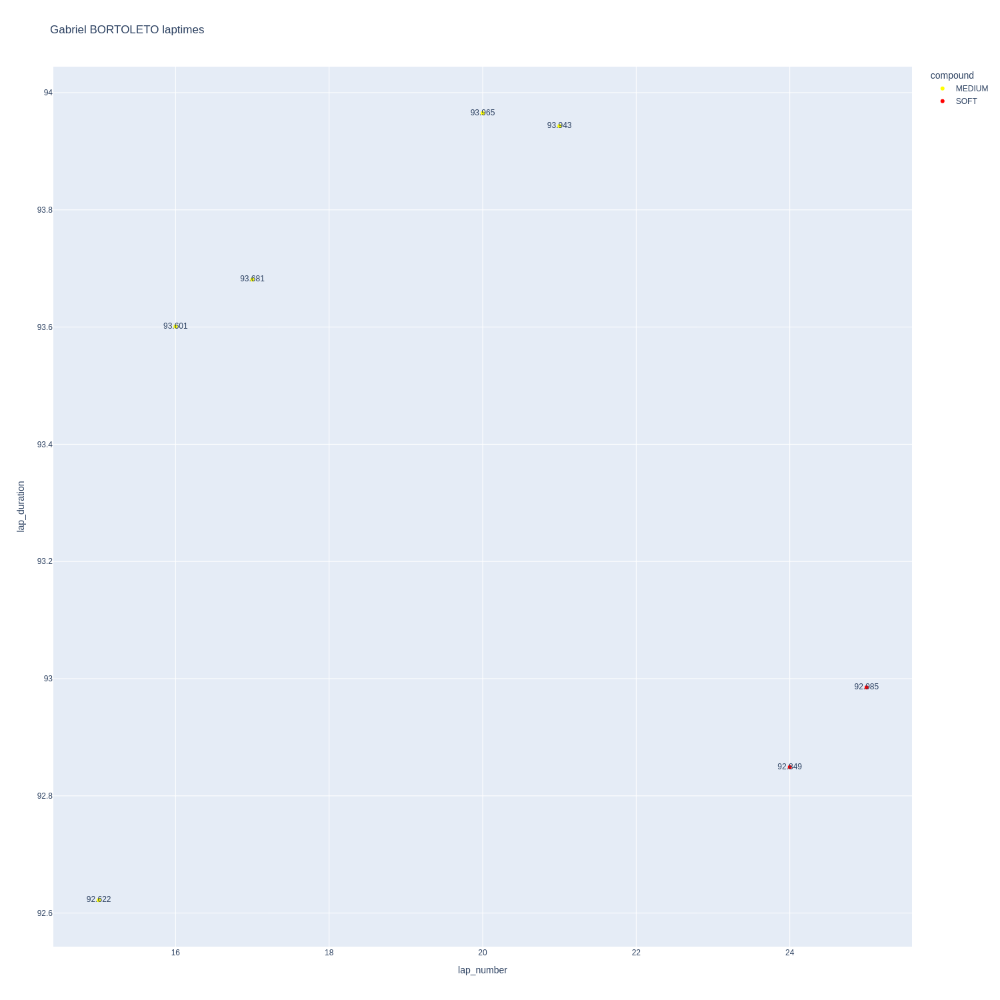

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

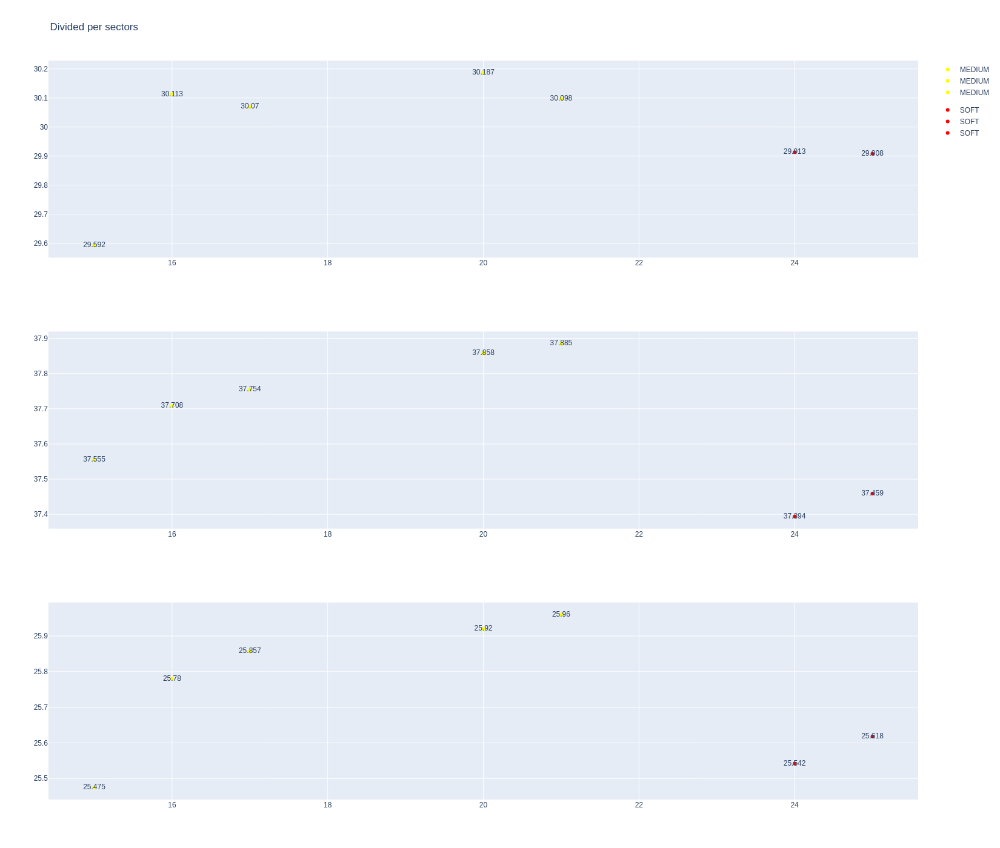

In [ ]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Long runs mean for each driver

In [ ]:
longrun_data = libraryDataF1.obtainLongRunData(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Sorted by lap duration

In [ ]:
sorted_laps = pd.DataFrame(longrun_data,columns=['driver','compound','lap_duration','sector1','sector2','sector3'])

In [ ]:
sorted_laps.sort_values(by='lap_duration',ascending=True)

,driver,compound,lap_duration,sector1,sector2,sector3
0,Max VERSTAPPEN,MEDIUM,92.268500,29.953500,37.047750,25.267250
18,Oscar PIASTRI,MEDIUM,92.312286,29.875571,37.161857,25.274857
1,Lando NORRIS,MEDIUM,92.312600,29.980000,37.113400,25.219200
7,Charles LECLERC,MEDIUM,92.405125,30.146625,36.994500,25.264000
5,Kimi ANTONELLI,MEDIUM,92.762231,30.061538,37.297231,25.403462
17,George RUSSELL,MEDIUM,92.821417,30.189833,37.280583,25.351000
15,Lewis HAMILTON,MEDIUM,92.997200,30.122800,37.432800,25.441600
8,Lance STROLL,MEDIUM,93.107500,30.032000,37.614667,25.460833
10,Alexander ALBON,MEDIUM,93.132154,29.978000,37.686692,25.467462
11,Nico HULKENBERG,MEDIUM,93.162100,30.046100,37.562900,25.553100


##### Sorted by sector 1

In [ ]:
sorted_laps.sort_values(by='sector1',ascending=True)[['driver','compound','sector1']]

,driver,compound,sector1
4,Pierre GASLY,MEDIUM,29.841750
18,Oscar PIASTRI,MEDIUM,29.875571
16,Carlos SAINZ,SOFT,29.921889
0,Max VERSTAPPEN,MEDIUM,29.953500
10,Alexander ALBON,MEDIUM,29.978000
1,Lando NORRIS,MEDIUM,29.980000
2,Gabriel BORTOLETO,MEDIUM,29.983000
6,Fernando ALONSO,MEDIUM,29.983714
8,Lance STROLL,MEDIUM,30.032000
11,Nico HULKENBERG,MEDIUM,30.046100


##### Sorted by sector 2

In [ ]:
sorted_laps.sort_values(by='sector2',ascending=True)[['driver','compound','sector2']]

,driver,compound,sector2
7,Charles LECLERC,MEDIUM,36.994500
0,Max VERSTAPPEN,MEDIUM,37.047750
1,Lando NORRIS,MEDIUM,37.113400
18,Oscar PIASTRI,MEDIUM,37.161857
17,George RUSSELL,MEDIUM,37.280583
5,Kimi ANTONELLI,MEDIUM,37.297231
4,Pierre GASLY,MEDIUM,37.309000
15,Lewis HAMILTON,MEDIUM,37.432800
19,Oliver BEARMAN,HARD,37.488571
6,Fernando ALONSO,MEDIUM,37.520286


##### Sorted by sector 3

In [ ]:
sorted_laps.sort_values(by='sector3',ascending=True)[['driver','compound','sector3']]

,driver,compound,sector3
1,Lando NORRIS,MEDIUM,25.219200
7,Charles LECLERC,MEDIUM,25.264000
0,Max VERSTAPPEN,MEDIUM,25.267250
18,Oscar PIASTRI,MEDIUM,25.274857
17,George RUSSELL,MEDIUM,25.351000
5,Kimi ANTONELLI,MEDIUM,25.403462
15,Lewis HAMILTON,MEDIUM,25.441600
8,Lance STROLL,MEDIUM,25.460833
10,Alexander ALBON,MEDIUM,25.467462
9,Yuki TSUNODA,MEDIUM,25.535500


#### Long runs mean

In [ ]:
longruns_summary = libraryDataF1.obtainMeanLongRuns(drivers,jointables2,MINIMUN_SECONDS,MAXIMUM_SECONDS)

##### Mean pace per compound

In [ ]:
libraryDataF1.showDataLongRuns(longruns_summary,"MEDIUM","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
0,M VERSTAPPEN,92.268
18,O PIASTRI,92.312
1,L NORRIS,92.313
7,C LECLERC,92.405
5,K ANTONELLI,92.762
17,G RUSSELL,92.821
8,L STROLL,93.108
10,A ALBON,93.132
11,N HULKENBERG,93.162
6,F ALONSO,93.232


In [ ]:
libraryDataF1.showDataLongRuns(longruns_summary,"SOFT","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
16,C SAINZ,93.226
3,I HADJAR,93.389


In [ ]:
libraryDataF1.showDataLongRuns(longruns_summary,"HARD","mean_lap_time",['driver','mean_lap_time'])

,driver,mean_lap_time
19,O BEARMAN,93.268
13,E OCON,93.519


## Free Practice 3
### Obtain setup

In [217]:
practice = libraryDataF1.obtain_information('laps',session_key=9942)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9942)
drivers = libraryDataF1.obtain_information('drivers',session_key=9942)

In [218]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)
jointables2 = pd.merge(practice,stintsDataFrame,on=['lap_number','driver_number'])
libraryDataF1.obtain_drivers_colours(drivers)

In [259]:
session = ff1.get_session(2025, 12, 'FP3')
session.load();

core           INFO 	Loading data for British Grand Prix - Practice 3 [v3.3.0]
req            INFO 	Using cached data for session_info
req            INFO 	Using cached data for driver_info
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	Using cached data for session_status_data
req            INFO 	Using cached data for track_status_data
req            INFO 	Using cached data for _extended_timing_data
req            INFO 	Using cached data for timing_app_data
core           INFO 	Processing timing data...
req            INFO 	Updating cache for car_data...
_api           INFO 	Fetching car data...
_api           INFO 	Parsing car data...
req            INFO 	Cache updated!
req            INFO 	No cached data found for position_data. Loading data...
_api           INFO 	Fetching position data...
_api           INFO 	Parsing position data...


### Speed trap

The history saving thread hit an unexpected error (OperationalError('database or disk is full')).History will not be written to the database.


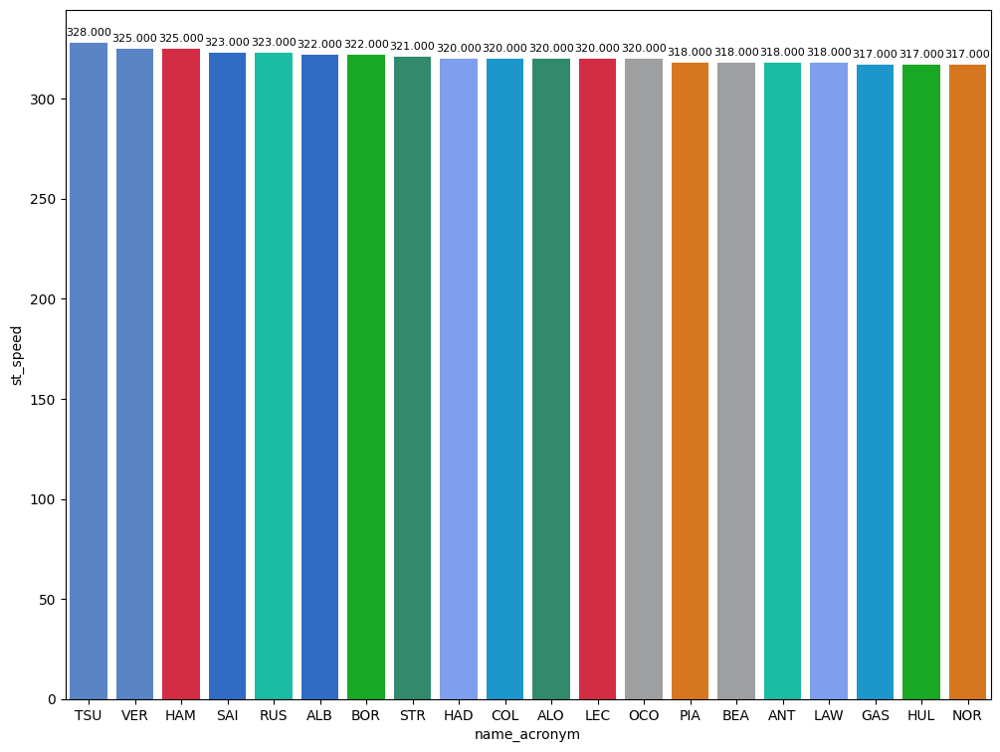

In [220]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

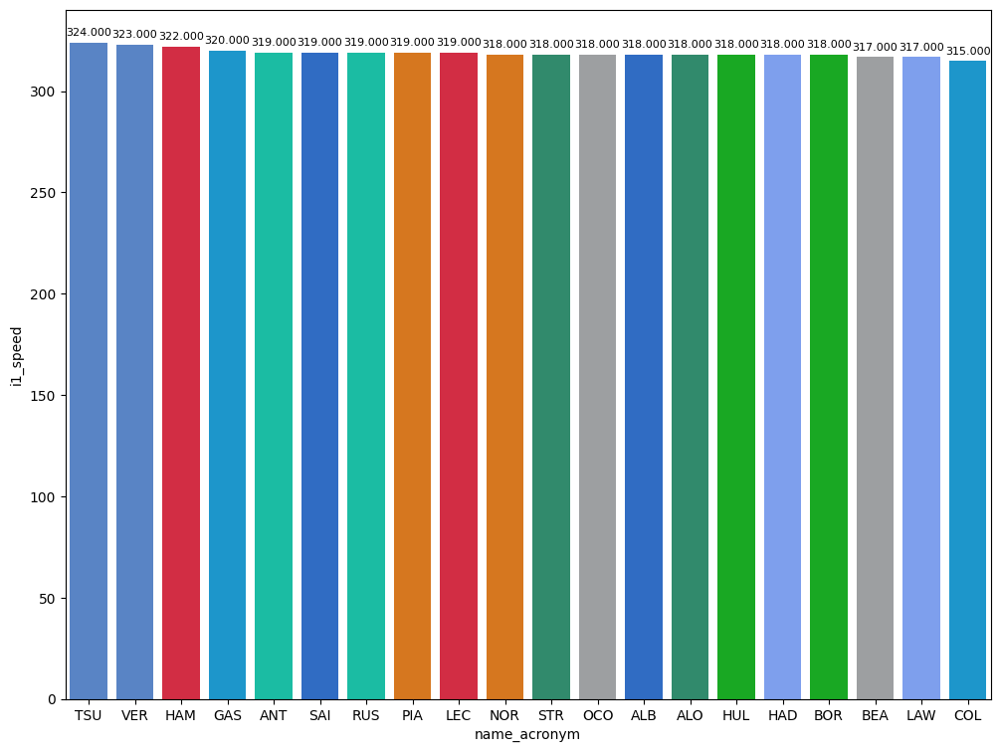

In [221]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

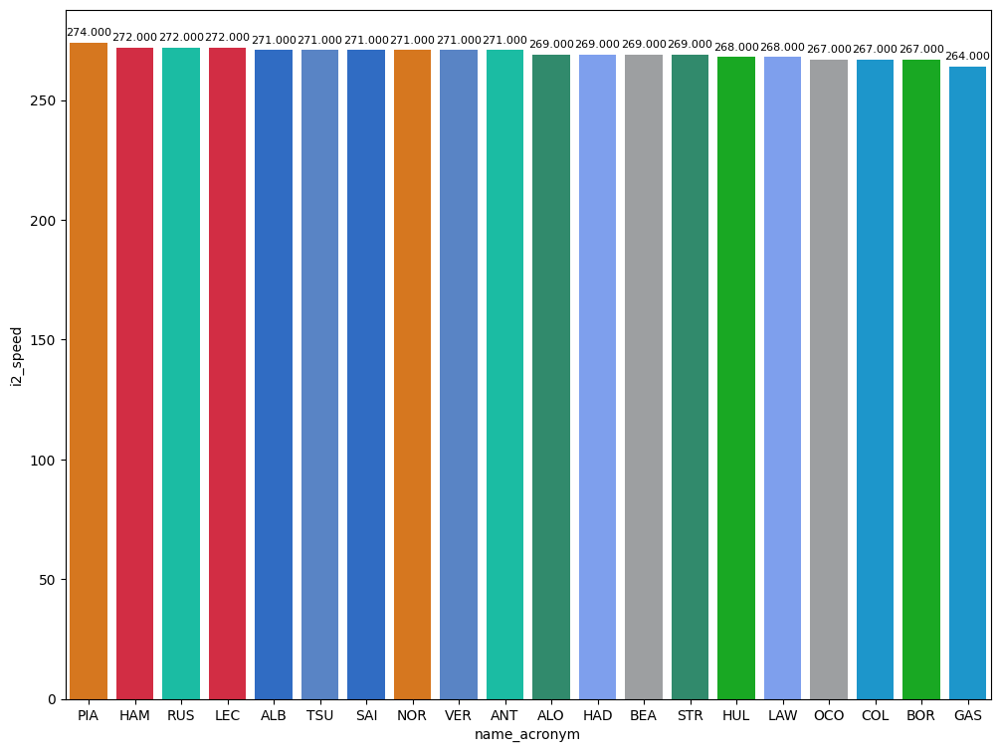

In [222]:
top_speed = jointables2.loc[jointables2.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Fastest lap per compound
In this section, I will show the best lap with the different compounds of the session. 

In [223]:
compoundsPace = jointables2.loc[jointables2.groupby(['compound'])['lap_duration'].idxmin()]
compoundsPace[['full_name','compound','duration_sector_1','duration_sector_2','duration_sector_3','lap_duration']]

,full_name,compound,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
73,Isack HADJAR,HARD,28.402,35.228,23.885,87.515
131,Oliver BEARMAN,MEDIUM,27.979,34.924,23.698,86.601
236,Charles LECLERC,SOFT,27.680,34.337,23.481,85.498


### Deltas
In this section we can see the deltas of the fastest lap of each driver compared with the fastest lap of the session

In [224]:
practiceCleaned = jointables2.query("lap_duration >1")
drivers_list = list(practiceCleaned['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_fastest_lap(driver,practiceCleaned,newdataset)

arr= libraryDataF1.obtain_deltas(newdataset)
newdataset.insert(3,'delta',arr)


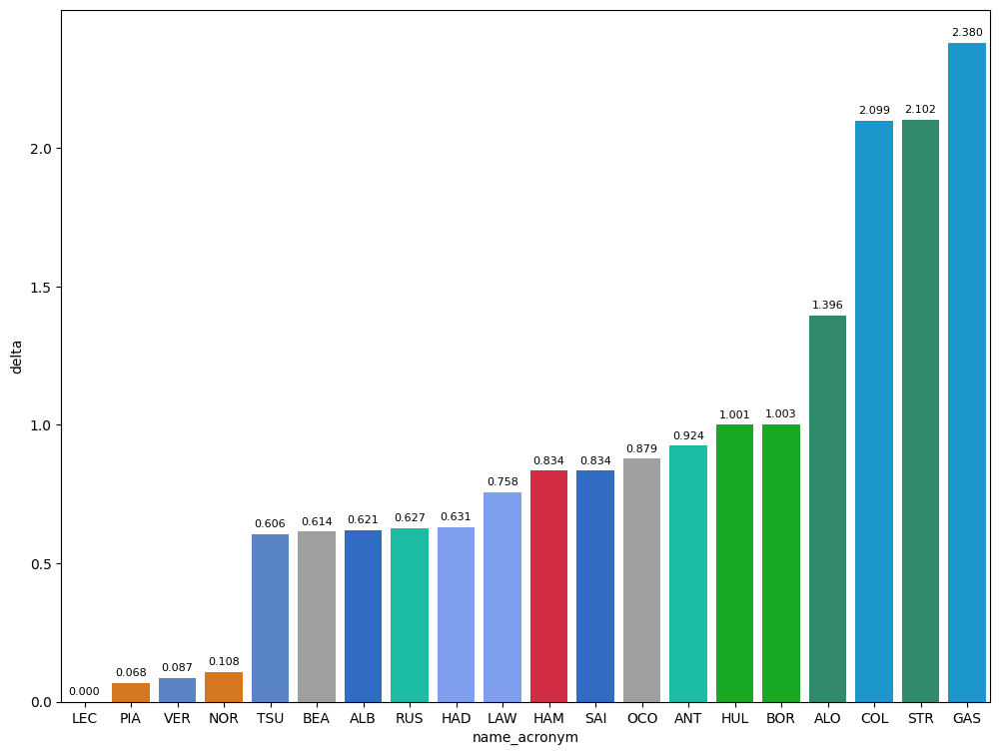

In [225]:
dt = newdataset.sort_values(ascending=True,by='delta')
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Track dominance
In this section, best sector are taken of each sector to see the car's performance in each sector.

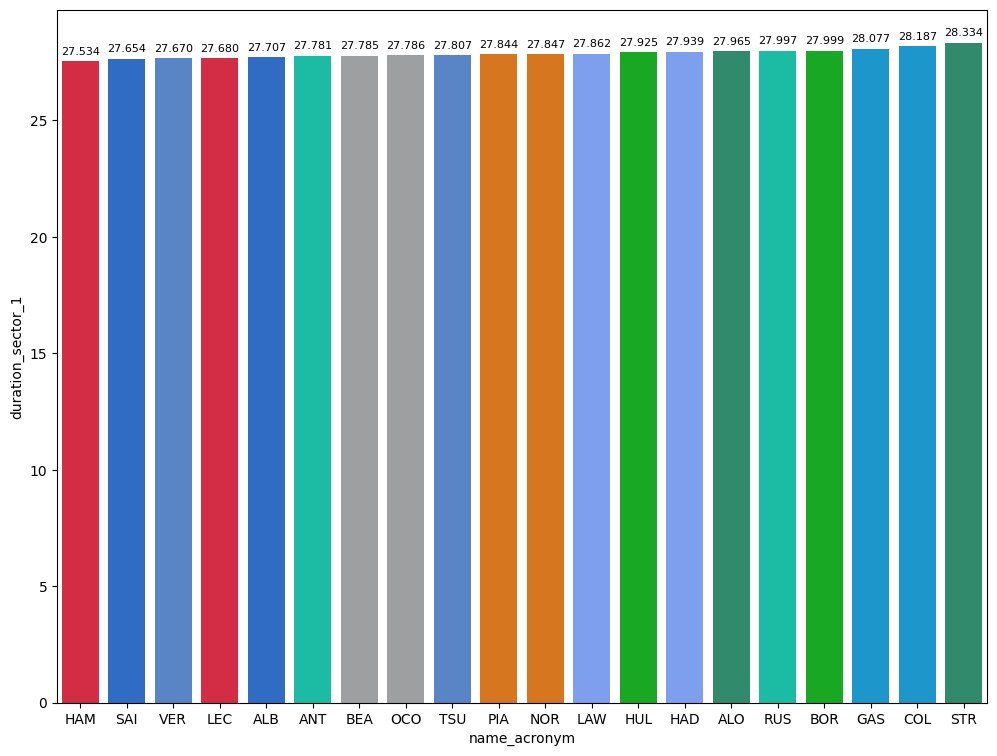

In [226]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_1'].idxmin()].sort_values(by=['duration_sector_1'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_1",sectorPace)

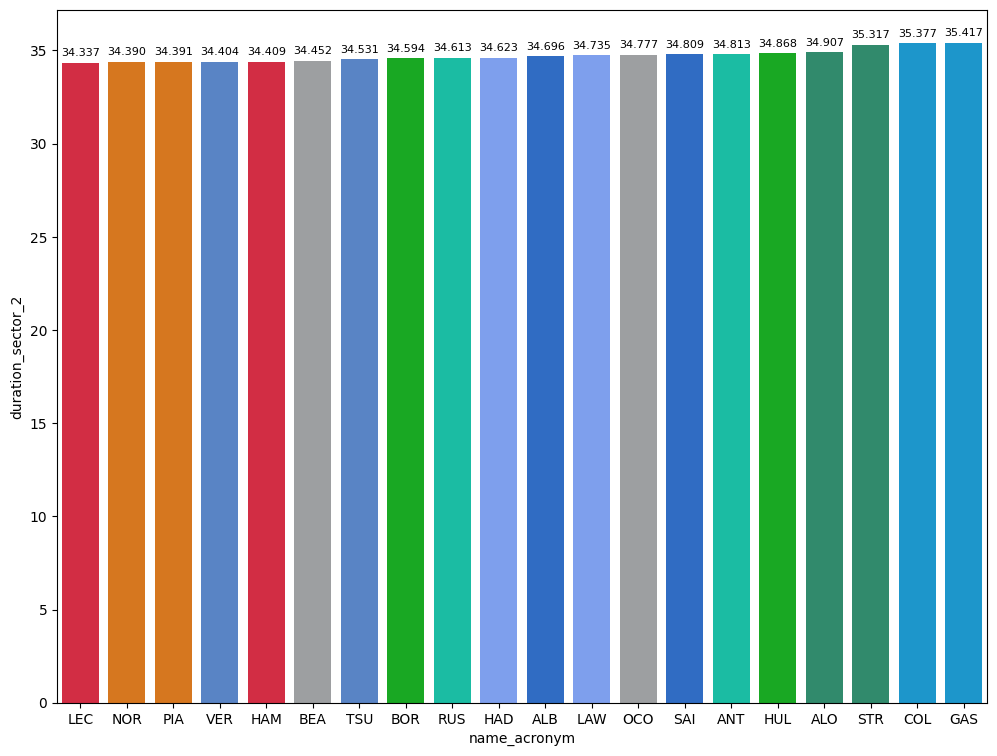

In [227]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_2'].idxmin()].sort_values(by=['duration_sector_2'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_2",sectorPace)

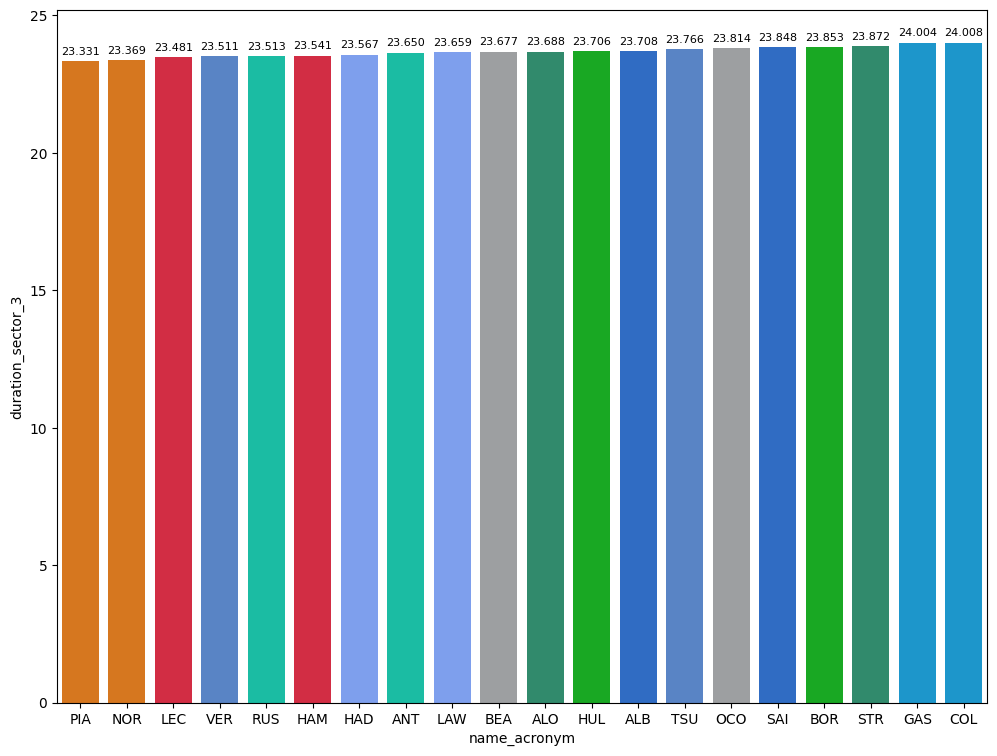

In [228]:
sectorPace = jointables2.loc[jointables2.groupby(['driver_number'])['duration_sector_3'].idxmin()].sort_values(by=['duration_sector_3'],ascending=True)
libraryDataF1.obtainchart("name_acronym","duration_sector_3",sectorPace)

### Mean pace with the different compound used on the session

In [229]:
race_pace = pd.DataFrame(jointables2.query("is_pit_out_lap == False  and lap_duration <= 103").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
SOFT,88.313000
MEDIUM,89.073087
HARD,91.740143


### Comparaison between the poleman and the second

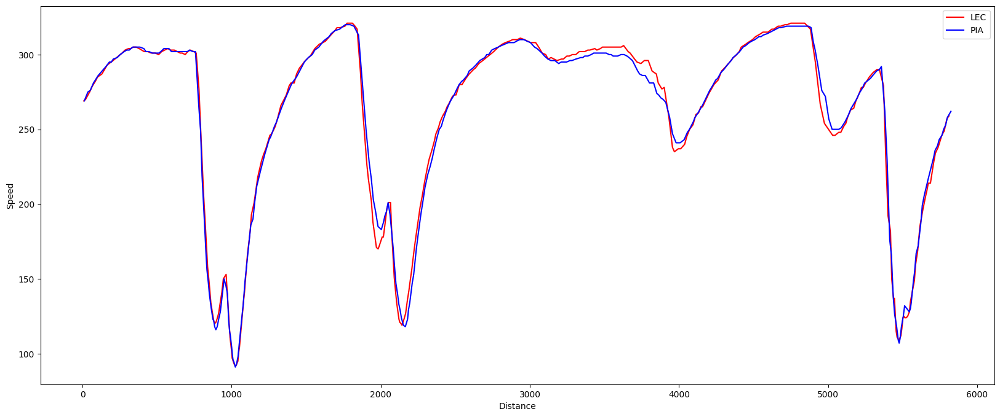

In [262]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

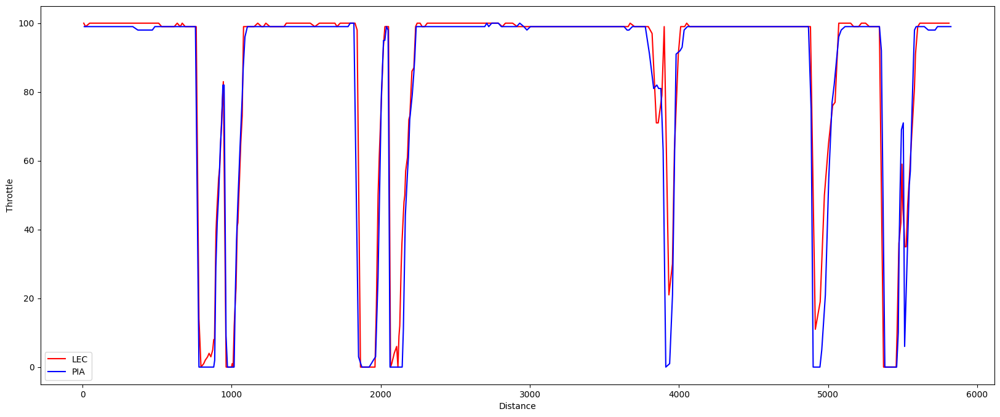

In [263]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

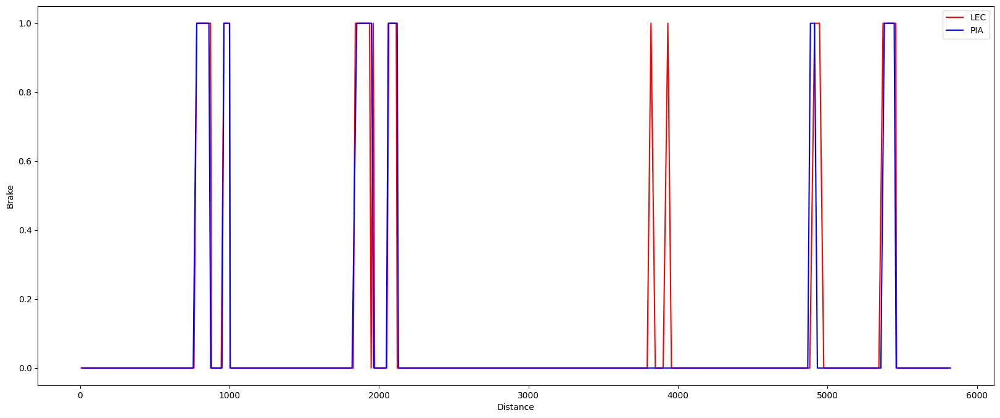

In [264]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

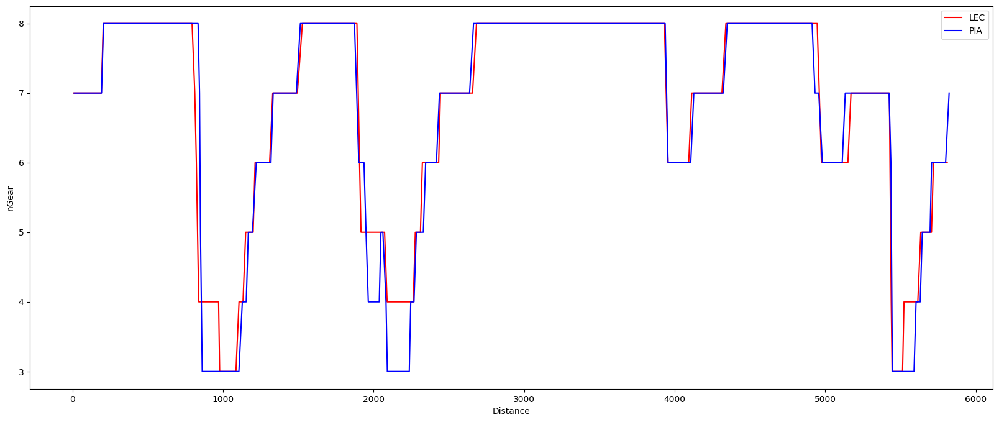

In [265]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Qualyfing
### Set up
First of all, it is neccesary to obtain the data about the qualyfing
#### Race control
This section has been added in order to know which laps has been deleted and knowing what happened on track during this session. As every laptime that has been deleted were slow laps, none of them were removed.

In [3]:
libraryDataF1.obtain_information('race_control',session_key=9943)

,meeting_key,session_key,date,driver_number,lap_number,category,flag,scope,sector,message
0,1277,9943,2025-07-05T14:00:00+00:00,None,None,Flag,GREEN,Track,NaN,GREEN LIGHT - PIT EXIT OPEN
1,1277,9943,2025-07-05T14:09:43+00:00,None,None,Flag,YELLOW,Sector,17.0,YELLOW IN TRACK SECTOR 17
2,1277,9943,2025-07-05T14:09:44+00:00,None,None,Flag,YELLOW,Sector,1.0,YELLOW IN TRACK SECTOR 1
3,1277,9943,2025-07-05T14:09:59+00:00,None,None,Flag,CLEAR,Sector,1.0,CLEAR IN TRACK SECTOR 1
4,1277,9943,2025-07-05T14:10:13+00:00,None,None,Flag,CLEAR,Sector,17.0,CLEAR IN TRACK SECTOR 17
5,1277,9943,2025-07-05T14:11:02+00:00,None,None,Flag,YELLOW,Sector,2.0,YELLOW IN TRACK SECTOR 2
6,1277,9943,2025-07-05T14:11:11+00:00,None,None,Flag,RED,Track,NaN,RED FLAG
7,1277,9943,2025-07-05T14:11:12+00:00,None,None,Flag,CLEAR,Sector,2.0,CLEAR IN TRACK SECTOR 2
8,1277,9943,2025-07-05T14:17:30+00:00,None,None,Other,None,None,NaN,SESSION WILL RESUME AT 15:21
9,1277,9943,2025-07-05T14:17:39+00:00,None,None,Flag,CLEAR,Track,NaN,TRACK CLEAR


### Obtain setup

In [4]:
qualyfing = libraryDataF1.obtain_information('laps',session_key=9943)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9943)
drivers = libraryDataF1.obtain_information('drivers',session_key=9943)
libraryDataF1.obtain_drivers_colours(drivers)

In [5]:
session = ff1.get_session(2025, 12, 'Q')
session.load()
session.laps["LapTimeSeconds"] = session.laps["LapTime"].dt.total_seconds()

req         WARNING 	DEFAULT CACHE ENABLED! (4.41 GB) /home/frank/.cache/fastf1


core           INFO 	Loading data for British Grand Prix - Qualifying [v3.3.0]
req            INFO 	No cached data found for session_info. Loading data...
_api           INFO 	Fetching session info data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for driver_info. Loading data...
_api           INFO 	Fetching driver list...
req            INFO 	Data has been written to cache!
logger      WARNING 	Failed to load result data from Ergast!
core        WARNING 	No result data for this session available on Ergast! (This is expected for recent sessions)
req            INFO 	No cached data found for session_status_data. Loading data...
_api           INFO 	Fetching session status data...
req            INFO 	Data has been written to cache!
req            INFO 	No cached data found for track_status_data. Loading data...
_api           INFO 	Fetching track status data...
req            INFO 	Data has been written to cache!
req            INFO 

To obtain a better analysis, those laptimes deleted will be removed from this analysis in order to obtain the data with valid values. So that,taking into account the race control table, it will be neccesary to consult the qualyfing data to obtain the ids. 

In [6]:
# laptimes_deleted = [115.370,96.993,109.924,104.377,102.586,128.082,95.902,102.051]
# driver_number_lap_deleted = [4,63,1,24,22,14,55,23]

# for ltime_deleted, dn_time_deleted in zip(laptimes_deleted,driver_number_lap_deleted):
#     try:
#         id_deleted = qualyfing.query("driver_number == @dn_time_deleted and lap_duration == @ltime_deleted").index[0]
#         qualyfing = qualyfing.drop(id_deleted)
#     except:
#         print("Laptime deleted associated with the selected driver does not exist. Please, check again the order of the arrays")

In [7]:
bestlap = qualyfing.loc[qualyfing.groupby(['driver_number'])['lap_duration'].idxmin()].sort_values(by=['lap_duration'],ascending=True)
bestlap[0:1]

,meeting_key,session_key,driver_number,lap_number,date_start,duration_sector_1,duration_sector_2,duration_sector_3,i1_speed,i2_speed,is_pit_out_lap,lap_duration,segments_sector_1,segments_sector_2,segments_sector_3,st_speed
280,1277,9943,1,17,2025-07-05T15:09:28.589000+00:00,27.493,33.973,23.426,323.0,273.0,False,84.892,"[2051, 2051, 2051, 2049, 2049, 2048, 2051]","[2049, 2049, 2048, 2049, 2051, 2051, 2051, 205...","[2048, 2048, 2048, 2048, 2049, 2048, 2048, 204...",323.0


Taking into account the fastest lap time, those laptimes underneath the fastest lap time multiplied by 1.07 will be taken into account.

In [8]:
competitiveLaps = qualyfing.query("is_pit_out_lap == False and lap_duration < 90.83")

In [9]:
drivers_list = list(competitiveLaps['driver_number'].unique())
newdataset = pd.DataFrame()
for driver in drivers_list:
    newdataset =libraryDataF1.obtain_information_qualy(driver,competitiveLaps,newdataset)
jointables = pd.merge(newdataset,drivers,on=['driver_number'])
jointables.sort_values(by=['fastest_lap'],ascending=True)
print()

#### Best lap per driver compared with the best lap of the session
In this chart we can see the deltas with compared with the fastest lap of the session that it could be different than the pole. Racing Bulls had shown a good pace in FP but in qualyfing suffered.
On the other hand, Gasly and Bearman had a good qualyfing session being able to enter to Q3.

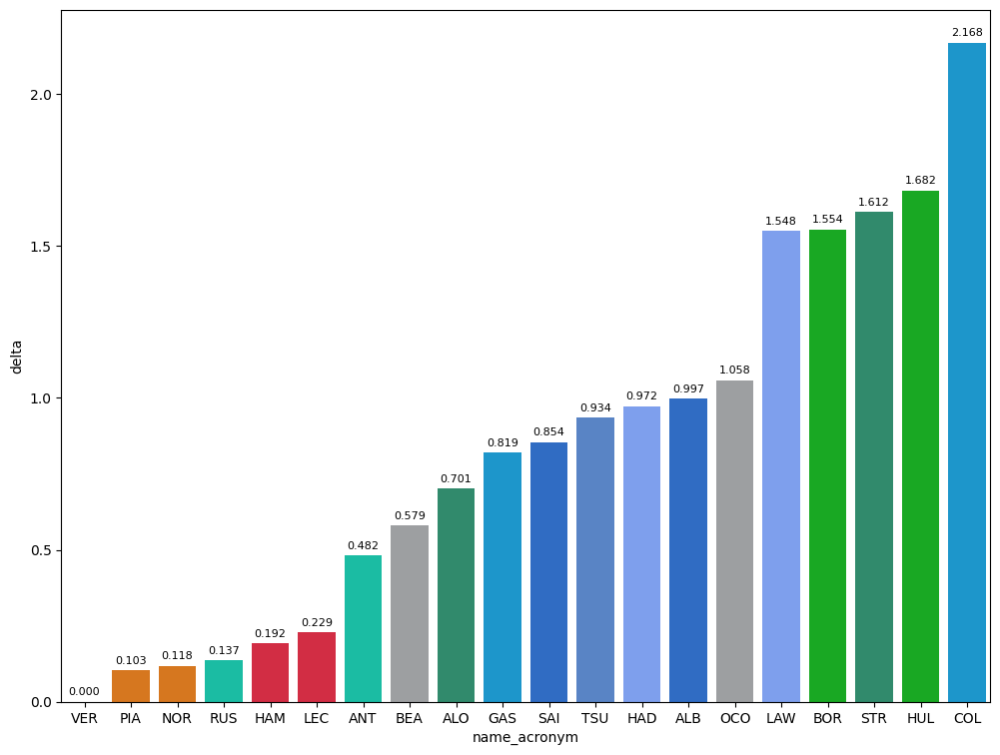

In [10]:
dt = jointables.sort_values(by=['fastest_lap'],ascending=True)
libraryDataF1.obtainchart("name_acronym","delta",dt)

### Speed trap

#### Maximum speed per drivers
Red Bull centered on straight so they decided to gamble for a configuration centered on less aerodynamic centered on straights. Sauber as previous gp and Alpine centered them on this configuration. On the other hand, Mercedes and Racing Bulls centered on a configuration with more aerodynamic.

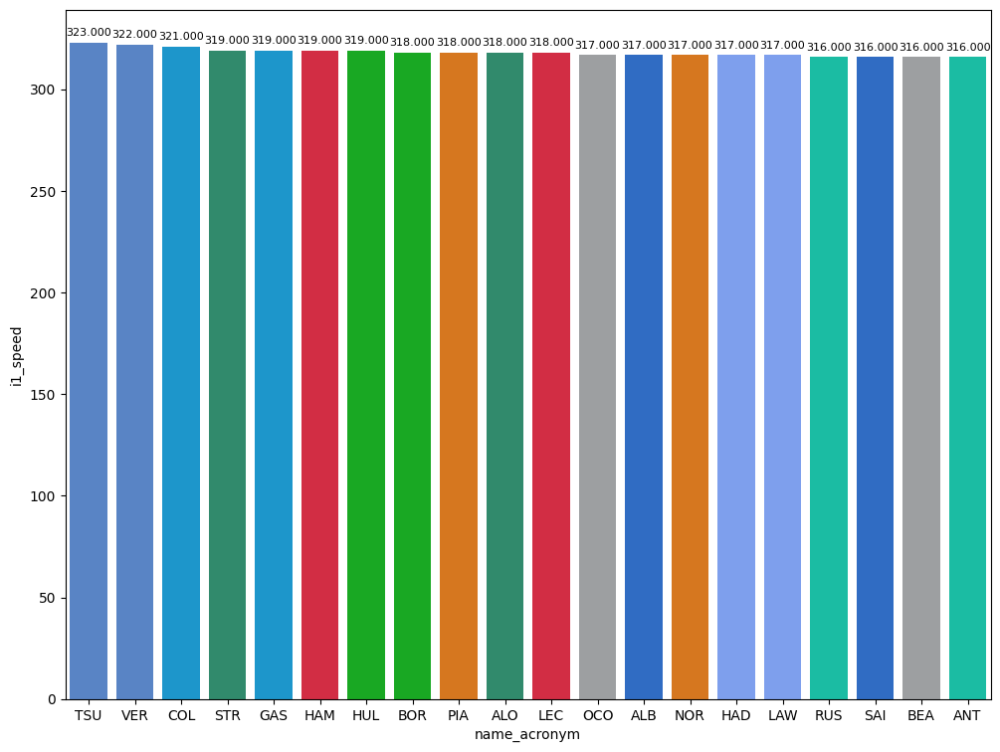

In [11]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

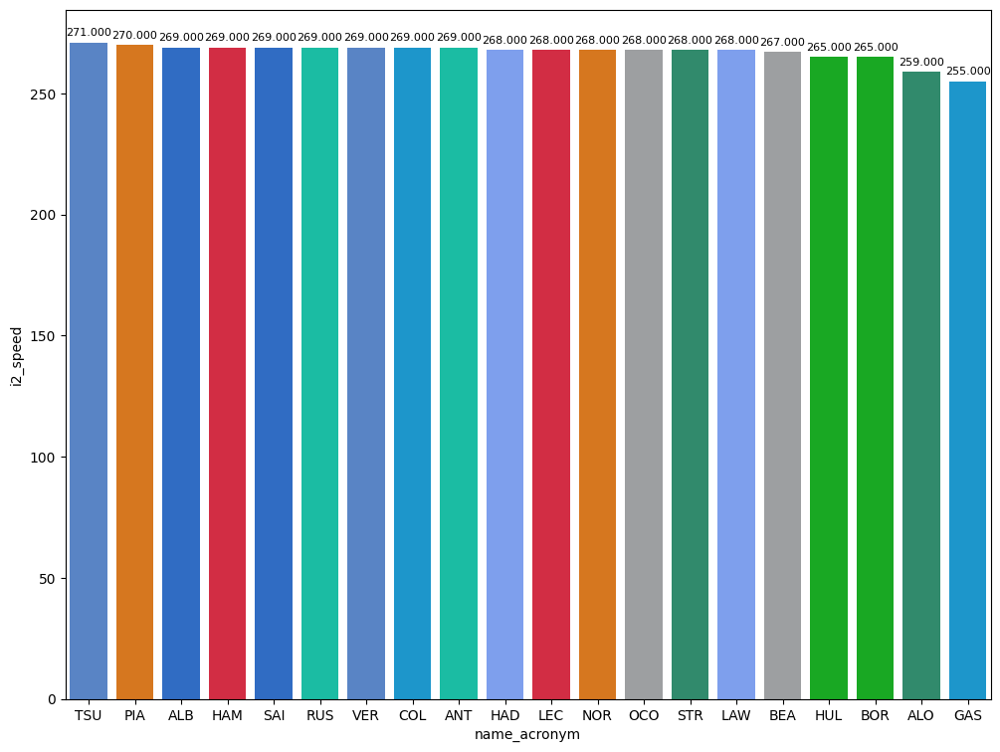

In [12]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

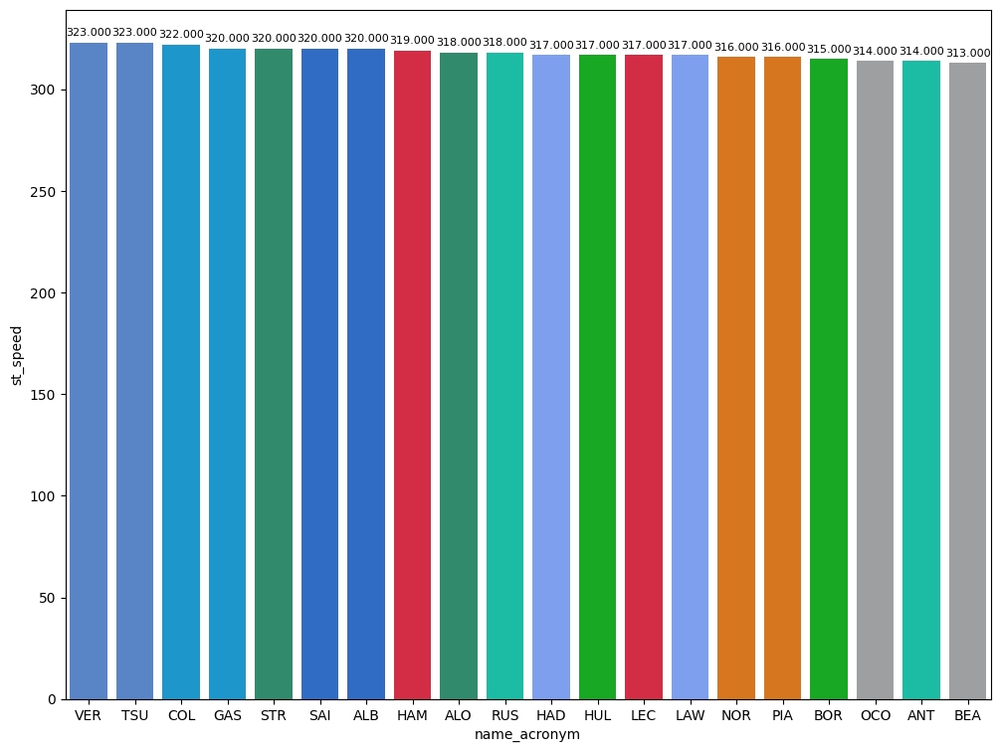

In [13]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

### Maximum speed per teams

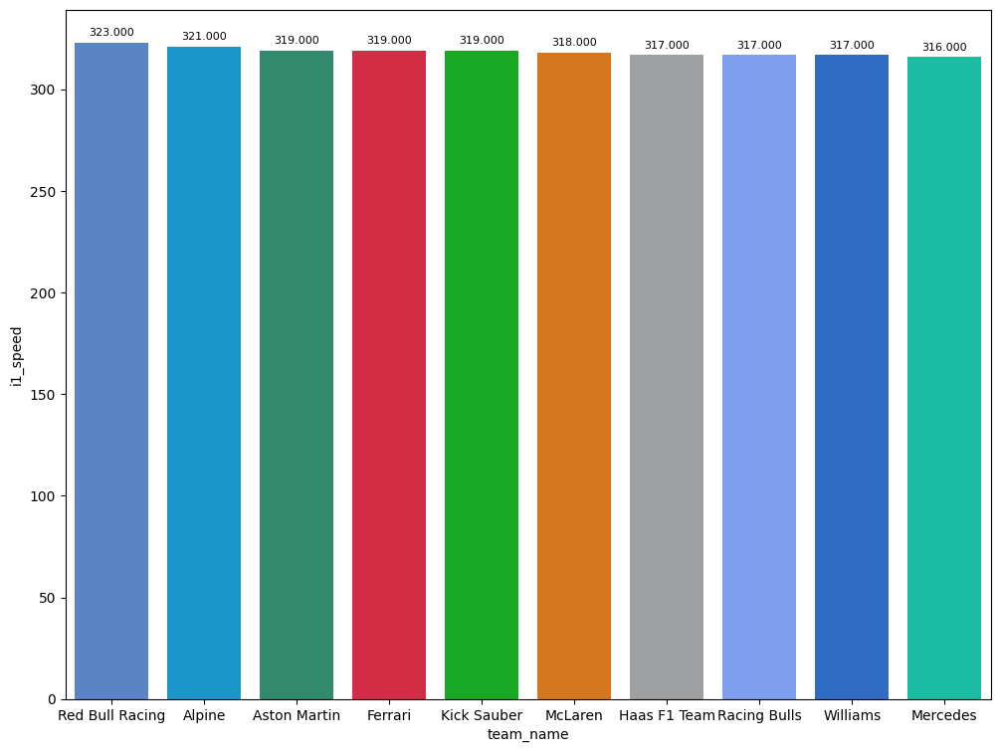

In [14]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i1_speed",top_speed)

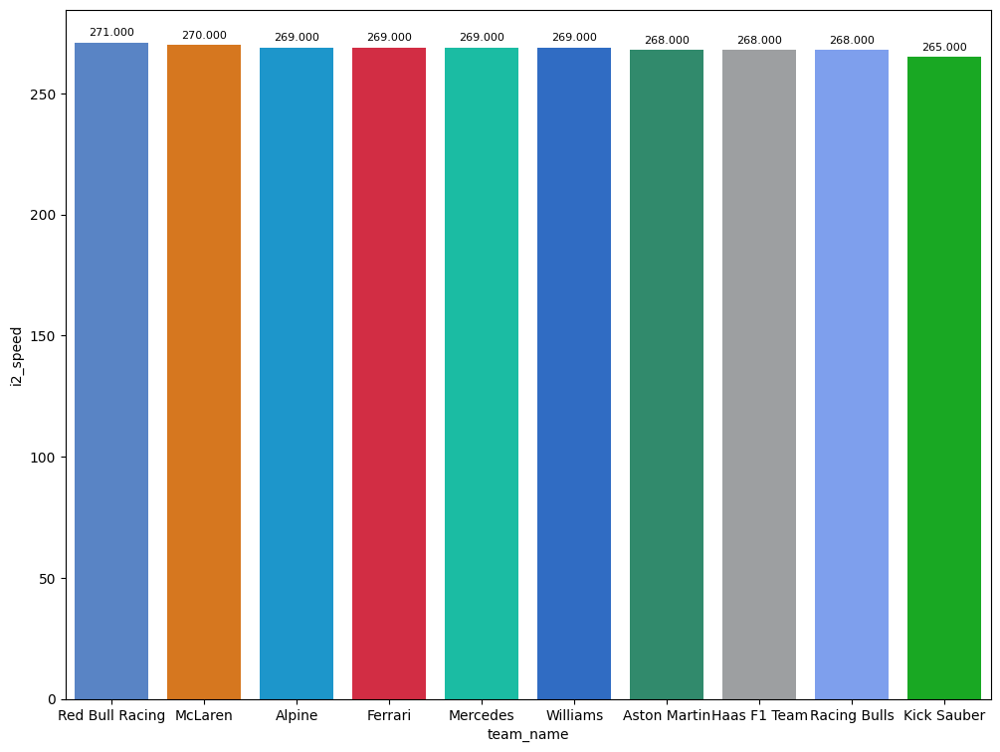

In [15]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","i2_speed",top_speed)

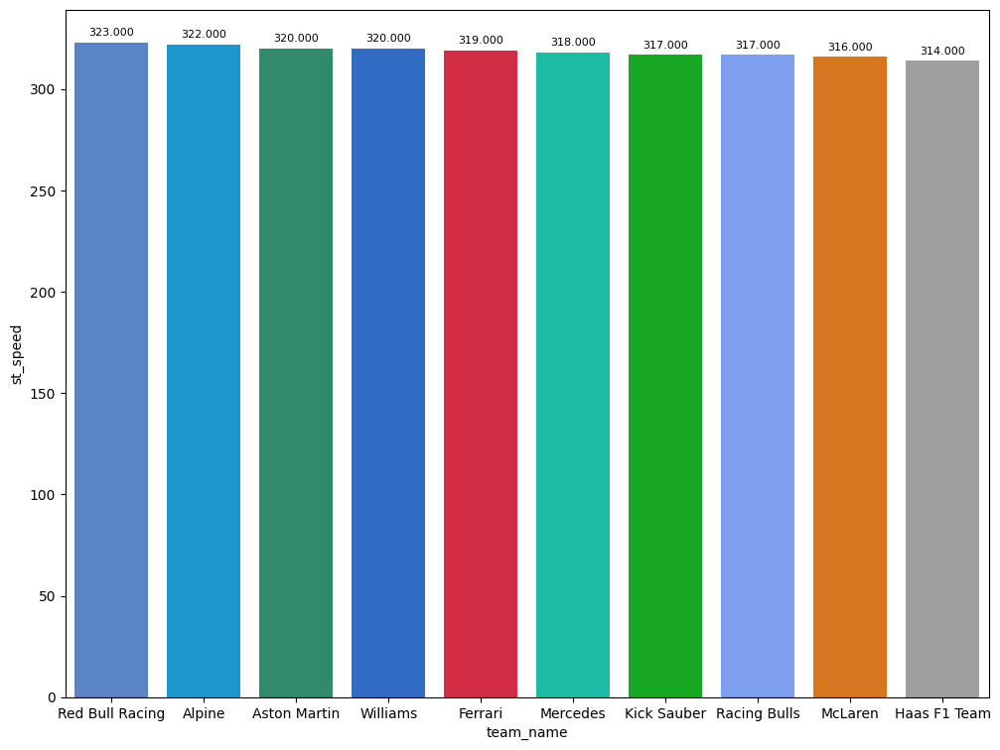

In [16]:
top_speed = jointables.loc[jointables.groupby(['team_name'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("team_name","st_speed",top_speed)

In [21]:
mergequaly = pd.merge(competitiveLaps,drivers,on=['driver_number'])

In order to know when each session finished, race control dataset will be consulted.

In [22]:
maximumDateQ1 = "date_start <'2025-07-05T14:35:00+00:00'"
maximumDateQ2 = "date_start <'2025-07-05T14:58:00+00:00' and date_start >'2025-07-05T14:35:00+00:00'"
maximumDateQ3 = "date_start >'2025-07-05T14:58:00+00:00'"

### Qualyfing 1
In this session the surprise came from Sergio Perez that was knocked-out in this section. In the next sesssion, we will see what happened with Perez.

In [23]:
q1Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ1).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver,I will do a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap. 
<br>
Colapinto had a better pace than Gasly during free practice but his crashed relegated him to the last position. Excepting him, the other drivers were close to pass to Q2. After this overview, fastest lap will be analyzed
<br>
Sector 1: Gasly was very fast in this sector, even being faster than Piastri and being 46 milisecond slowe than the fastest time in this sector.
<br>
Sector 2: From Brooklands to Hangar Straight, Gasly suffered here. He lost his advantage with the drivers who passed and with Lawson and Bortoleto.
<br>
Sector 3: Lawson, Bortoleto and Hulkenberg were faster than Pierre and, if they had been faster in sector 1, they would have been entered to Q2.



In [24]:
#Reference
P15 = q1Data[14:15]

In [25]:
print(
"Driver:",P15.full_name.to_string(index=False),
"Sector 1: ",P15.duration_sector_1.to_string(index=False),
"Sector 2: ",P15.duration_sector_2.to_string(index=False),
"Sector 3: ",P15.duration_sector_3.to_string(index=False)
)

Driver: Pierre GASLY Sector 1:  27.797 Sector 2:  34.786 Sector 3:  23.745


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.


In [27]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[15::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,30,0.112,0.312,-0.123,-0.077,LAW
1,5,0.118,0.194,-0.008,-0.068,BOR
2,18,0.176,0.107,0.037,0.032,STR
3,27,0.246,0.379,0.034,-0.167,HUL
4,43,0.732,0.484,0.238,0.010,COL


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

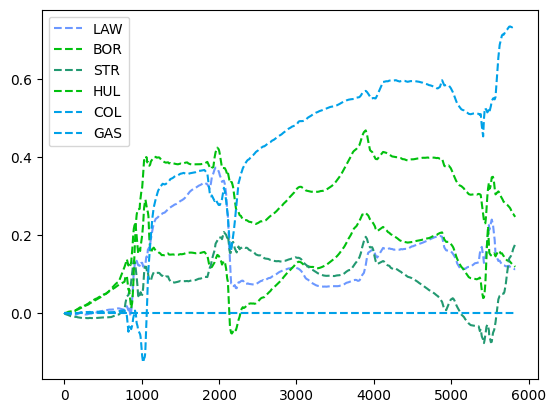

In [28]:
libraryDataF1.draw_gap(P15,15,20,q1Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk
I bring this section in order to know where the driver at risk lost his chances to improve in the qualyfing.
Sector 2 and Sector 3 were crucial to pass to Q2.

In [29]:
newdataset2 = pd.DataFrame()
for index,row in q1Data[0:14].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P15,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,1,-0.442,0.039,-0.292,-0.189,VER
1,81,-0.365,0.173,-0.235,-0.303,PIA
2,87,-0.323,-0.036,-0.296,0.009,BEA
3,23,-0.235,-0.049,-0.104,-0.082,ALB
4,14,-0.220,0.122,-0.151,-0.191,ALO
5,4,-0.205,0.282,-0.254,-0.233,NOR
6,31,-0.192,-0.006,-0.092,-0.094,OCO
7,55,-0.153,-0.066,-0.039,-0.048,SAI
8,6,-0.151,0.282,-0.259,-0.174,HAD
9,16,-0.142,0.210,-0.176,-0.176,LEC


#### Best sector per driver
In this section we can see the best sector of the session
Thanks to his first sector, Gasly qualyfied to Q2. Taking into account his sector 2 and 3 he would have been knocked out of Q2.

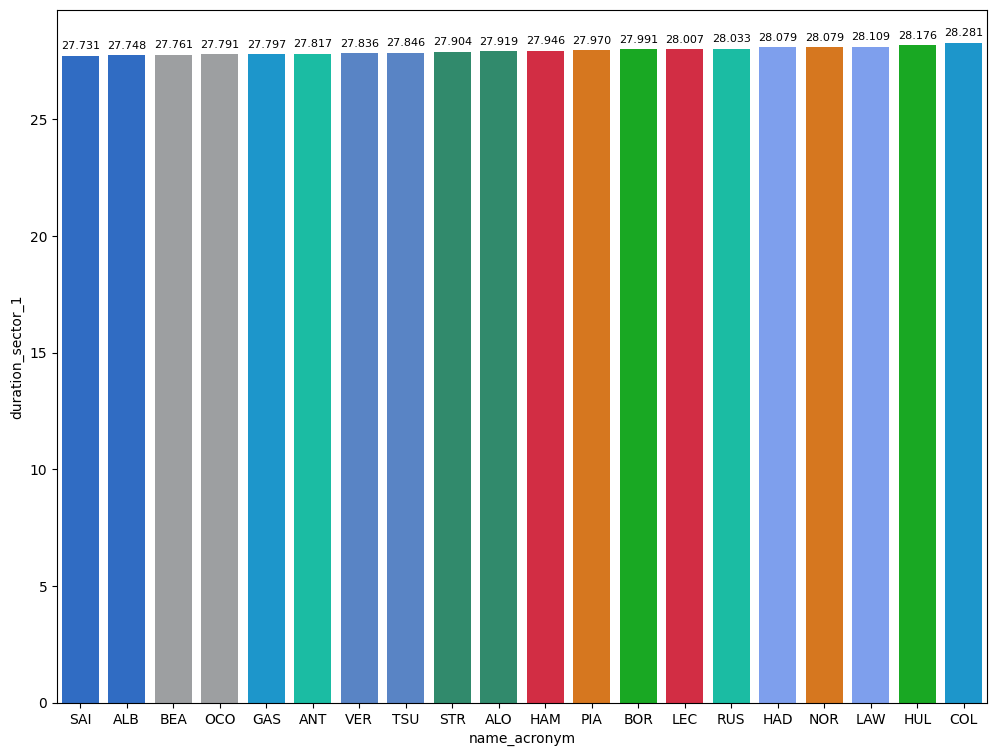

In [30]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q1Data.sort_values(by=['duration_sector_1'],ascending=True))

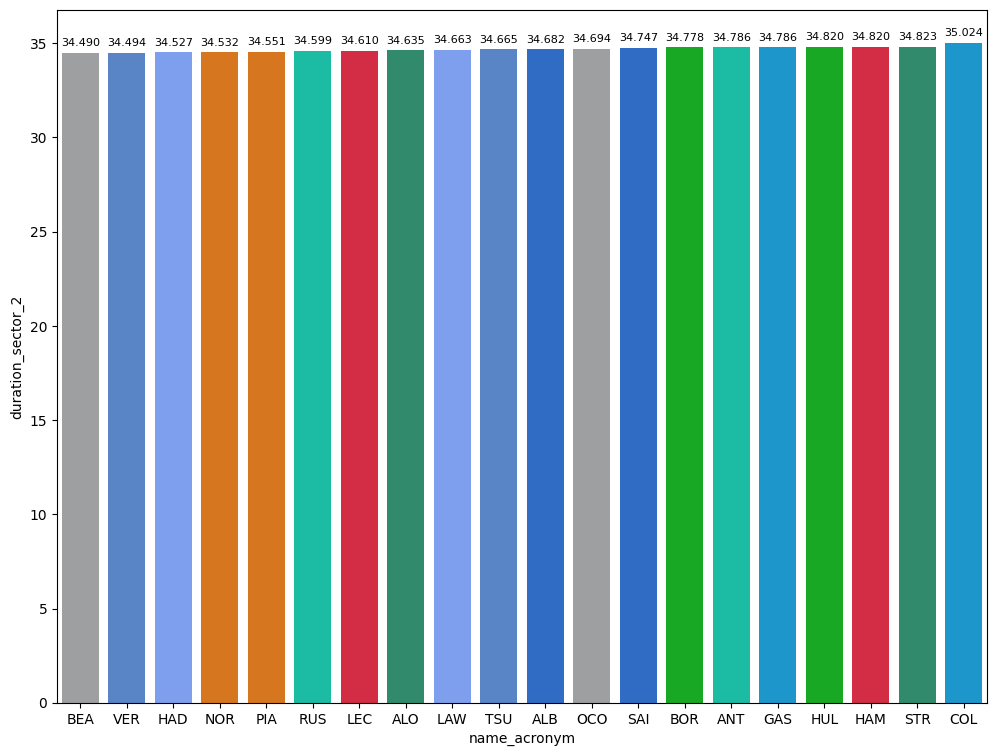

In [31]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q1Data.sort_values(by=['duration_sector_2'],ascending=True))

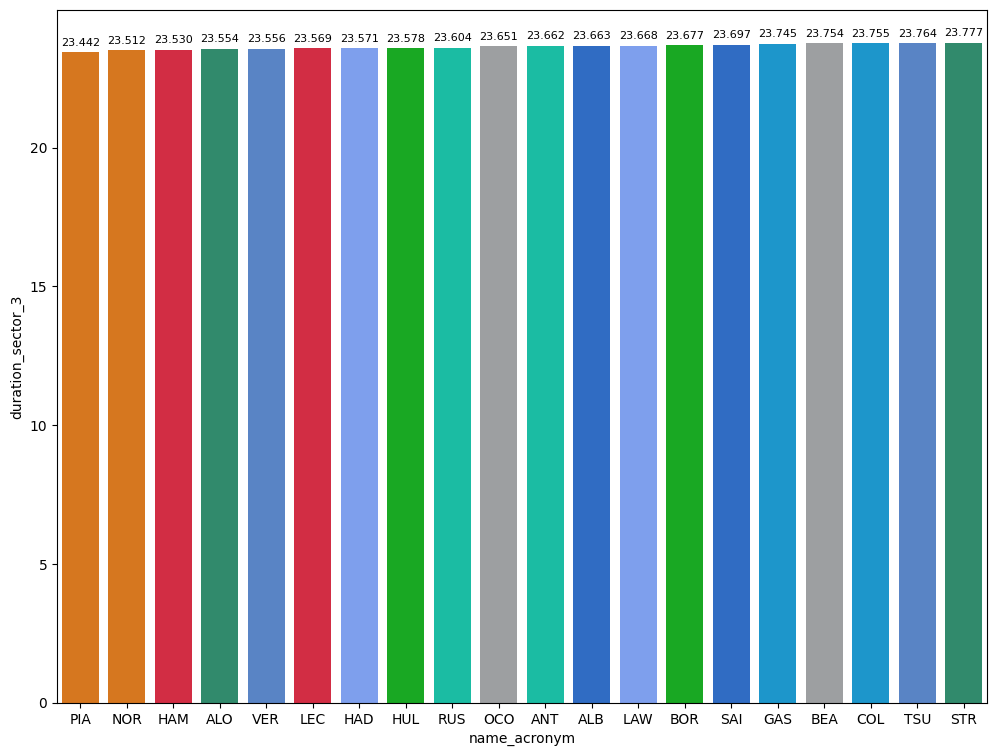

In [32]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q1Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 2


In [33]:
q2Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ2).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with driver at risk
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [34]:
#Reference
P10 = q2Data[9:10]
print(
"Driver:",P10.full_name.to_string(index=False),
"Sector 1: ",P10.duration_sector_1.to_string(index=False),
"Sector 2: ",P10.duration_sector_2.to_string(index=False),
"Sector 3: ",P10.duration_sector_3.to_string(index=False)
)

Driver: Pierre GASLY Sector 1:  27.777 Sector 2:  34.533 Sector 3:  23.401


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Sector 1: Gasly was strong in sector 1 but not much as Q1. He was faster than the eliminated drivers except Sainz but faster than Russell.<br>
Sector 2: Gasly suffered in this sector being the slowest in this sector. <br>
Sector 3: Williams suffered here with Sainz being knocked-out of Q3 and Ocon as well.

In [35]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[10::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,55,0.035,-0.084,-0.084,0.203,SAI
1,22,0.115,0.087,-0.191,0.219,TSU
2,6,0.153,0.129,-0.075,0.099,HAD
3,23,0.178,0.026,-0.077,0.229,ALB
4,31,0.239,0.084,-0.132,0.287,OCO


/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_time` is considered deprecated and willbe modified or removed in a future release because it hasa tendency to give inaccurate results.
  warnings.warn("`utils.delta_time` is considered deprecated and will"
/home/frank/.local/lib/python3.8/site-packages/fastf1/utils.py:91: FutureWarning: `utils.delta_ti

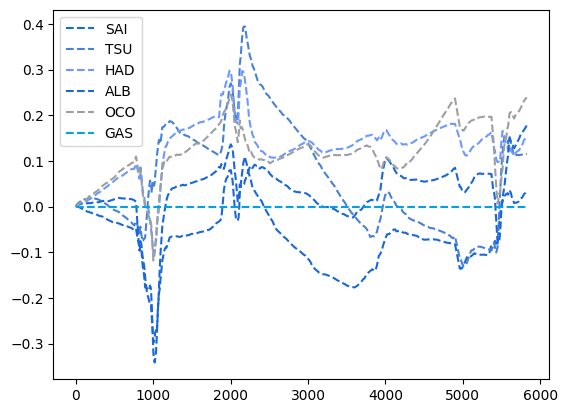

In [36]:
libraryDataF1.draw_gap(P10,10,15,q2Data,drivers,session)

##### Analysis with the drivers that finished better than the driver at risk

In [37]:
newdataset2 = pd.DataFrame()
for index,row in q2Data[0:9].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P10,newdataset2)

newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,44,-0.627,-0.249,-0.354,-0.024,HAM
1,16,-0.578,-0.160,-0.344,-0.074,LEC
2,4,-0.480,-0.084,-0.422,0.026,NOR
3,1,-0.395,-0.128,-0.261,-0.006,VER
4,81,-0.395,-0.121,-0.317,0.043,PIA
5,87,-0.177,-0.156,-0.166,0.145,BEA
6,14,-0.118,-0.132,-0.168,0.182,ALO
7,12,-0.091,-0.096,-0.032,0.037,ANT
8,63,-0.074,0.070,-0.192,0.048,RUS


#### Best sector per driver
In this section we can see the best sector of the session

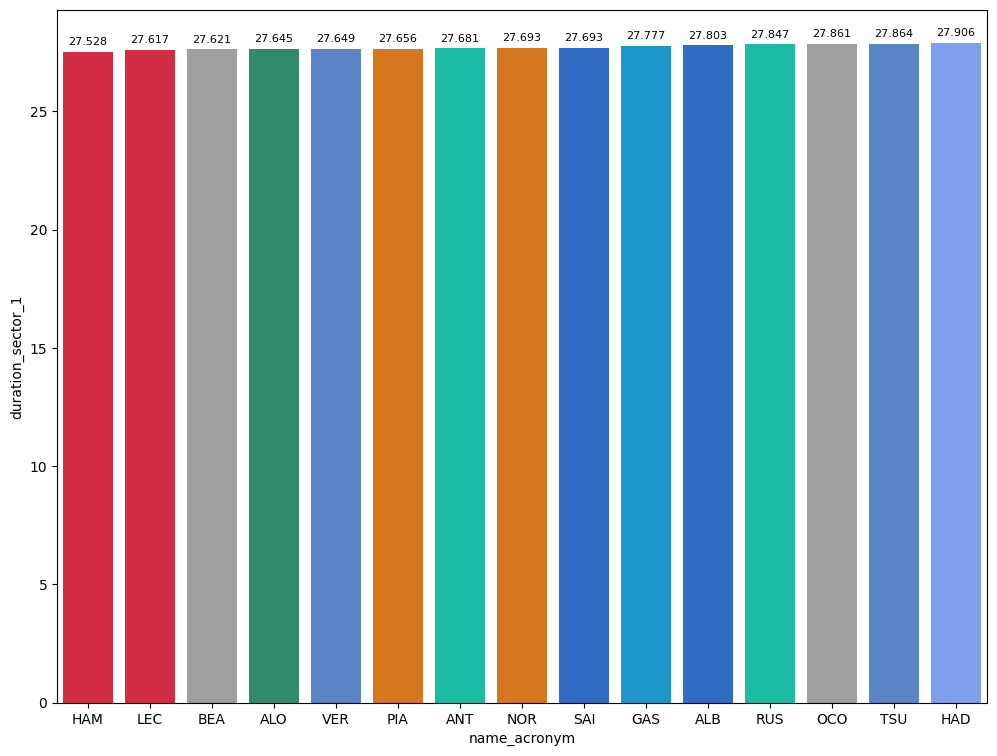

In [38]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q2Data.sort_values(by=['duration_sector_1'],ascending=True))

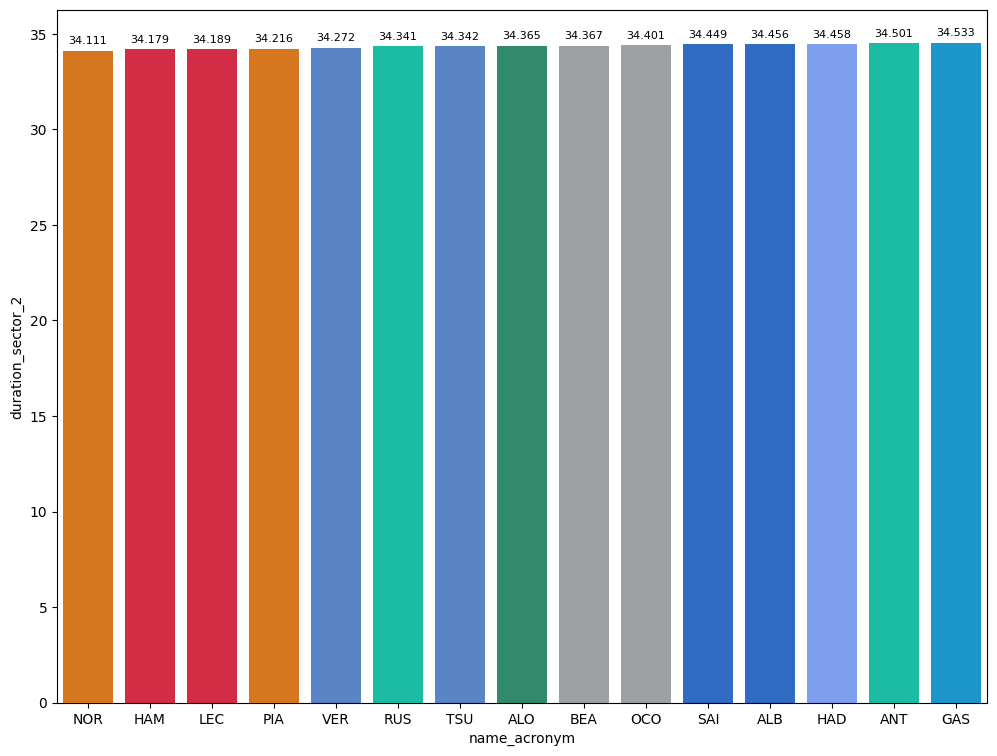

In [39]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q2Data.sort_values(by=['duration_sector_2'],ascending=True))

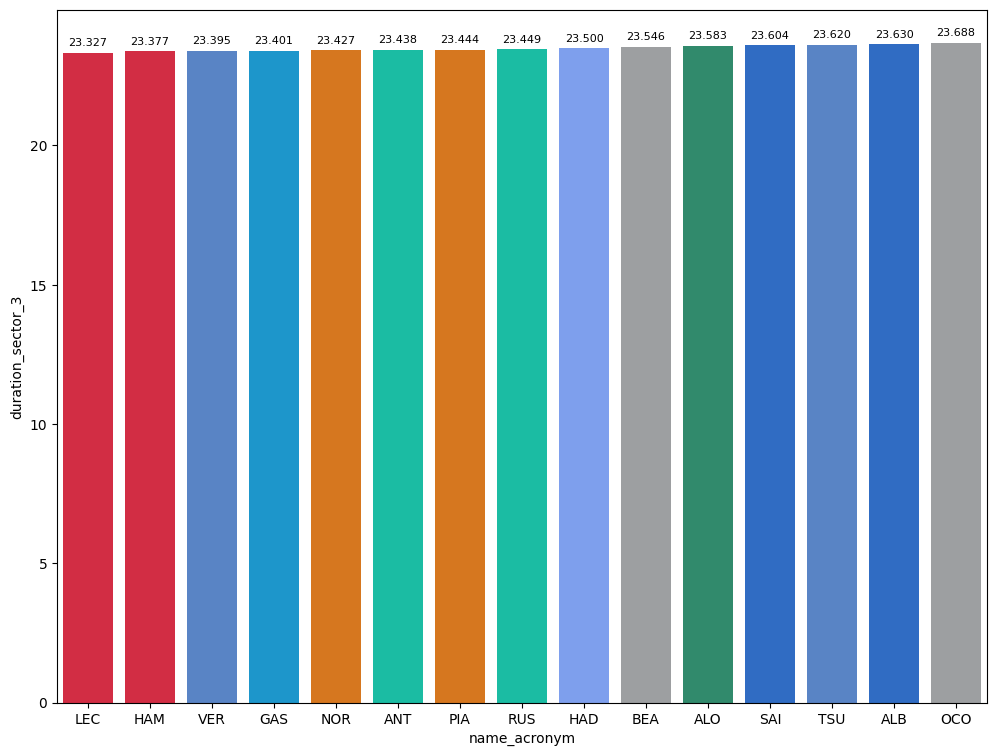

In [40]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q2Data.sort_values(by=['duration_sector_3'],ascending=True))

### Qualyfing 3

In [41]:
q3Data = libraryDataF1.obtainInfoAboutQualySession(mergequaly,maximumDateQ3).query("isFastestLap == True").sort_values(by=['lap_duration'],ascending=True)

##### Comparaison with poleman
In this section with the fastest lap done for each driver (laptimes deleted will not be taken into account to do this analysis) it will be a comparaison in order to see where the driver eliminated lost/gain time in their fastest lap.

In [42]:
#Reference
P1 = q3Data[:1]
print(
"Driver:",P1.full_name.to_string(index=False),
"Sector 1: ",P1.duration_sector_1.to_string(index=False),
"Sector 2: ",P1.duration_sector_2.to_string(index=False),
"Sector 3: ",P1.duration_sector_3.to_string(index=False)
)

Driver: Max VERSTAPPEN Sector 1:  27.493 Sector 2:  33.973 Sector 3:  23.426


##### Analysis of each sector of the driver at risk compared to the drivers eliminated.
Piastri suffered in the second sector being the fifth fastest in this part of the circuit. Even thought he as able to cut this gap in the first sector, being the fastest, the gap was enough for Max to take the pole.
In case of Norris, his problem was in the first sector being the eight fastest.
Hamilton was the unique to fight versus Max in the sector 1 but sector 2 was crucial to Max to take the advantage. Third sector was horrible for Ferrari being the sixth and eight fastest here.

In [43]:
newdataset2 = pd.DataFrame()
for index,row in q3Data[1::].iterrows():
    newdataset2 = libraryDataF1.obtain_difference_regard_reference(row,P1,newdataset2)
newdataset2

,driver_number,lap_duration,difference_sector_1,difference_sector_2,difference_sector_3,name_acronym
0,81,0.103,0.122,0.140,-0.159,PIA
1,4,0.118,0.166,0.054,-0.102,NOR
2,63,0.137,0.151,0.190,-0.204,RUS
3,44,0.203,0.007,0.138,0.058,HAM
4,16,0.229,0.142,0.063,0.024,LEC
5,12,0.482,0.165,0.306,0.011,ANT
6,87,0.579,0.205,0.324,0.050,BEA
7,14,0.729,0.138,0.345,0.246,ALO
8,10,0.893,0.242,0.491,0.160,GAS


#### Best sector per driver
In this section we can see the best sector of the session

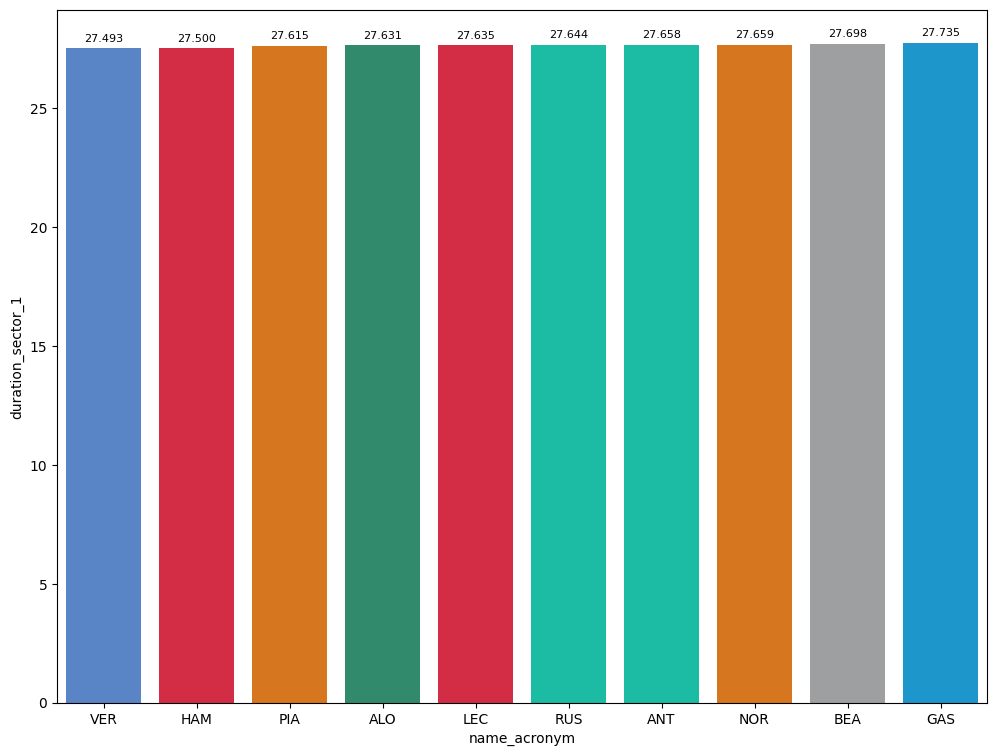

In [44]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",q3Data.sort_values(by=['duration_sector_1'],ascending=True))

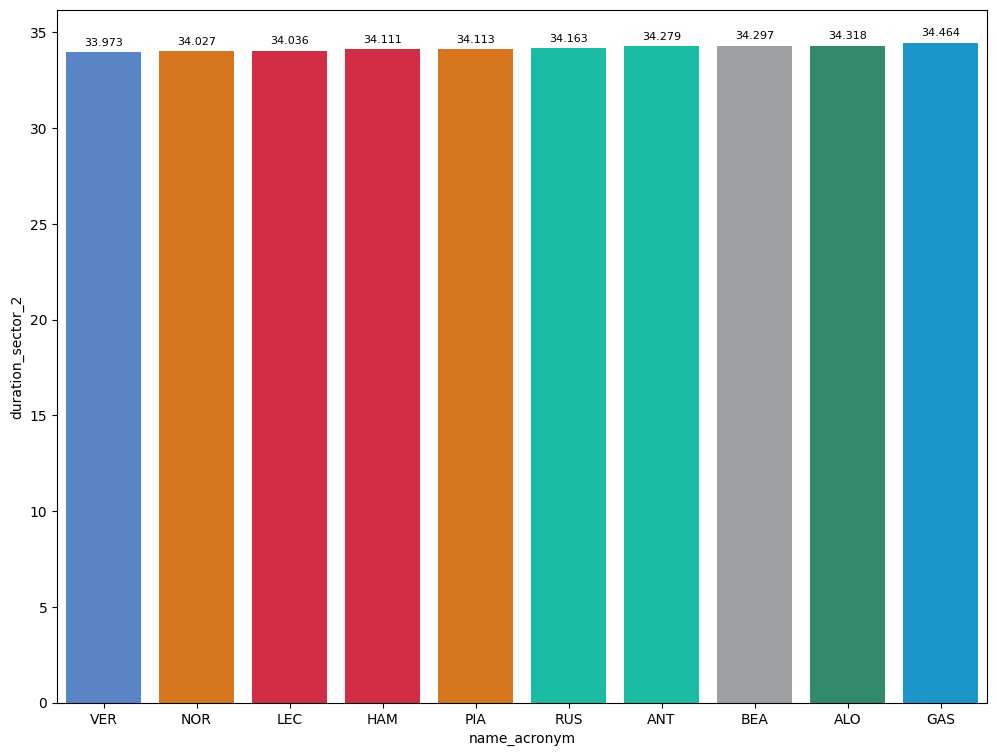

In [45]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",q3Data.sort_values(by=['duration_sector_2'],ascending=True))

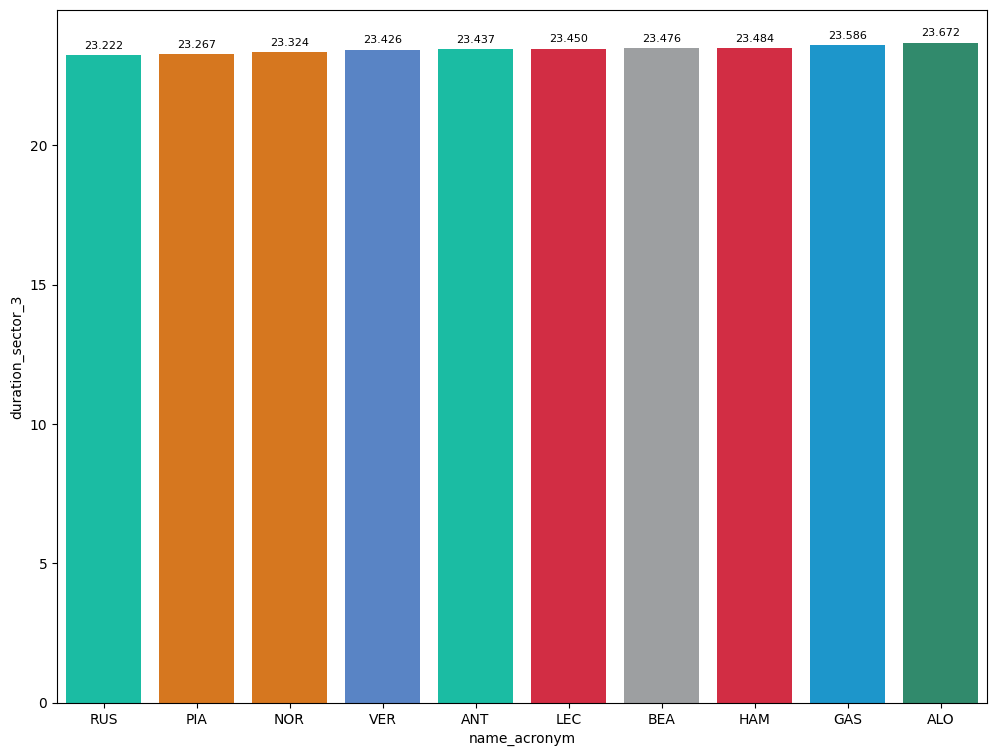

In [46]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",q3Data.sort_values(by=['duration_sector_3'],ascending=True))

#### Best sector per driver of the session (in general)

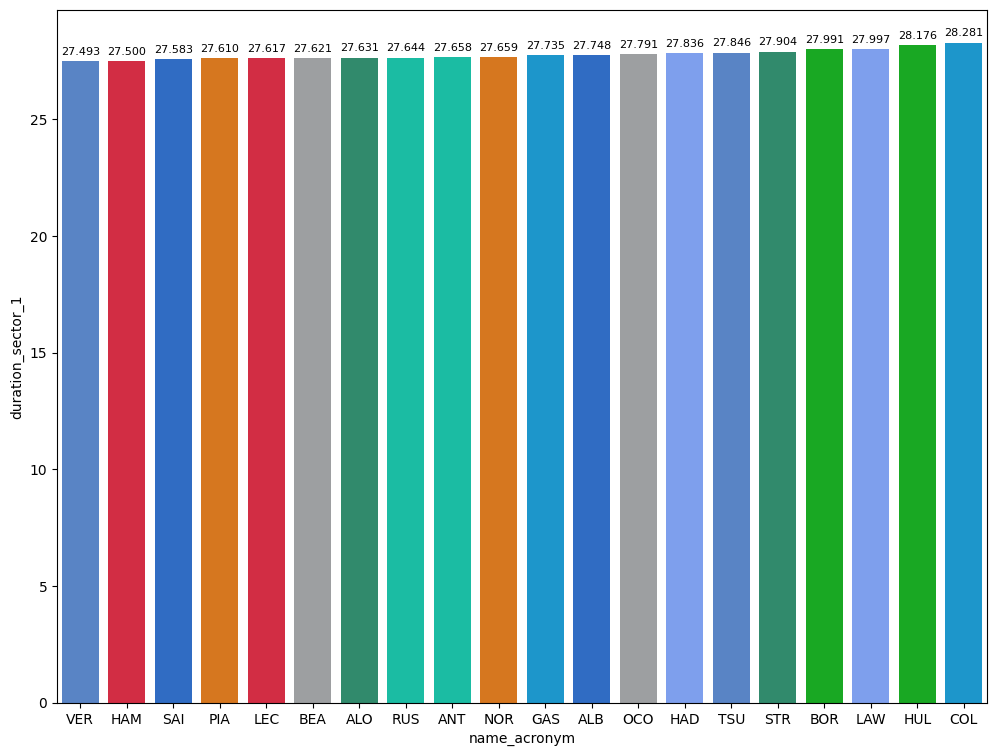

In [50]:
libraryDataF1.obtainchart("name_acronym","duration_sector_1",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_1'].min().sort_values(ascending=True)).reset_index())

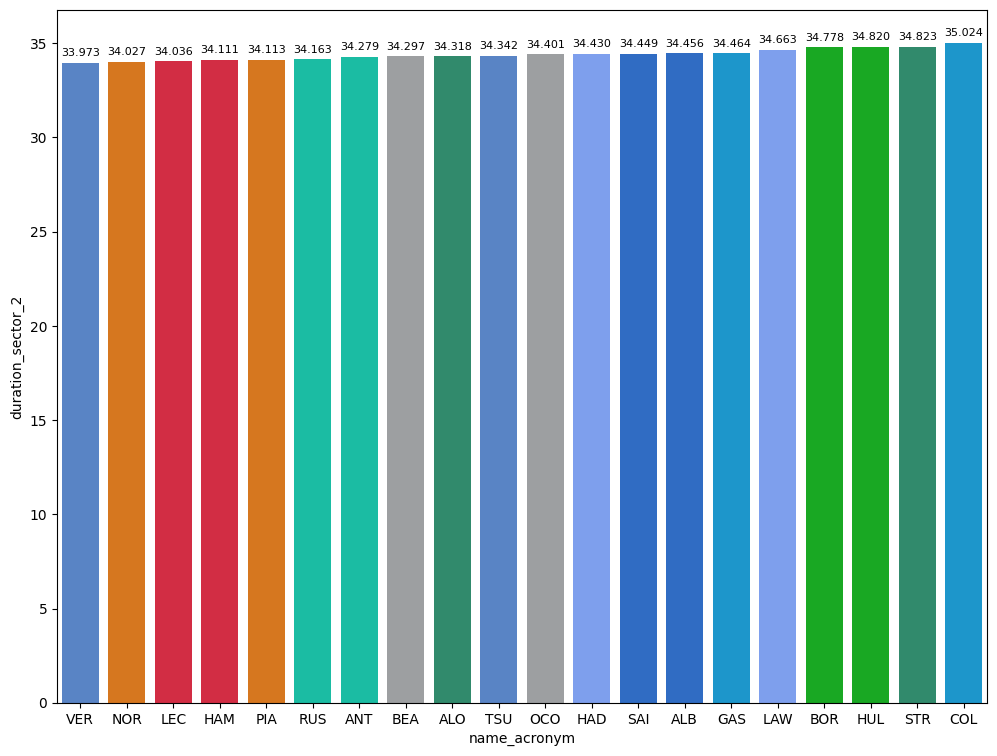

In [51]:
libraryDataF1.obtainchart("name_acronym","duration_sector_2",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_2'].min().sort_values(ascending=True)).reset_index())

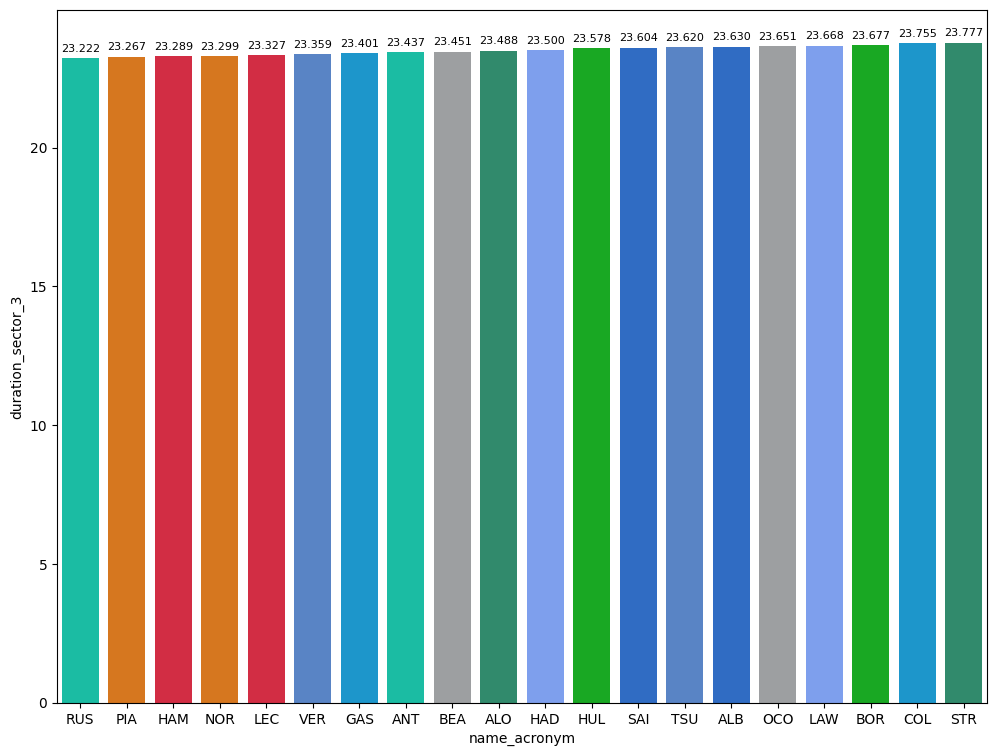

In [52]:
libraryDataF1.obtainchart("name_acronym","duration_sector_3",pd.DataFrame(mergequaly.groupby("name_acronym")['duration_sector_3'].min().sort_values(ascending=True)).reset_index())

### Comparaison between the poleman and the second

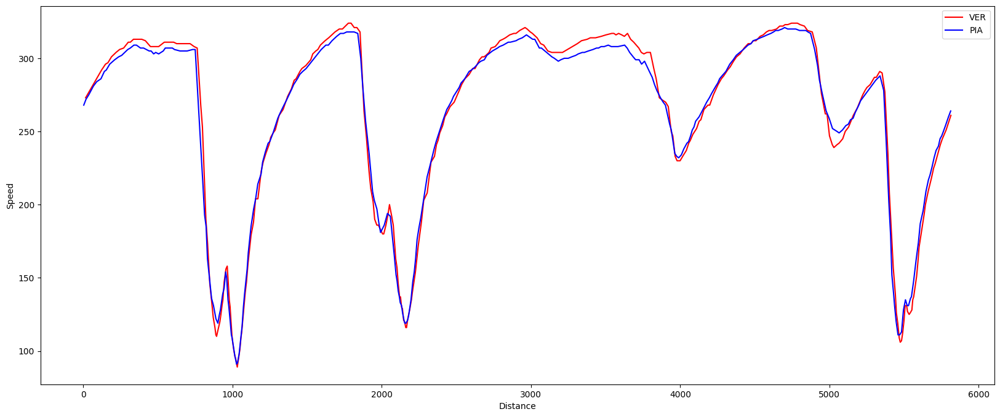

In [53]:
libraryDataF1.plot_telemetry("Distance","Speed",dt,session)

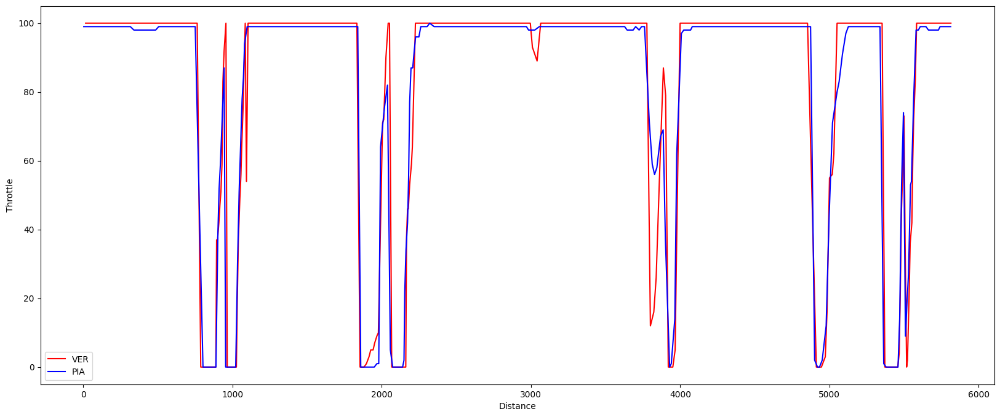

In [54]:
libraryDataF1.plot_telemetry("Distance","Throttle",dt,session)

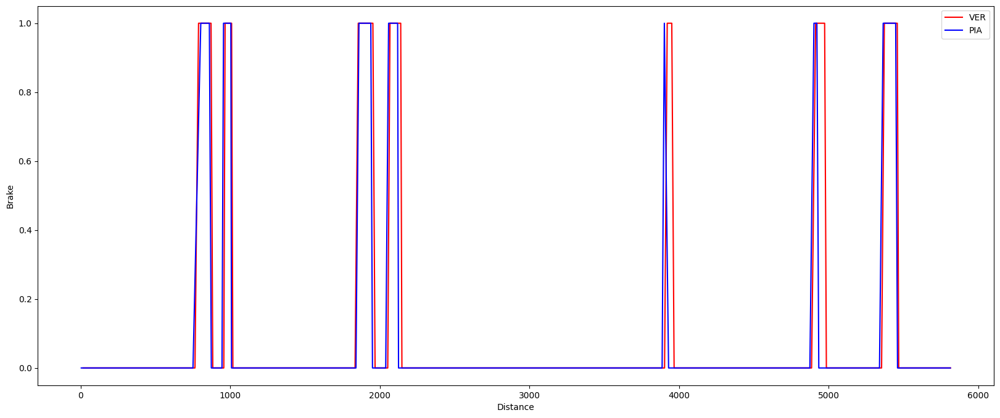

In [55]:
libraryDataF1.plot_telemetry("Distance","Brake",dt,session)

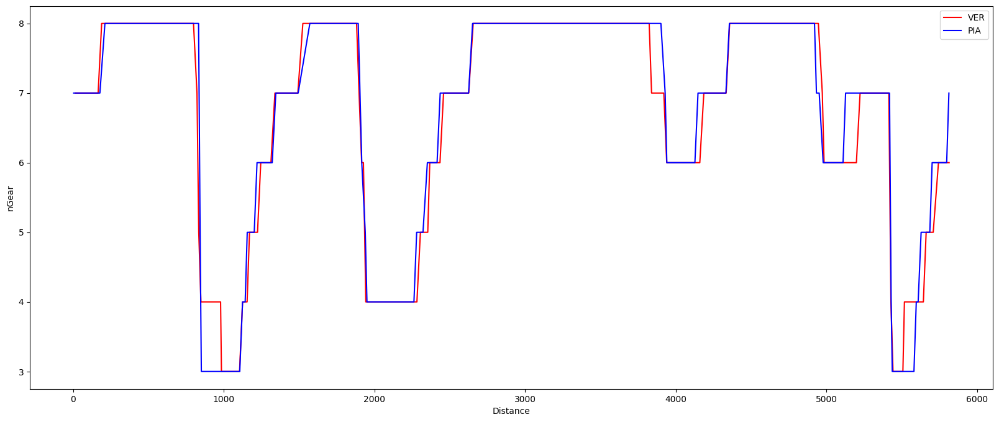

In [56]:
libraryDataF1.plot_telemetry("Distance","nGear",dt,session)

## Race
### Obtain setup

In [57]:
race = libraryDataF1.obtain_information('laps',session_key=9947)
stintInformation = libraryDataF1.obtain_information('stints',session_key=9947)
drivers = libraryDataF1.obtain_information('drivers',session_key=9947)

In [58]:
stintsDataFrame =libraryDataF1.stint_configuration(drivers,stintInformation)

In [59]:
raceLaps = race.query("is_pit_out_lap == False")
jointables = pd.merge(raceLaps,stintsDataFrame,on=['lap_number','driver_number'])

### Tyre Strategies

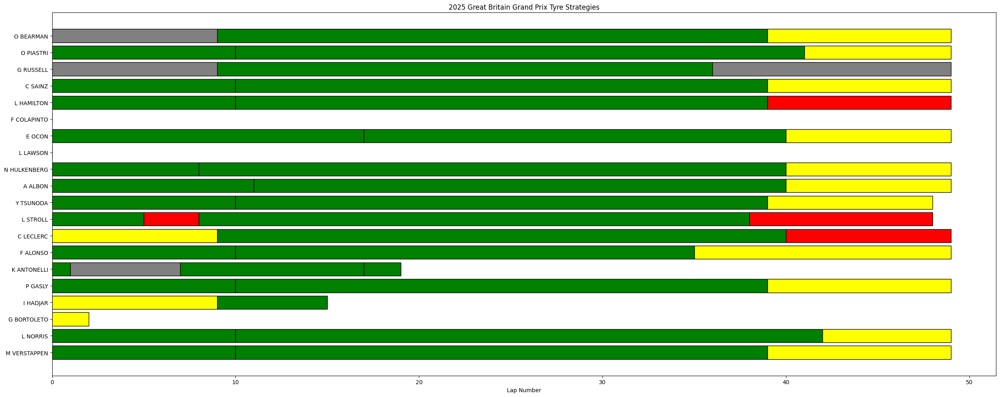

In [150]:
libraryDataF1.race_strategies("2025 Great Britain Grand Prix Tyre Strategies",drivers,stintInformation)

### Lap Time Distributions

/home/frank/Escritorio/F1_backup/F1_notebooks/F1_25/F1_library/libraryF1dataNotebook.py:576: UserWarning:

The palette list has more values (20) than needed (17), which may not be intended.



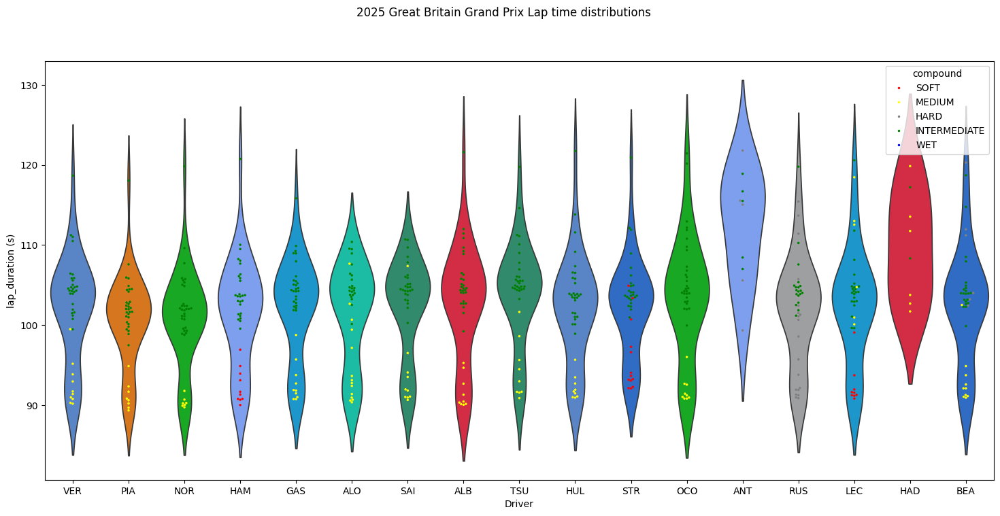

In [153]:
libraryDataF1.lap_time_distributions("2025 Great Britain Grand Prix Lap time distributions",drivers,jointables.query("lap_duration<122"))

### Mean pace with the different compound used on the session

In [60]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").groupby("compound")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
compound,
MEDIUM,91.584333
HARD,91.767625
SOFT,92.167520


### Speed trap

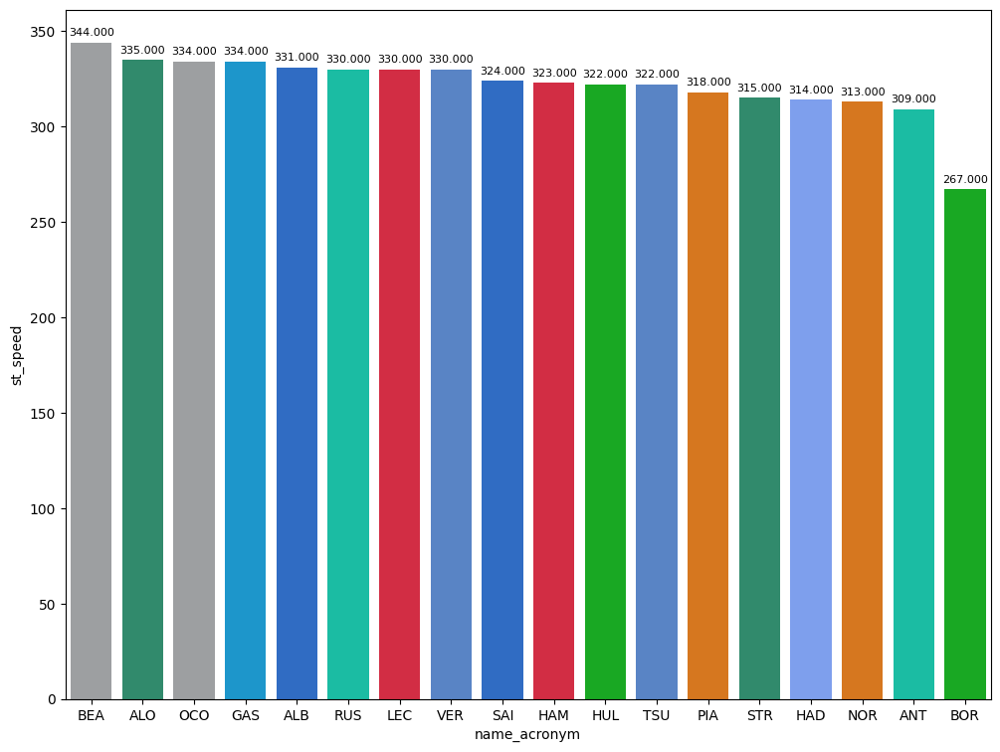

In [61]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['st_speed'].idxmax()].sort_values(by=['st_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","st_speed",top_speed)

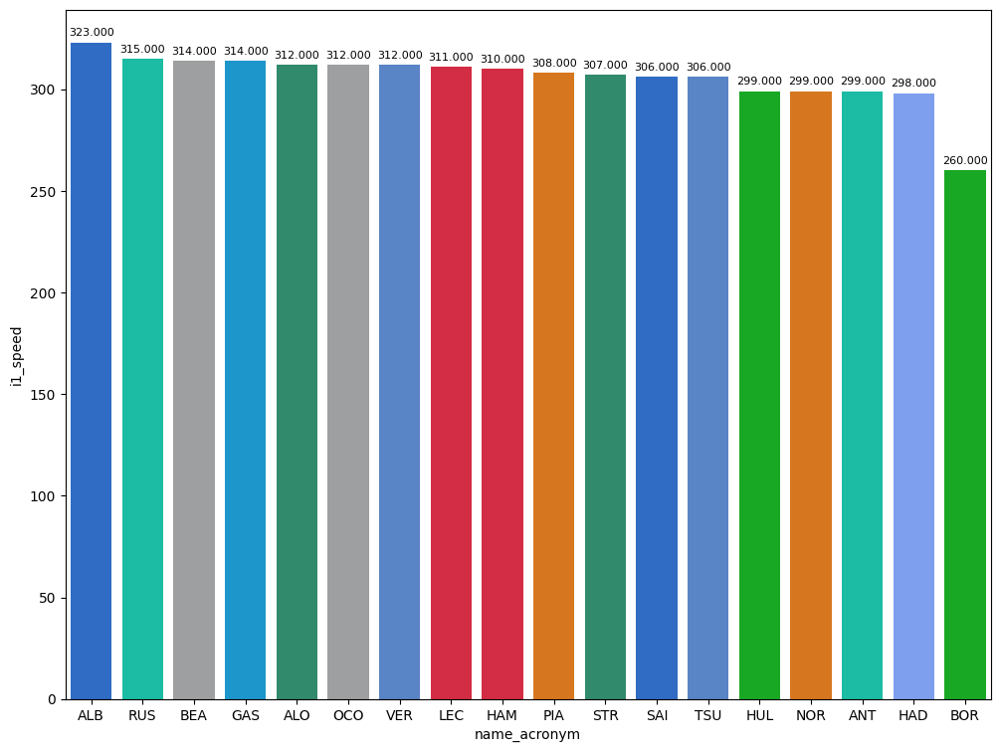

In [62]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i1_speed'].idxmax()].sort_values(by=['i1_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i1_speed",top_speed)

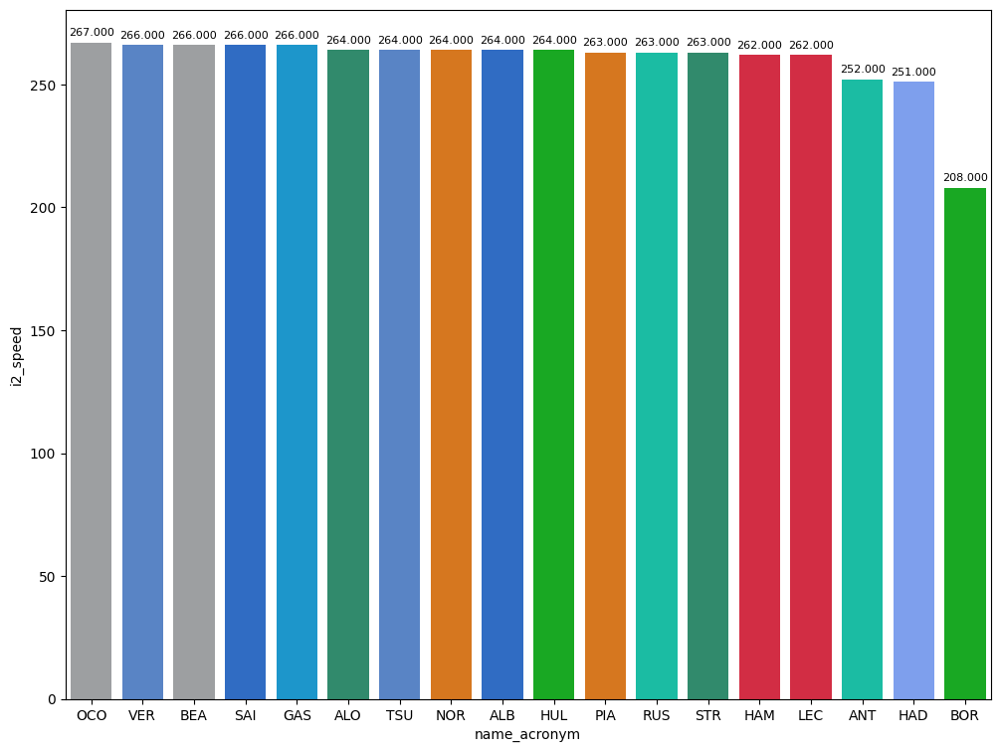

In [63]:
top_speed = jointables.loc[jointables.groupby(['name_acronym'])['i2_speed'].idxmax()].sort_values(by=['i2_speed'],ascending=False)
libraryDataF1.obtainchart("name_acronym","i2_speed",top_speed)

### Race pace

In [68]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['lap_duration'].mean().sort_values(ascending=True))
race_pace

,lap_duration
team_name,
McLaren,90.973538
Ferrari,91.549615
Williams,91.550938
Kick Sauber,91.644667
Mercedes,91.767625
Alpine,91.768000
Haas F1 Team,91.886714
Red Bull Racing,91.944917
Aston Martin,92.544077


#### Mean race pace per sector
In this section, we can see the pace shown per each team in each sector sorted ascending.

#### Sector 1

In [69]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_1'].mean().sort_values(ascending=True))
race_pace

,duration_sector_1
team_name,
McLaren,29.080000
Mercedes,29.158500
Williams,29.196375
Haas F1 Team,29.271786
Red Bull Racing,29.301250
Ferrari,29.455000
Kick Sauber,29.517500
Alpine,29.549875
Aston Martin,29.605308


#### Sector 2

In [70]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_2'].mean().sort_values(ascending=True))
race_pace

,duration_sector_2
team_name,
McLaren,37.265615
Kick Sauber,37.324500
Ferrari,37.330846
Alpine,37.451875
Haas F1 Team,37.604000
Williams,37.625813
Mercedes,37.639875
Red Bull Racing,37.673667
Aston Martin,37.924231


#### Sector 3

In [71]:
race_pace = pd.DataFrame(jointables.query("is_pit_out_lap == False  and lap_duration <= 95").dropna().groupby("team_name")['duration_sector_3'].mean().sort_values(ascending=True))
race_pace

,duration_sector_3
team_name,
McLaren,24.627923
Williams,24.728750
Ferrari,24.763769
Alpine,24.766250
Kick Sauber,24.802667
Mercedes,24.969250
Red Bull Racing,24.970000
Haas F1 Team,25.010929
Aston Martin,25.014538


### Long runs

In [225]:
MINIMUN_SECONDS = 89
MAXIMUM_SECONDS = 120

#### Red Bull Racing

In [226]:
stintInformation.query('driver_number == 1 or driver_number == 22')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
10,1277,9947,1,1,1,11,INTERMEDIATE,0
14,1277,9947,1,22,1,11,INTERMEDIATE,0
30,1277,9947,2,1,12,41,INTERMEDIATE,0
32,1277,9947,2,22,12,41,INTERMEDIATE,0
42,1277,9947,3,22,42,51,MEDIUM,0
43,1277,9947,3,1,42,52,MEDIUM,0


In [227]:
data = libraryDataF1.getinfolongruns(jointables,1,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
53,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:10:08.854000+00:00,4,36.223,40.712,28.633,105.568
70,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:11:54.438000+00:00,5,31.996,43.110,29.703,104.809
120,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:18:01.513000+00:00,8,32.223,43.021,30.590,105.834
138,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:19:47.387000+00:00,9,32.688,43.578,30.060,106.326
155,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:21:33.630000+00:00,10,32.657,44.139,29.636,106.432
170,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:23:20.081000+00:00,11,33.168,49.265,28.064,110.497
191,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:27:17.400000+00:00,13,33.824,47.545,29.855,111.224
275,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:39:44.574000+00:00,18,35.472,45.892,37.301,118.665
345,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:49:53.735000+00:00,22,36.073,45.732,29.213,111.018
361,Max VERSTAPPEN,INTERMEDIATE,2025-07-06T14:51:44.748000+00:00,23,33.293,43.941,28.629,105.863


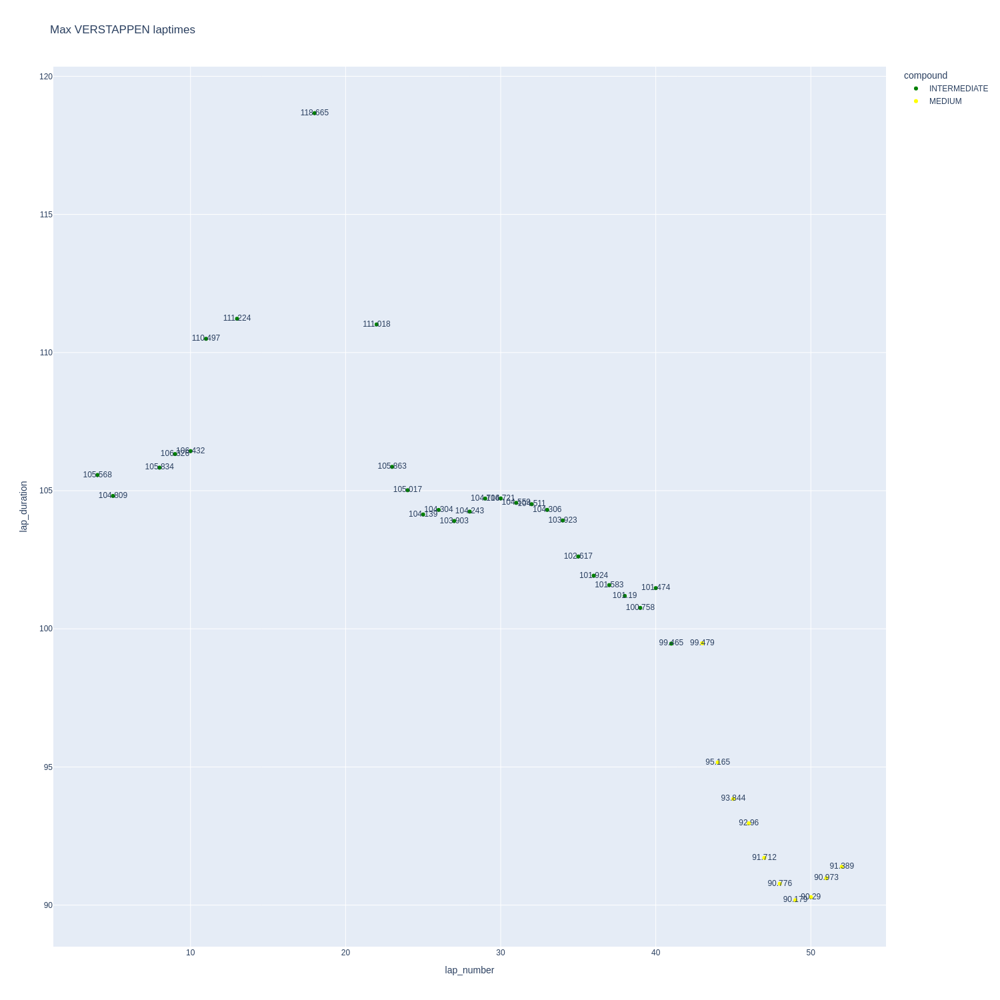

In [228]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

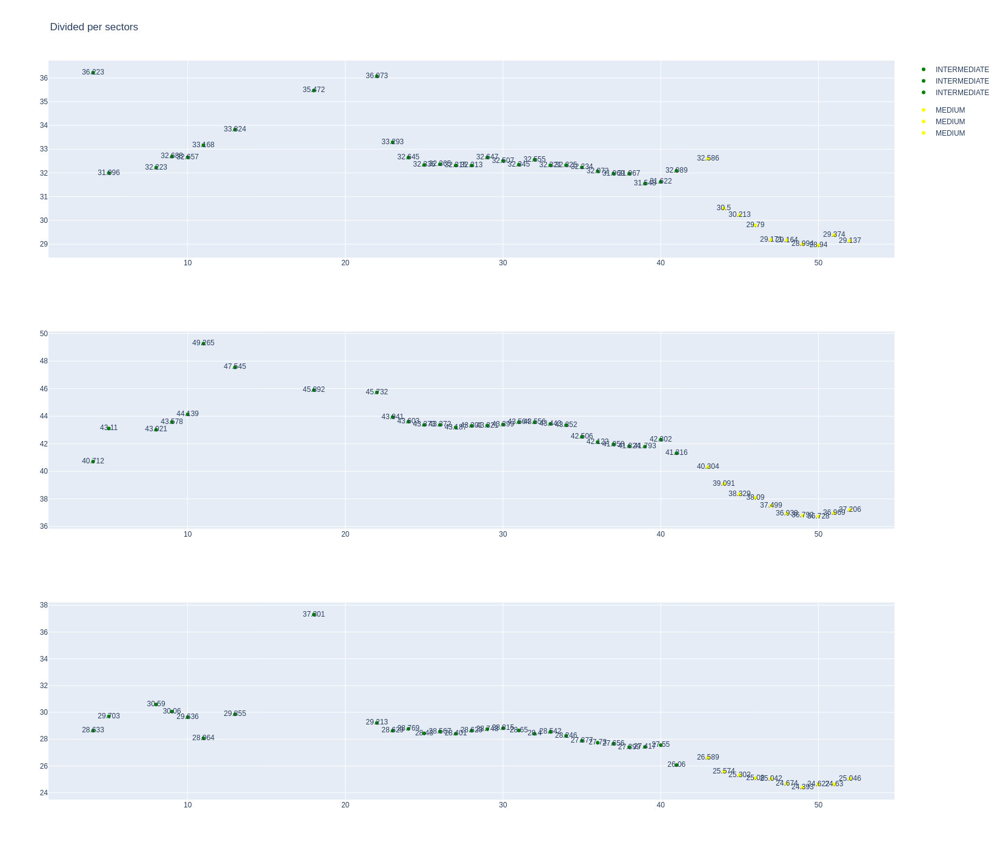

In [229]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [230]:
data = libraryDataF1.getinfolongruns(jointables,22,'Red Bull Racing',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
61,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:10:18.350000+00:00,4,34.142,42.779,29.137,106.058
78,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:12:04.487000+00:00,5,32.432,43.490,35.184,111.106
128,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:18:13.358000+00:00,8,32.643,44.022,30.292,106.957
145,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:20:00.353000+00:00,9,33.264,44.752,30.984,109.000
162,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:21:49.276000+00:00,10,33.442,45.635,31.006,110.083
177,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:23:39.378000+00:00,11,34.841,48.637,27.767,111.245
201,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:27:39.058000+00:00,13,34.444,48.568,36.750,119.762
348,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:49:54.929000+00:00,22,36.419,48.110,30.089,114.618
365,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:51:49.591000+00:00,23,33.964,44.983,28.837,107.784
381,Yuki TSUNODA,INTERMEDIATE,2025-07-06T14:53:37.305000+00:00,24,32.739,43.716,29.012,105.467


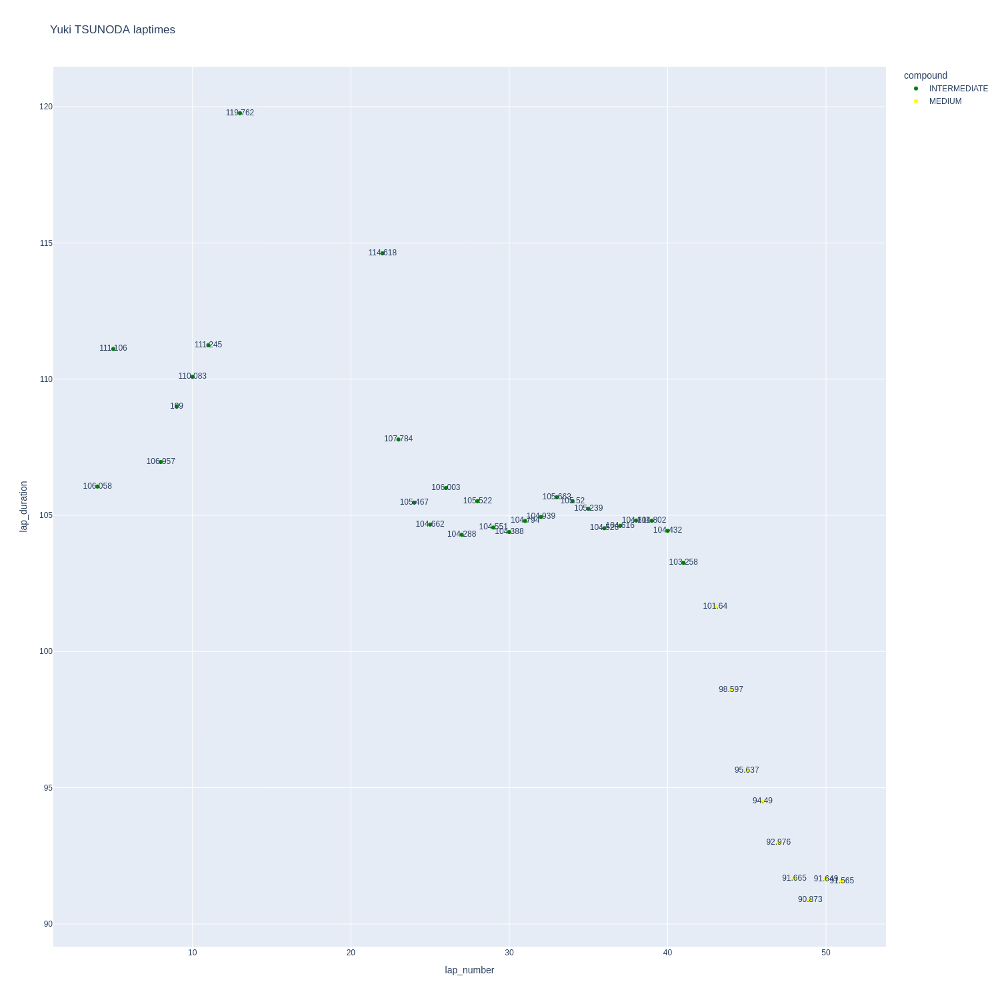

In [231]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

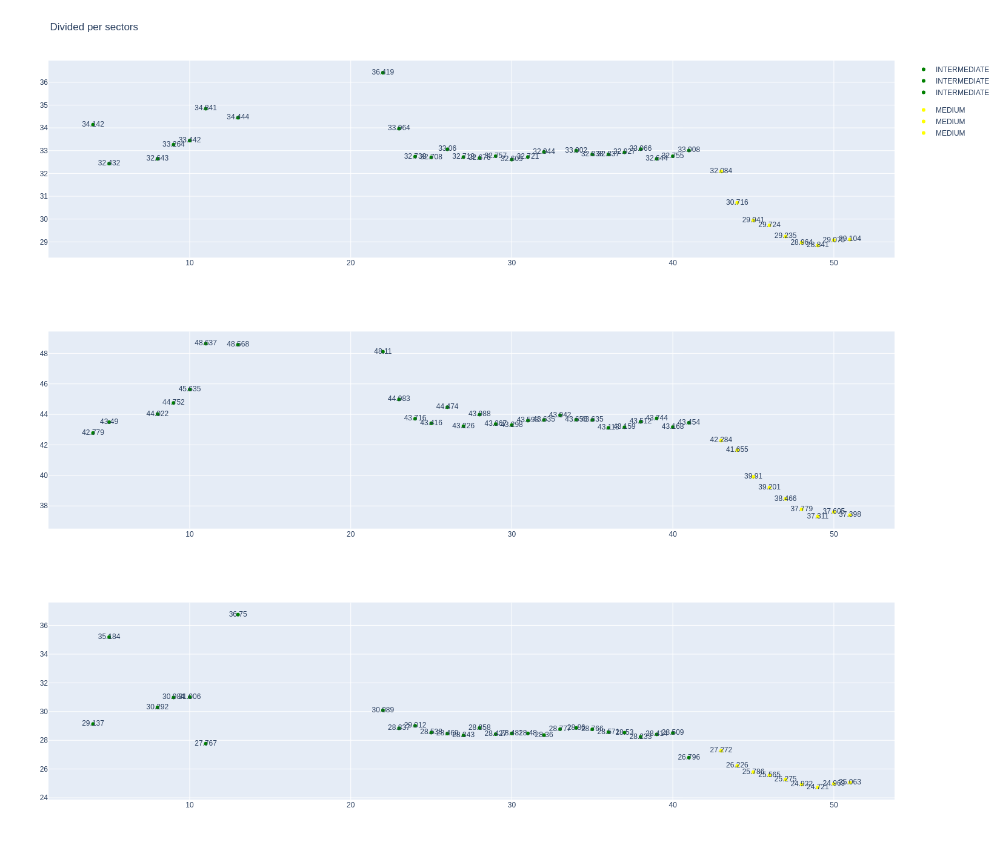

In [232]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Ferrari

In [233]:
stintInformation.query('driver_number == 44 or driver_number == 16')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
7,1277,9947,1,16,1,10,MEDIUM,0
15,1277,9947,1,44,1,11,INTERMEDIATE,0
28,1277,9947,2,16,11,42,INTERMEDIATE,0
33,1277,9947,2,44,12,41,INTERMEDIATE,0
45,1277,9947,3,44,42,52,SOFT,3
49,1277,9947,3,16,43,52,SOFT,3


In [234]:
data = libraryDataF1.getinfolongruns(jointables,16,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
67,Charles LECLERC,MEDIUM,2025-07-06T14:10:35.672000+00:00,4,37.560,42.616,32.817,112.993
84,Charles LECLERC,MEDIUM,2025-07-06T14:12:28.772000+00:00,5,35.369,45.467,37.622,118.458
117,Charles LECLERC,MEDIUM,2025-07-06T14:16:45.021000+00:00,7,40.420,40.352,31.770,112.542
134,Charles LECLERC,MEDIUM,2025-07-06T14:18:37.652000+00:00,8,32.950,39.590,32.190,104.730
151,Charles LECLERC,MEDIUM,2025-07-06T14:20:22.322000+00:00,9,32.265,39.013,29.663,100.941
166,Charles LECLERC,MEDIUM,2025-07-06T14:22:03.323000+00:00,10,31.426,41.038,27.628,100.092
186,Charles LECLERC,INTERMEDIATE,2025-07-06T14:25:52.050000+00:00,12,33.873,44.628,29.641,108.142
347,Charles LECLERC,INTERMEDIATE,2025-07-06T14:49:54.601000+00:00,22,35.869,46.226,29.696,111.791
363,Charles LECLERC,INTERMEDIATE,2025-07-06T14:51:46.466000+00:00,23,33.438,43.916,28.937,106.291
379,Charles LECLERC,INTERMEDIATE,2025-07-06T14:53:32.804000+00:00,24,33.081,43.247,28.493,104.821


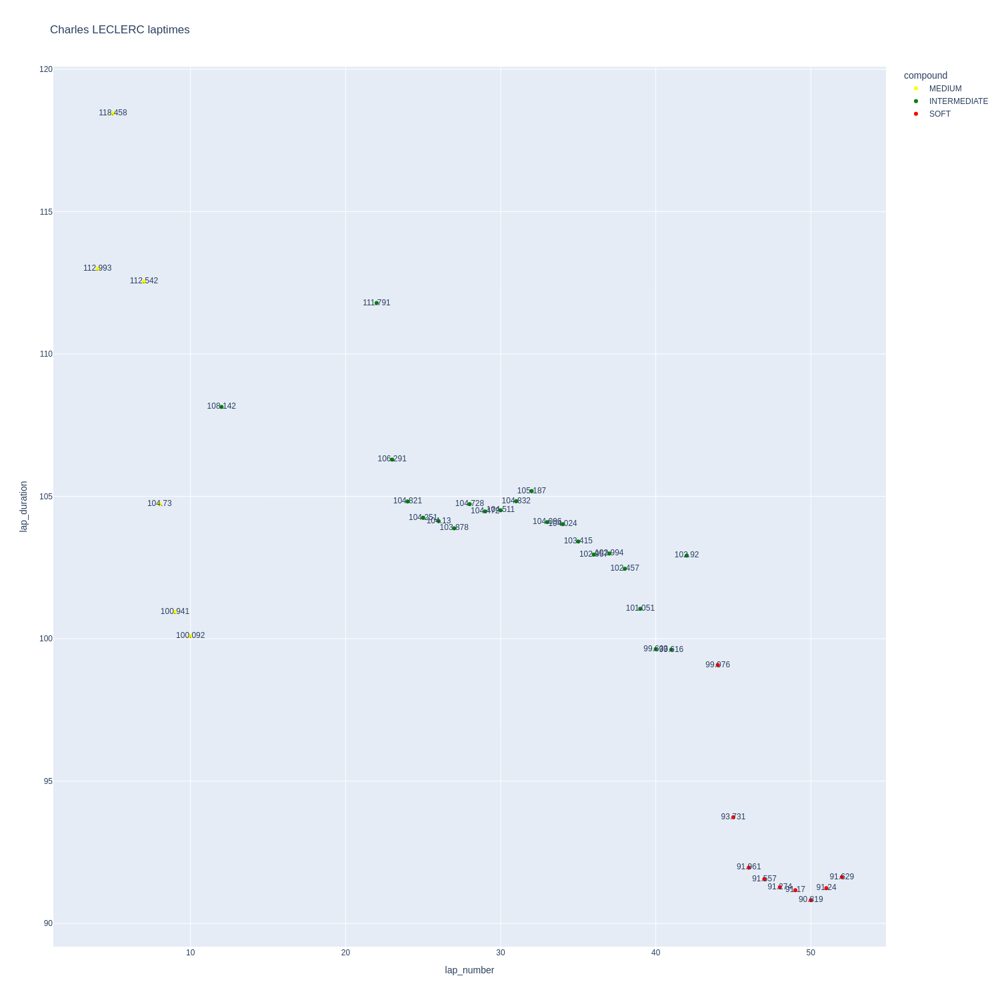

In [235]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

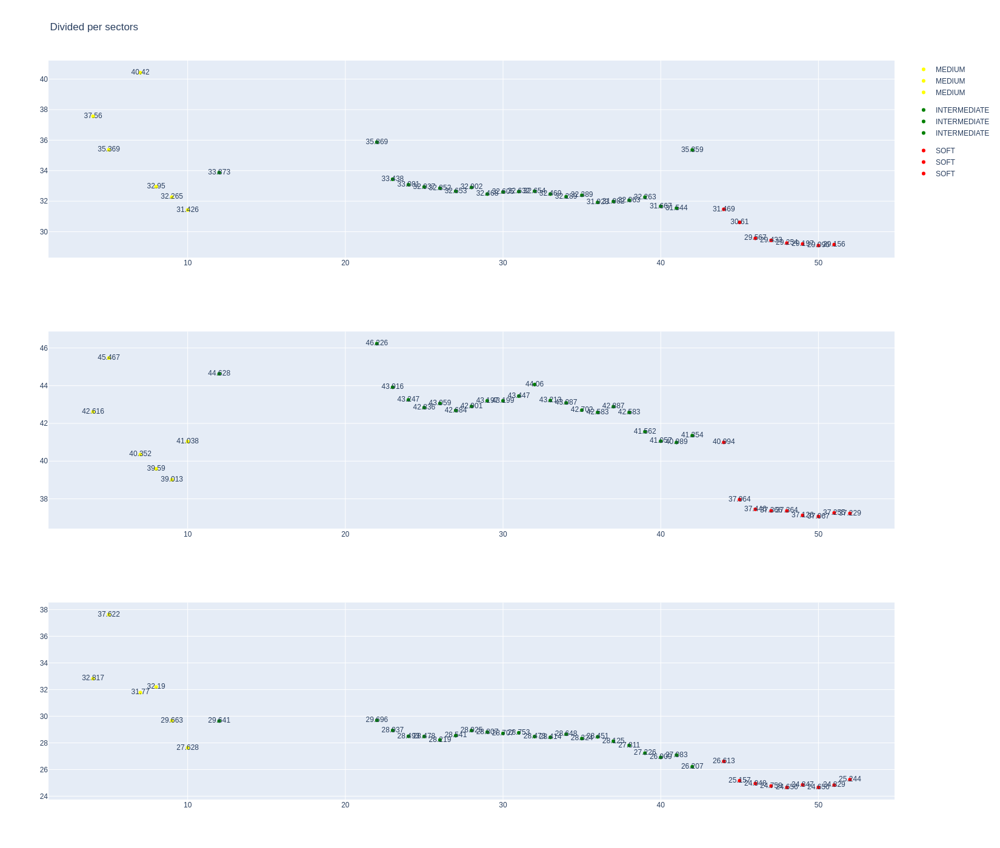

In [236]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [237]:
data = libraryDataF1.getinfolongruns(jointables,44,'Ferrari',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
56,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:10:12.751000+00:00,4,35.675,41.582,29.076,106.333
73,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:11:59.164000+00:00,5,32.173,42.898,32.606,107.677
123,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:18:07.526000+00:00,8,32.457,43.174,30.471,106.102
140,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:19:53.697000+00:00,9,33.149,44.203,30.697,108.049
157,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:21:41.785000+00:00,10,32.745,44.528,30.969,108.242
172,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:23:29.999000+00:00,11,33.469,48.256,27.759,109.484
341,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:49:51.069000+00:00,22,35.413,45.486,29.127,110.026
357,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:51:41.029000+00:00,23,33.136,43.544,28.838,105.518
373,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:53:26.622000+00:00,24,32.664,44.641,28.548,105.853
389,Lewis HAMILTON,INTERMEDIATE,2025-07-06T14:55:12.487000+00:00,25,32.092,43.236,28.392,103.720


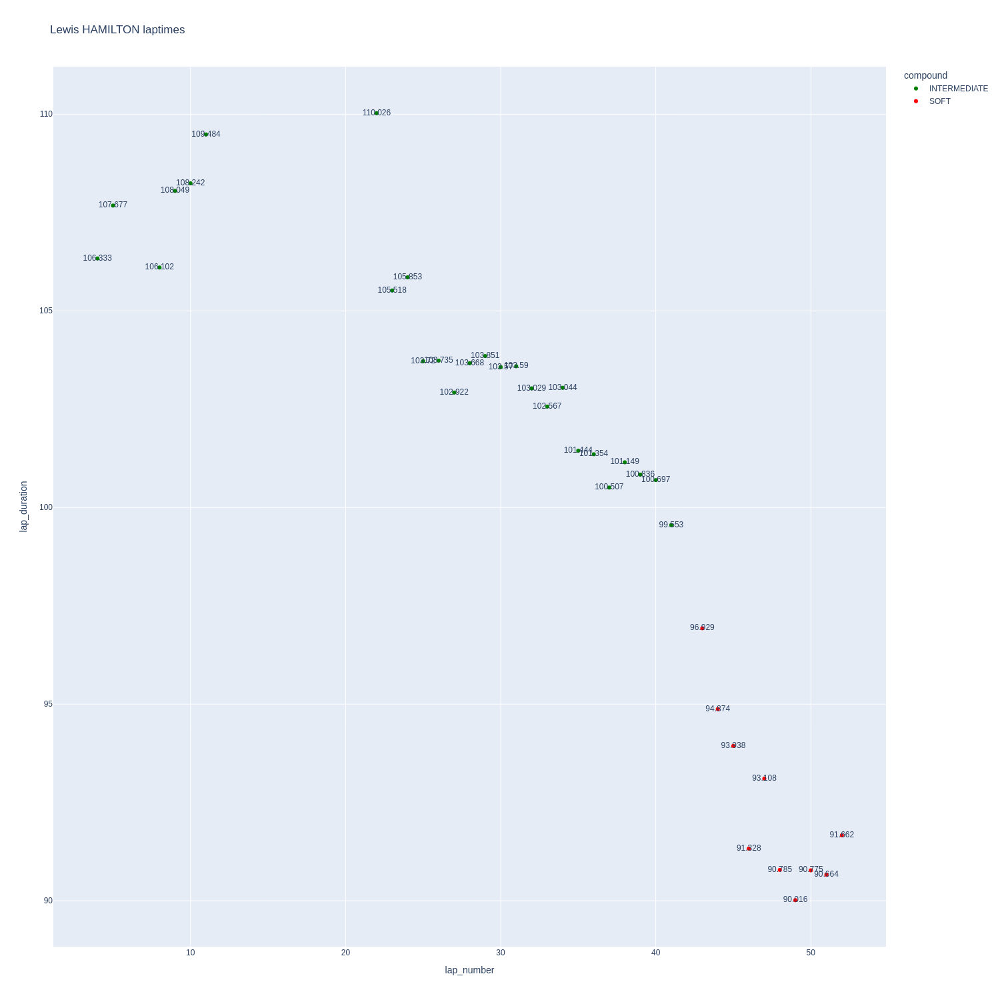

In [238]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

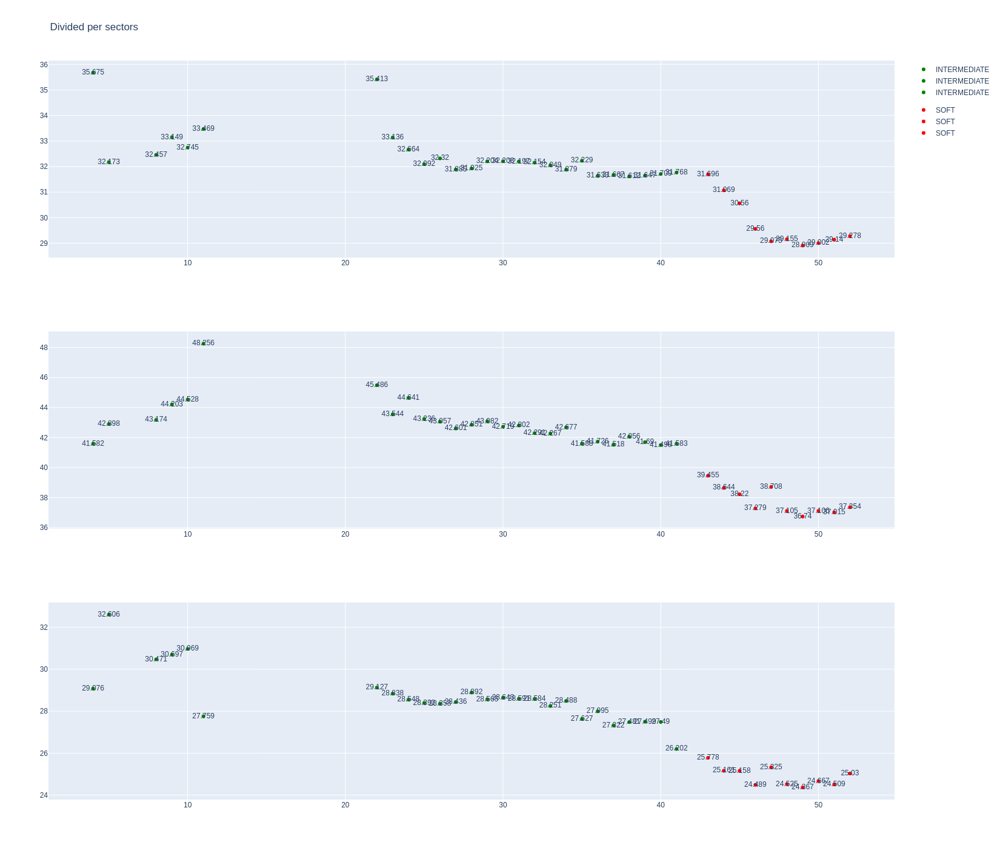

In [239]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Mercedes

In [240]:
stintInformation.query('driver_number == 12 or driver_number == 63')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
2,1277,9947,1,12,1,2,INTERMEDIATE,0
8,1277,9947,1,63,1,10,HARD,0
20,1277,9947,2,12,3,9,HARD,0
22,1277,9947,3,12,10,20,INTERMEDIATE,0
25,1277,9947,2,63,11,38,INTERMEDIATE,0
39,1277,9947,4,12,21,23,INTERMEDIATE,0
41,1277,9947,3,63,39,52,HARD,0


In [241]:
data = libraryDataF1.getinfolongruns(jointables,12,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
65,Kimi ANTONELLI,HARD,2025-07-06T14:10:28.426000+00:00,4,37.597,44.156,33.282,115.035
116,Kimi ANTONELLI,HARD,2025-07-06T14:16:40.996000+00:00,7,41.806,41.210,32.520,115.536
133,Kimi ANTONELLI,HARD,2025-07-06T14:18:36.524000+00:00,8,33.574,39.634,32.368,105.576
150,Kimi ANTONELLI,HARD,2025-07-06T14:20:22.182000+00:00,9,32.350,38.922,28.064,99.336
180,Kimi ANTONELLI,INTERMEDIATE,2025-07-06T14:24:07.426000+00:00,11,33.719,44.749,29.971,108.439
187,Kimi ANTONELLI,INTERMEDIATE,2025-07-06T14:25:55.847000+00:00,12,33.207,44.121,29.681,107.009
203,Kimi ANTONELLI,INTERMEDIATE,2025-07-06T14:27:42.811000+00:00,13,34.008,48.200,36.690,118.898
351,Kimi ANTONELLI,INTERMEDIATE,2025-07-06T14:49:56.963000+00:00,22,36.270,48.886,30.345,115.501
367,Kimi ANTONELLI,INTERMEDIATE,2025-07-06T14:51:52.404000+00:00,23,37.944,48.402,30.354,116.700


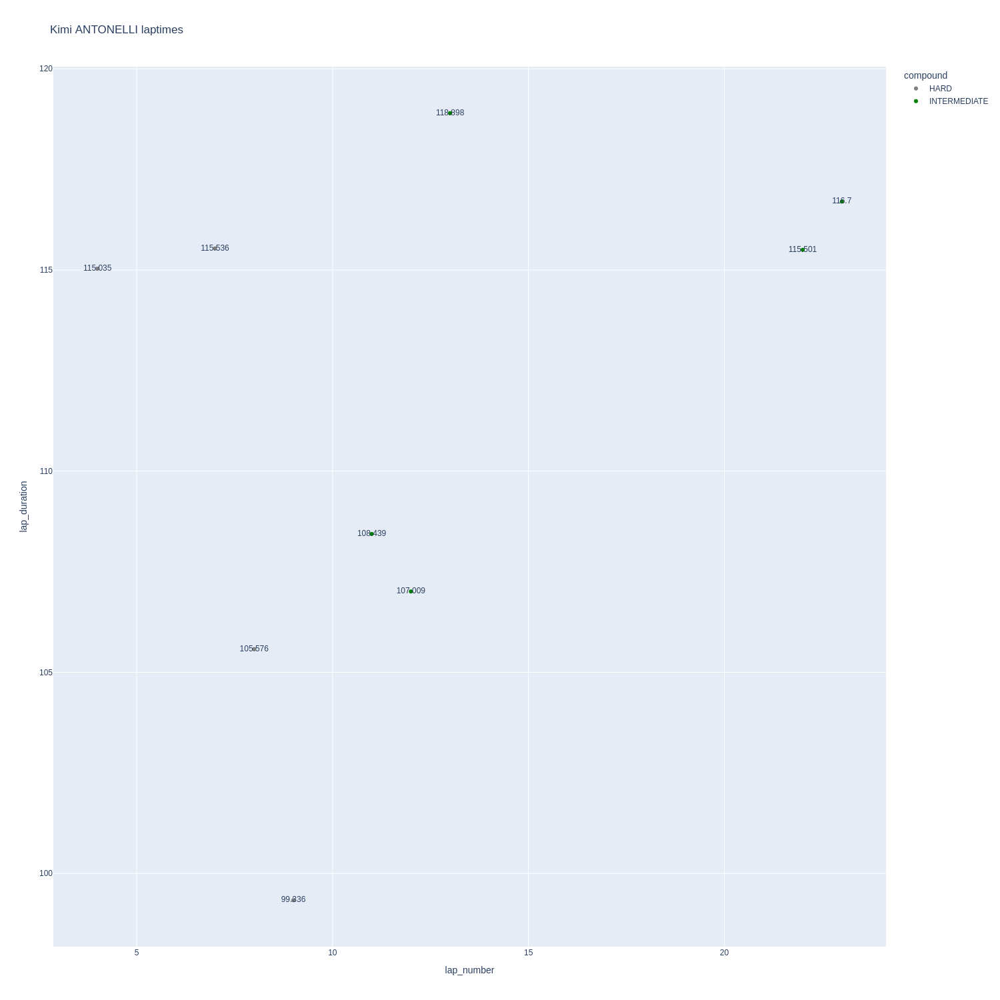

In [242]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

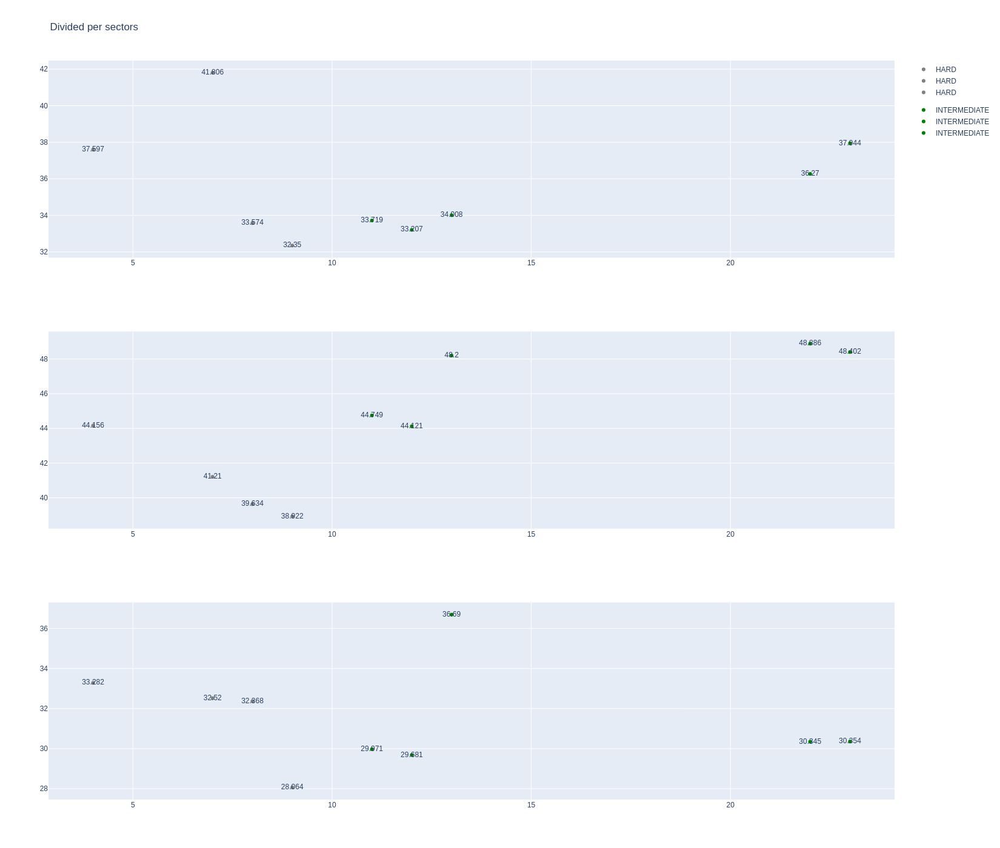

In [243]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [244]:
data = libraryDataF1.getinfolongruns(jointables,63,'Mercedes',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
66,George RUSSELL,HARD,2025-07-06T14:10:34.040000+00:00,4,35.919,42.781,32.718,111.418
83,George RUSSELL,HARD,2025-07-06T14:12:25.321000+00:00,5,34.224,41.657,39.544,115.425
115,George RUSSELL,HARD,2025-07-06T14:16:38.226000+00:00,7,42.931,39.775,30.969,113.675
132,George RUSSELL,HARD,2025-07-06T14:18:32.008000+00:00,8,31.912,38.915,30.460,101.287
149,George RUSSELL,HARD,2025-07-06T14:20:13.260000+00:00,9,31.324,38.957,31.222,101.503
165,George RUSSELL,HARD,2025-07-06T14:21:54.703000+00:00,10,31.628,42.290,28.499,102.417
185,George RUSSELL,INTERMEDIATE,2025-07-06T14:25:42.065000+00:00,12,32.830,45.089,29.652,107.571
199,George RUSSELL,INTERMEDIATE,2025-07-06T14:27:29.517000+00:00,13,34.099,48.515,37.165,119.779
342,George RUSSELL,INTERMEDIATE,2025-07-06T14:49:51.522000+00:00,22,35.346,45.805,29.100,110.251
358,George RUSSELL,INTERMEDIATE,2025-07-06T14:51:41.810000+00:00,23,32.932,43.933,28.505,105.370


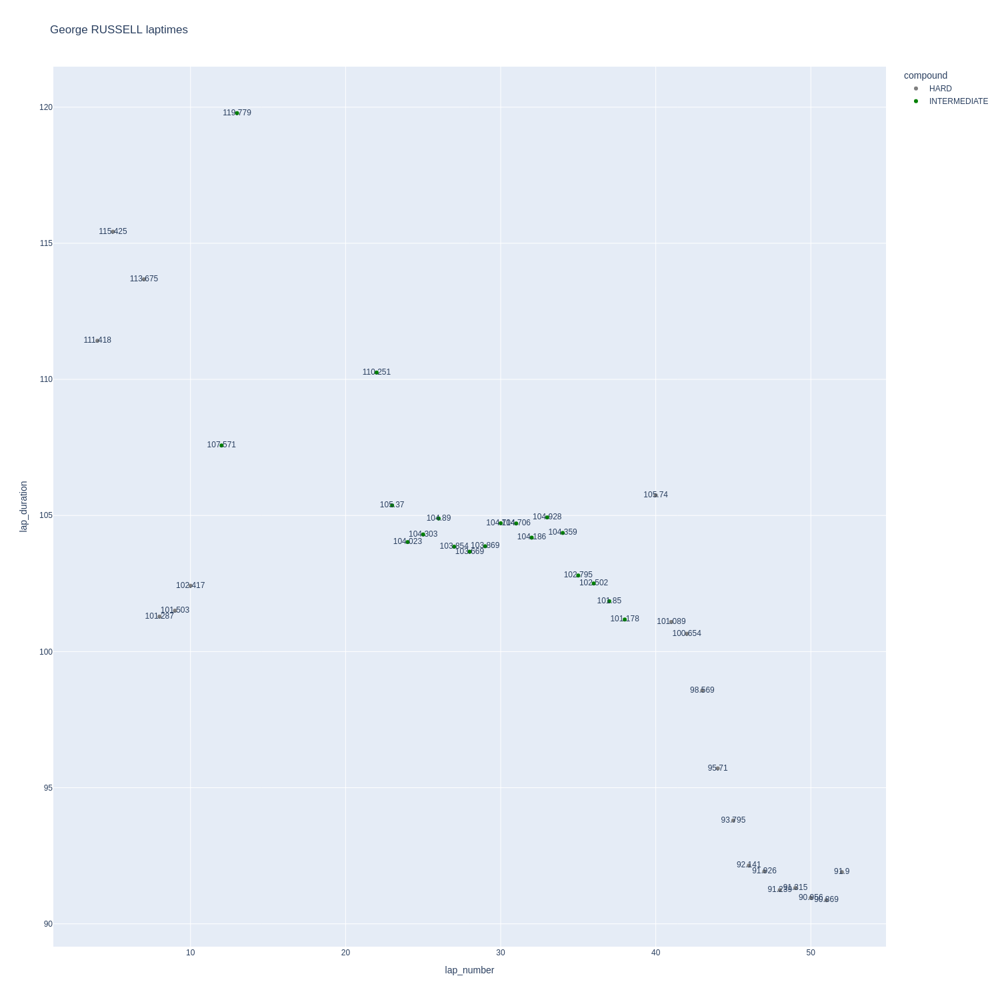

In [245]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

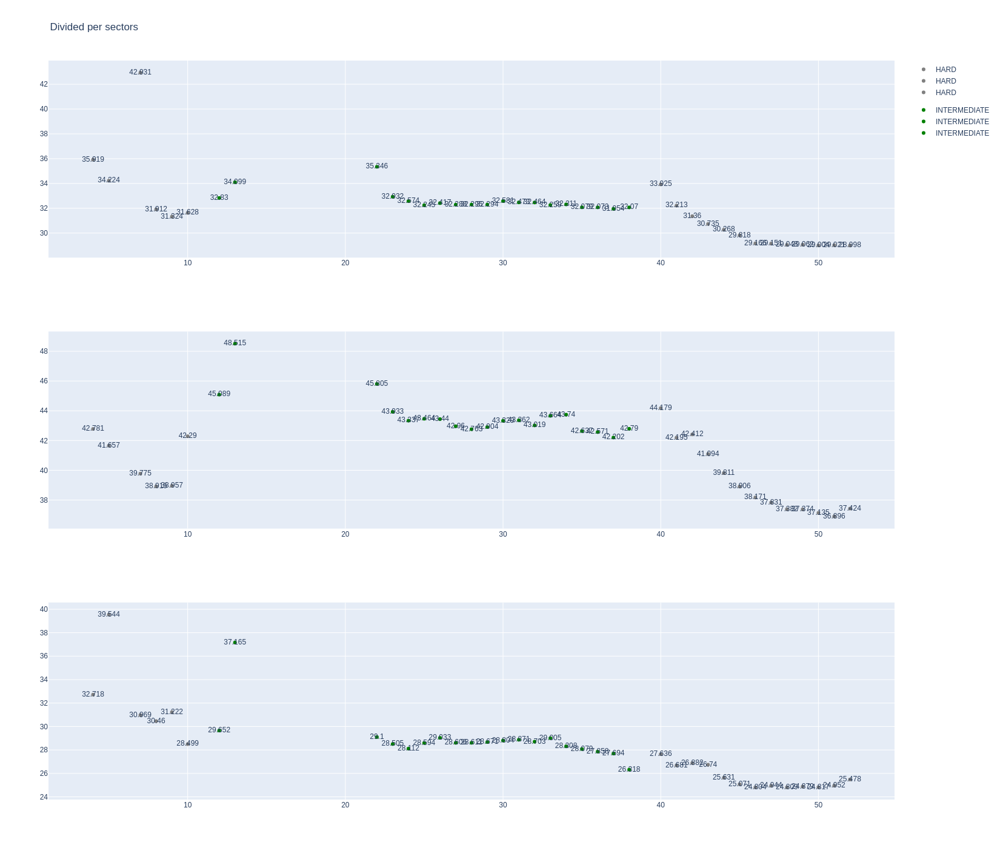

In [246]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### McLaren

In [247]:
stintInformation.query('driver_number == 81 or driver_number == 4')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
11,1277,9947,1,4,1,11,INTERMEDIATE,0
17,1277,9947,1,81,1,11,INTERMEDIATE,0
35,1277,9947,2,81,12,43,INTERMEDIATE,0
36,1277,9947,2,4,12,44,INTERMEDIATE,0
53,1277,9947,3,81,44,52,MEDIUM,0
54,1277,9947,3,4,45,52,MEDIUM,0


In [248]:
data = libraryDataF1.getinfolongruns(jointables,4,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
55,Lando NORRIS,INTERMEDIATE,2025-07-06T14:10:11.977000+00:00,4,35.715,41.225,28.811,105.751
72,Lando NORRIS,INTERMEDIATE,2025-07-06T14:11:57.693000+00:00,5,32.084,42.984,29.965,105.033
122,Lando NORRIS,INTERMEDIATE,2025-07-06T14:18:05.325000+00:00,8,32.657,42.786,29.426,104.869
139,Lando NORRIS,INTERMEDIATE,2025-07-06T14:19:50.097000+00:00,9,32.526,43.325,29.744,105.595
156,Lando NORRIS,INTERMEDIATE,2025-07-06T14:21:35.661000+00:00,10,32.396,43.819,29.642,105.857
171,Lando NORRIS,INTERMEDIATE,2025-07-06T14:23:21.503000+00:00,11,32.917,47.442,27.376,107.735
192,Lando NORRIS,INTERMEDIATE,2025-07-06T14:27:19.674000+00:00,13,33.267,46.498,29.840,109.605
276,Lando NORRIS,INTERMEDIATE,2025-07-06T14:39:45.496000+00:00,18,36.625,45.735,37.464,119.824
337,Lando NORRIS,INTERMEDIATE,2025-07-06T14:49:48.429000+00:00,22,33.952,43.261,28.126,105.339
353,Lando NORRIS,INTERMEDIATE,2025-07-06T14:51:33.747000+00:00,23,32.364,42.160,27.859,102.383


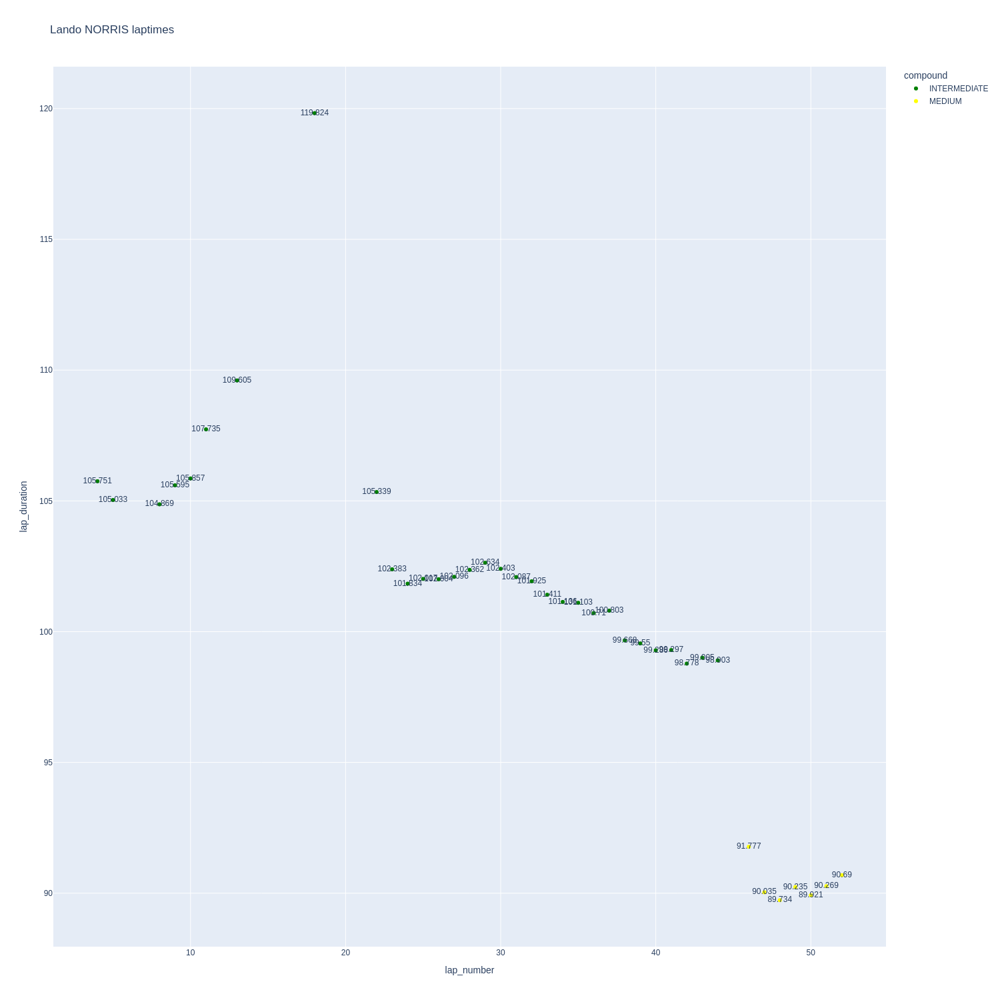

In [249]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

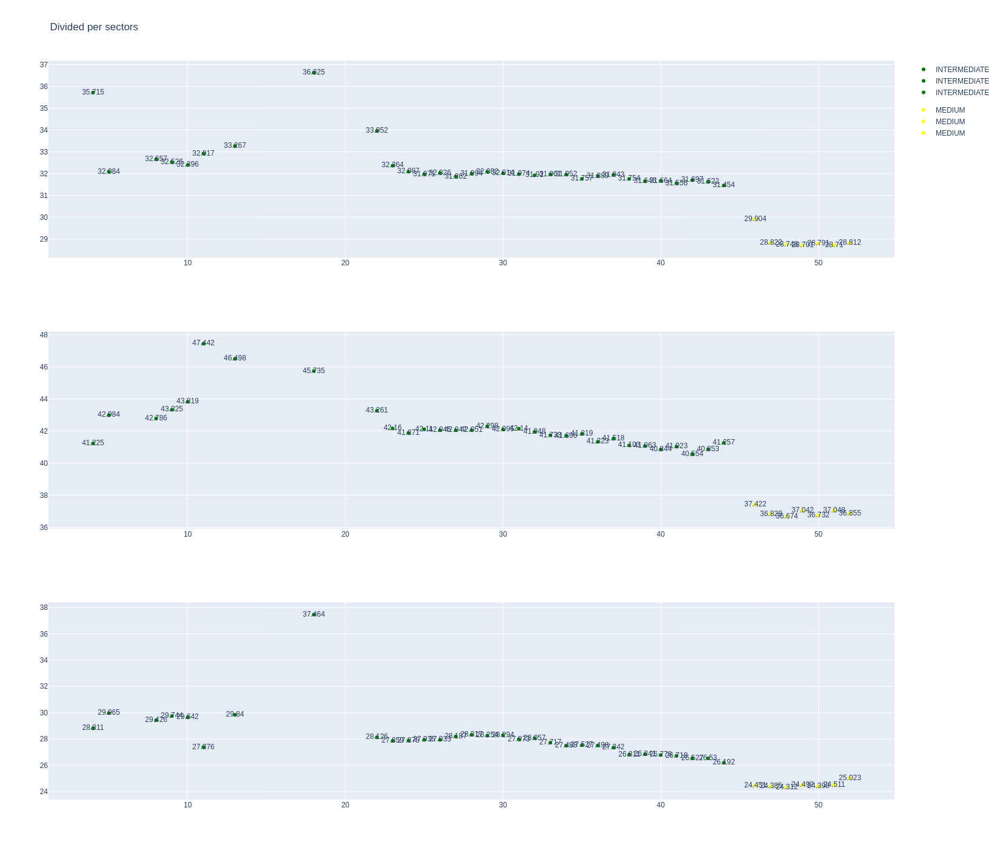

In [250]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [251]:
data = libraryDataF1.getinfolongruns(jointables,81,'McLaren',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
54,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:10:09.793000+00:00,4,36.081,40.950,28.797,105.828
71,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:11:55.293000+00:00,5,31.795,42.952,29.708,104.455
121,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:18:02.200000+00:00,8,31.681,43.106,29.384,104.171
137,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:19:46.268000+00:00,9,32.311,42.336,29.746,104.393
154,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:21:30.802000+00:00,10,32.185,43.284,29.421,104.890
169,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:23:15.581000+00:00,11,32.236,46.880,26.821,105.937
190,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:27:07.788000+00:00,13,32.915,45.072,29.598,107.585
274,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:39:43.652000+00:00,18,34.982,44.769,38.292,118.043
336,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:49:45.944000+00:00,22,33.313,42.772,28.409,104.494
352,Oscar PIASTRI,INTERMEDIATE,2025-07-06T14:51:30.482000+00:00,23,32.244,41.849,28.207,102.300


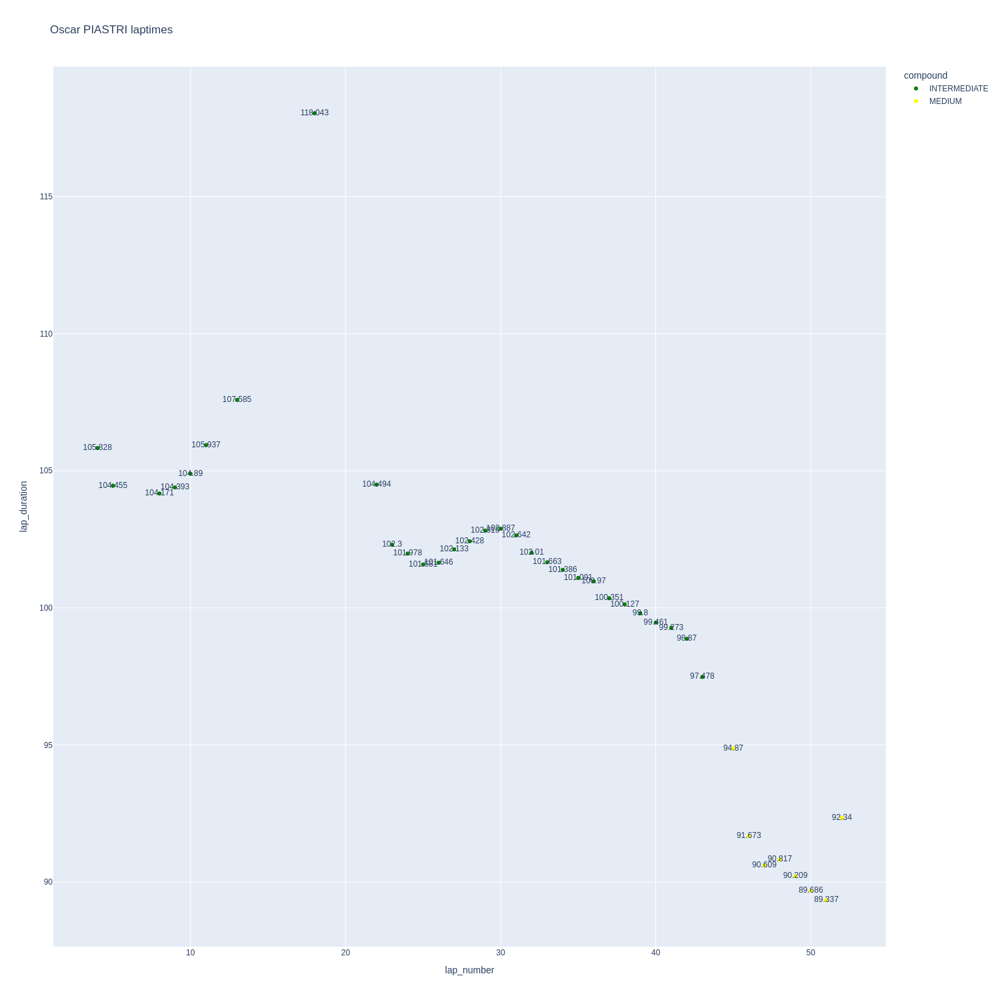

In [252]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

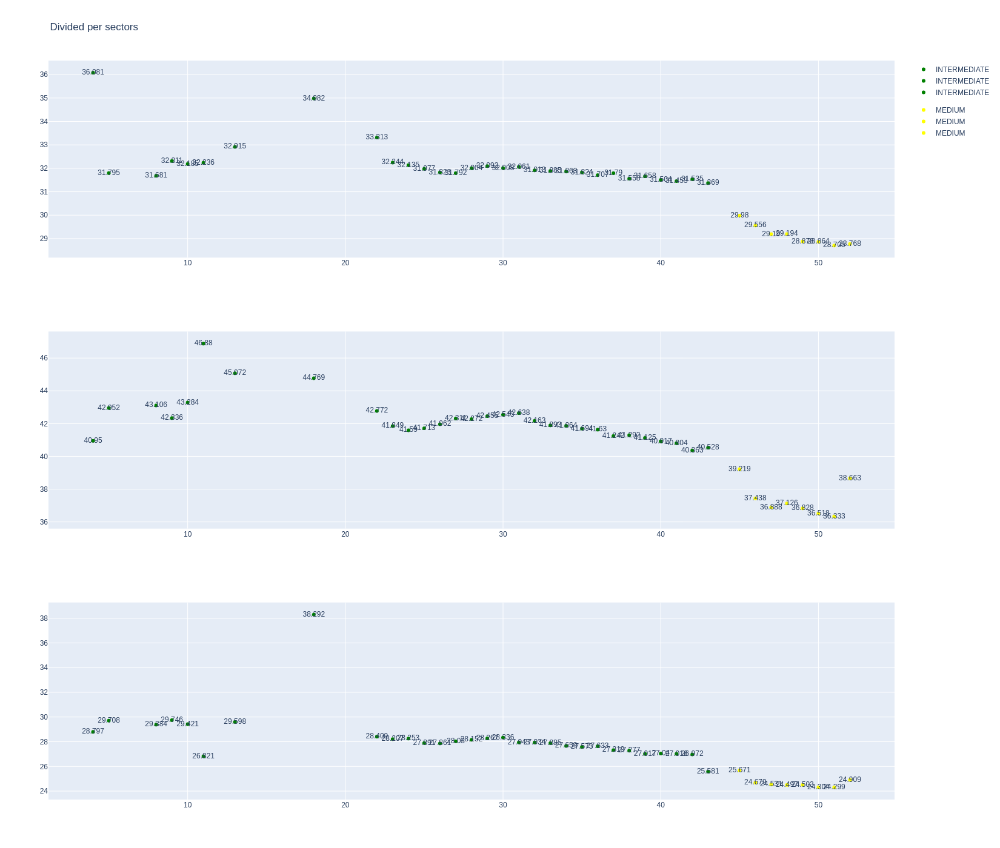

In [253]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Aston Martin

In [254]:
stintInformation.query('driver_number == 18 or driver_number == 14')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
4,1277,9947,1,18,1,6,INTERMEDIATE,0
13,1277,9947,1,14,1,11,INTERMEDIATE,0
21,1277,9947,2,18,7,10,SOFT,0
27,1277,9947,3,18,11,41,INTERMEDIATE,0
29,1277,9947,2,14,12,37,INTERMEDIATE,0
40,1277,9947,3,14,38,52,MEDIUM,1
48,1277,9947,4,18,42,52,SOFT,0


In [255]:
data = libraryDataF1.getinfolongruns(jointables,14,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
58,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:10:15.333000+00:00,4,34.565,41.914,29.199,105.678
75,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:12:01.072000+00:00,5,32.334,43.770,33.432,109.536
125,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:18:09.340000+00:00,8,32.453,43.657,30.310,106.420
142,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:19:55.723000+00:00,9,32.757,44.149,30.663,107.569
159,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:21:43.316000+00:00,10,33.111,45.151,30.689,108.951
174,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:23:32.201000+00:00,11,33.787,47.624,28.067,109.478
343,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:49:52.194000+00:00,22,35.567,45.750,29.071,110.388
359,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:51:42.654000+00:00,23,33.313,44.092,28.804,106.209
375,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:53:28.864000+00:00,24,32.587,43.913,28.379,104.879
390,Fernando ALONSO,INTERMEDIATE,2025-07-06T14:55:13.837000+00:00,25,32.273,43.318,28.567,104.158


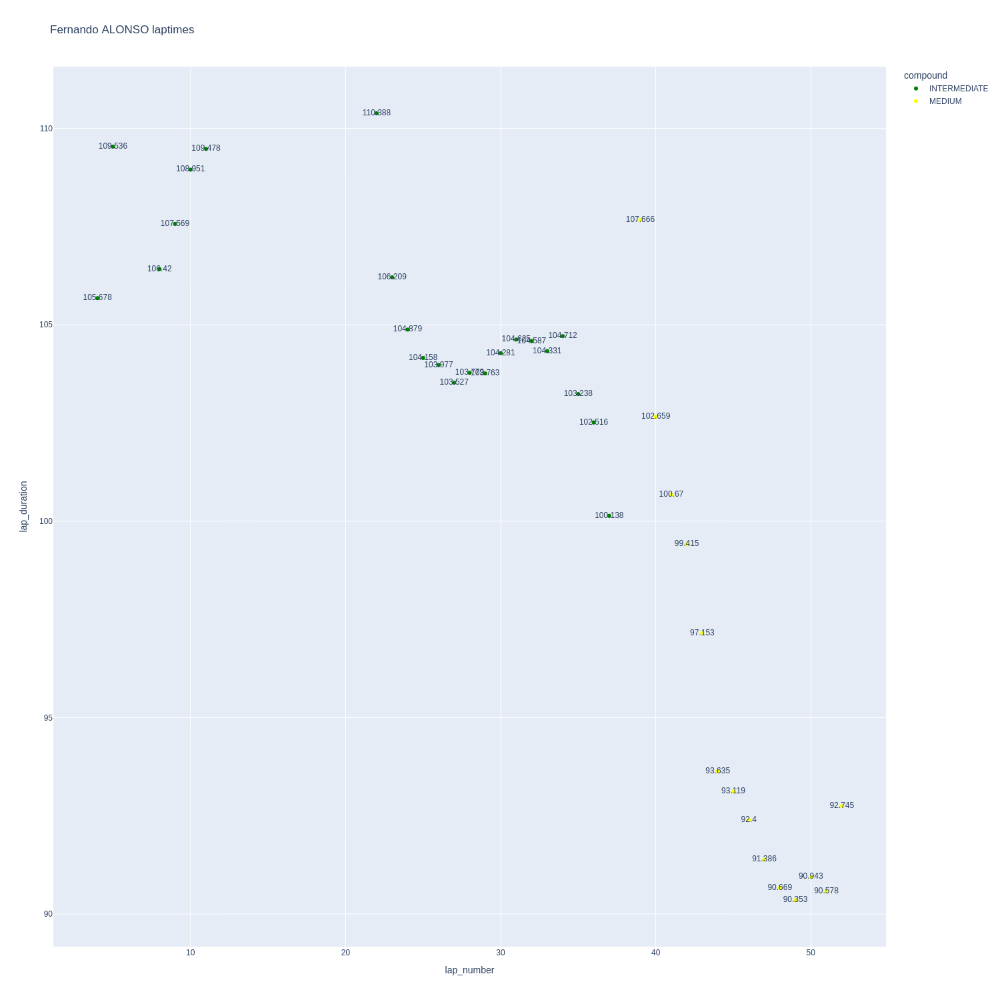

In [256]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

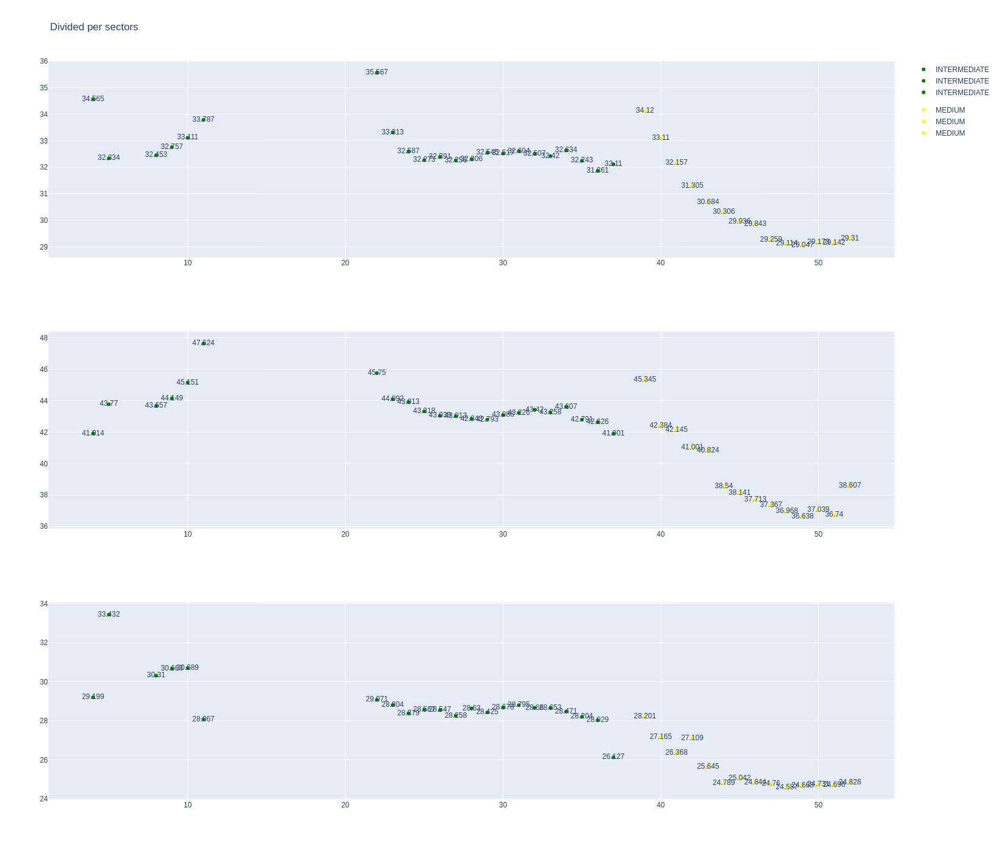

In [257]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [258]:
data = libraryDataF1.getinfolongruns(jointables,18,'Aston Martin',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
63,Lance STROLL,INTERMEDIATE,2025-07-06T14:10:20.070000+00:00,4,34.119,42.518,29.560,106.197
80,Lance STROLL,INTERMEDIATE,2025-07-06T14:12:06.420000+00:00,5,32.552,43.791,35.552,111.895
131,Lance STROLL,SOFT,2025-07-06T14:18:22.173000+00:00,8,32.507,39.439,31.407,103.353
148,Lance STROLL,SOFT,2025-07-06T14:20:05.400000+00:00,9,32.024,41.072,31.816,104.912
163,Lance STROLL,SOFT,2025-07-06T14:21:50.291000+00:00,10,32.535,40.558,27.615,100.708
183,Lance STROLL,INTERMEDIATE,2025-07-06T14:25:37.241000+00:00,12,33.005,45.064,29.085,107.154
193,Lance STROLL,INTERMEDIATE,2025-07-06T14:27:24.656000+00:00,13,35.382,47.079,29.673,112.134
338,Lance STROLL,INTERMEDIATE,2025-07-06T14:49:49.272000+00:00,22,35.206,45.010,28.729,108.945
354,Lance STROLL,INTERMEDIATE,2025-07-06T14:51:38.388000+00:00,23,33.210,43.659,28.089,104.958
370,Lance STROLL,INTERMEDIATE,2025-07-06T14:53:23.158000+00:00,24,32.676,42.831,28.166,103.673


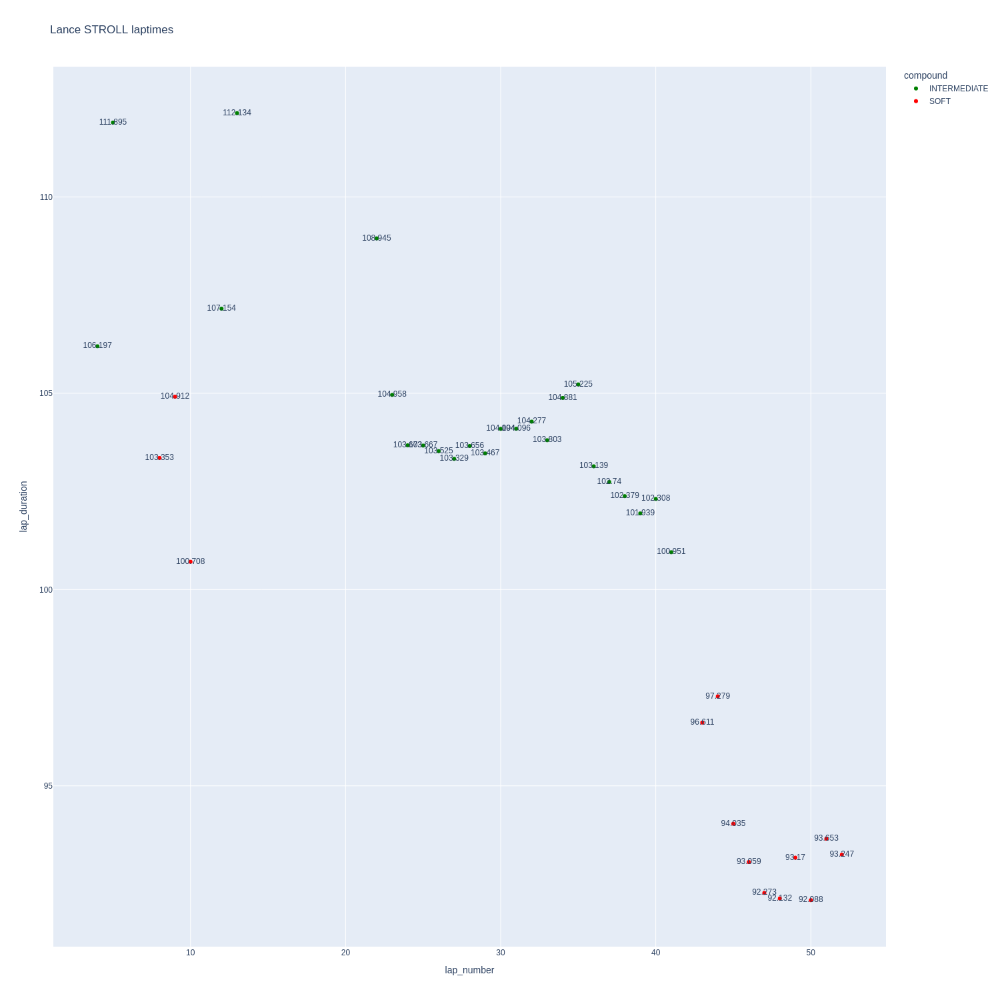

In [259]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

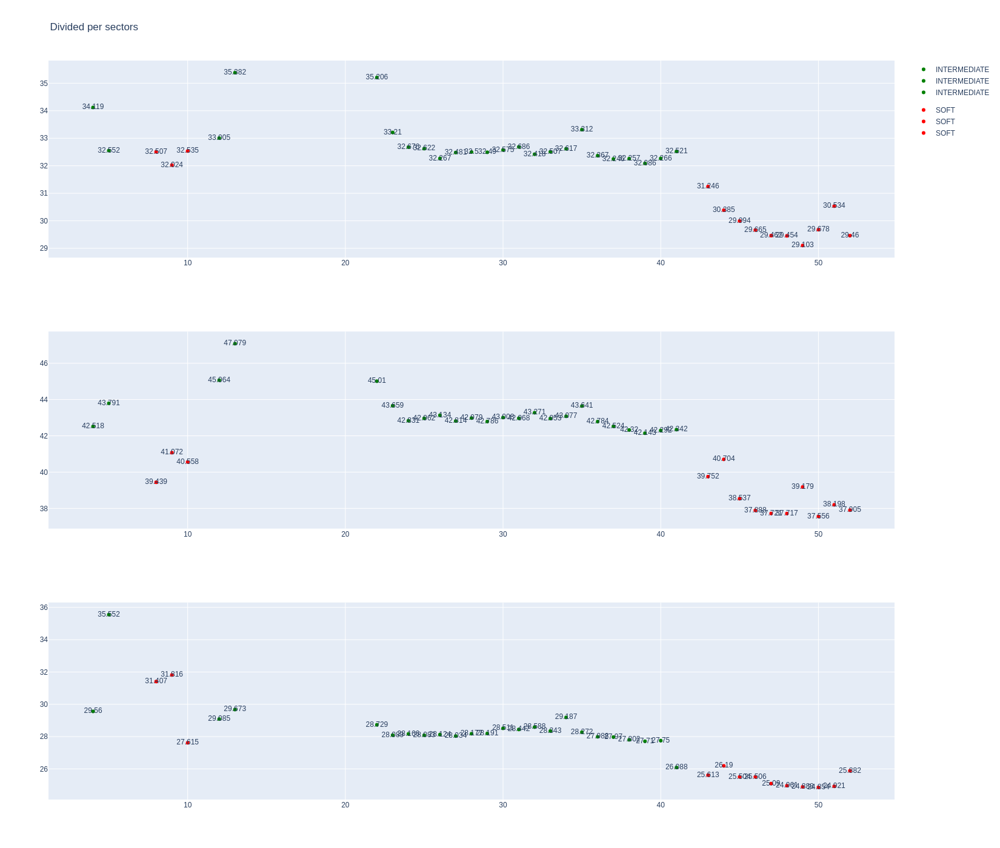

In [260]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### RB

In [261]:
stintInformation.query('driver_number == 6 or driver_number == 30')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
0,1277,9947,1,30,1,1,INTERMEDIATE,0
6,1277,9947,1,6,1,10,MEDIUM,0
24,1277,9947,2,6,11,17,INTERMEDIATE,0


In [262]:
data = libraryDataF1.getinfolongruns(jointables,30,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [263]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [264]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [265]:
data = libraryDataF1.getinfolongruns(jointables,6,'Racing Bulls',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
68,Isack HADJAR,MEDIUM,2025-07-06T14:10:37.829000+00:00,4,37.387,42.421,33.734,113.542
85,Isack HADJAR,MEDIUM,2025-07-06T14:12:31.529000+00:00,5,35.470,45.443,38.935,119.848
118,Isack HADJAR,MEDIUM,2025-07-06T14:16:49.024000+00:00,7,39.021,40.630,32.100,111.751
135,Isack HADJAR,MEDIUM,2025-07-06T14:18:40.725000+00:00,8,33.559,38.899,31.301,103.759
152,Isack HADJAR,MEDIUM,2025-07-06T14:20:24.534000+00:00,9,32.709,38.545,30.451,101.705
167,Isack HADJAR,MEDIUM,2025-07-06T14:22:06.253000+00:00,10,31.608,43.987,27.096,102.691
188,Isack HADJAR,INTERMEDIATE,2025-07-06T14:25:58.847000+00:00,12,33.888,44.272,30.179,108.339
204,Isack HADJAR,INTERMEDIATE,2025-07-06T14:27:47.294000+00:00,13,34.060,47.098,36.058,117.216


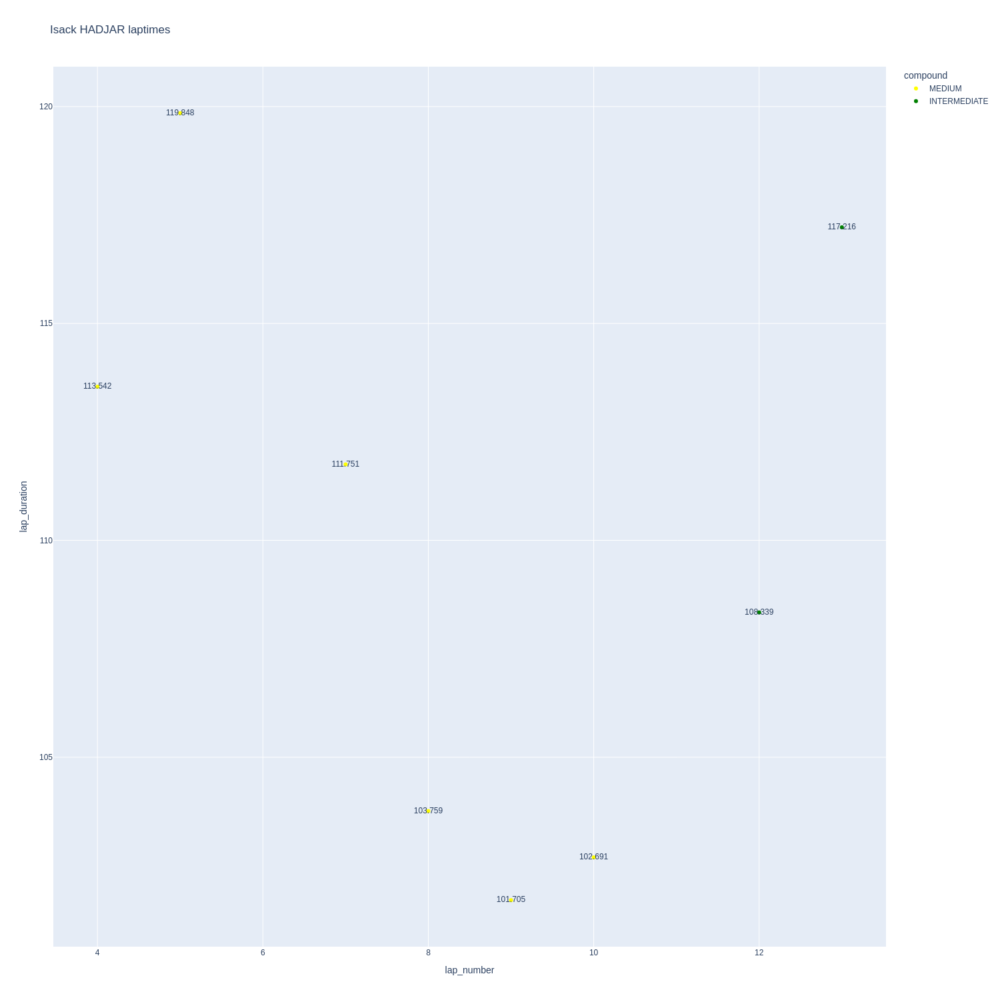

In [266]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

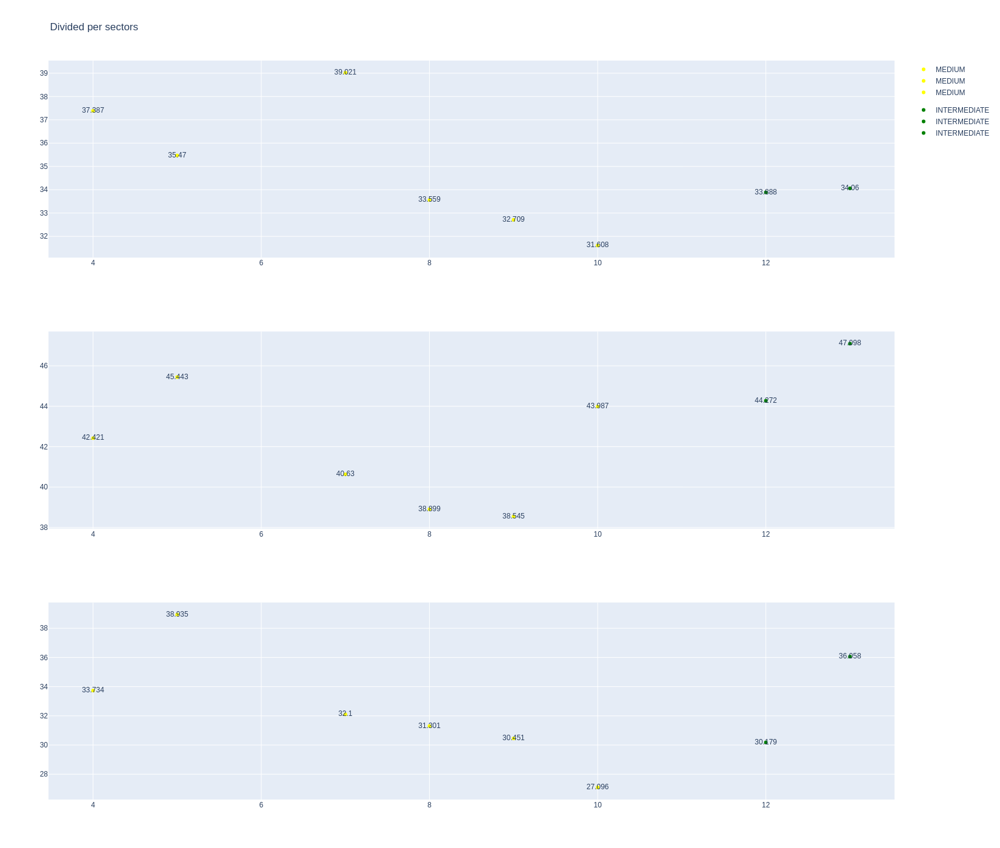

In [267]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Haas

In [268]:
stintInformation.query('driver_number == 31 or driver_number == 87')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
9,1277,9947,1,87,1,10,HARD,0
19,1277,9947,1,31,1,18,INTERMEDIATE,0
26,1277,9947,2,87,11,41,INTERMEDIATE,0
38,1277,9947,2,31,19,42,INTERMEDIATE,0
47,1277,9947,3,87,42,52,MEDIUM,0
52,1277,9947,3,31,43,52,MEDIUM,0


In [269]:
data = libraryDataF1.getinfolongruns(jointables,31,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
64,Esteban OCON,INTERMEDIATE,2025-07-06T14:10:21.115000+00:00,4,33.769,42.947,29.550,106.266
81,Esteban OCON,INTERMEDIATE,2025-07-06T14:12:07.420000+00:00,5,32.752,43.835,35.578,112.165
130,Esteban OCON,INTERMEDIATE,2025-07-06T14:18:16.672000+00:00,8,32.632,44.249,30.412,107.293
147,Esteban OCON,INTERMEDIATE,2025-07-06T14:20:04.010000+00:00,9,33.553,45.191,30.617,109.361
164,Esteban OCON,INTERMEDIATE,2025-07-06T14:21:53.424000+00:00,10,33.766,45.506,30.498,109.770
178,Esteban OCON,INTERMEDIATE,2025-07-06T14:23:43.116000+00:00,11,34.081,47.410,30.375,111.866
182,Esteban OCON,INTERMEDIATE,2025-07-06T14:25:34.879000+00:00,12,33.980,46.130,30.676,110.786
350,Esteban OCON,INTERMEDIATE,2025-07-06T14:49:55.757000+00:00,22,36.308,47.650,28.982,112.940
364,Esteban OCON,INTERMEDIATE,2025-07-06T14:51:48.669000+00:00,23,33.343,43.959,28.691,105.993
380,Esteban OCON,INTERMEDIATE,2025-07-06T14:53:34.769000+00:00,24,32.970,43.326,28.306,104.602


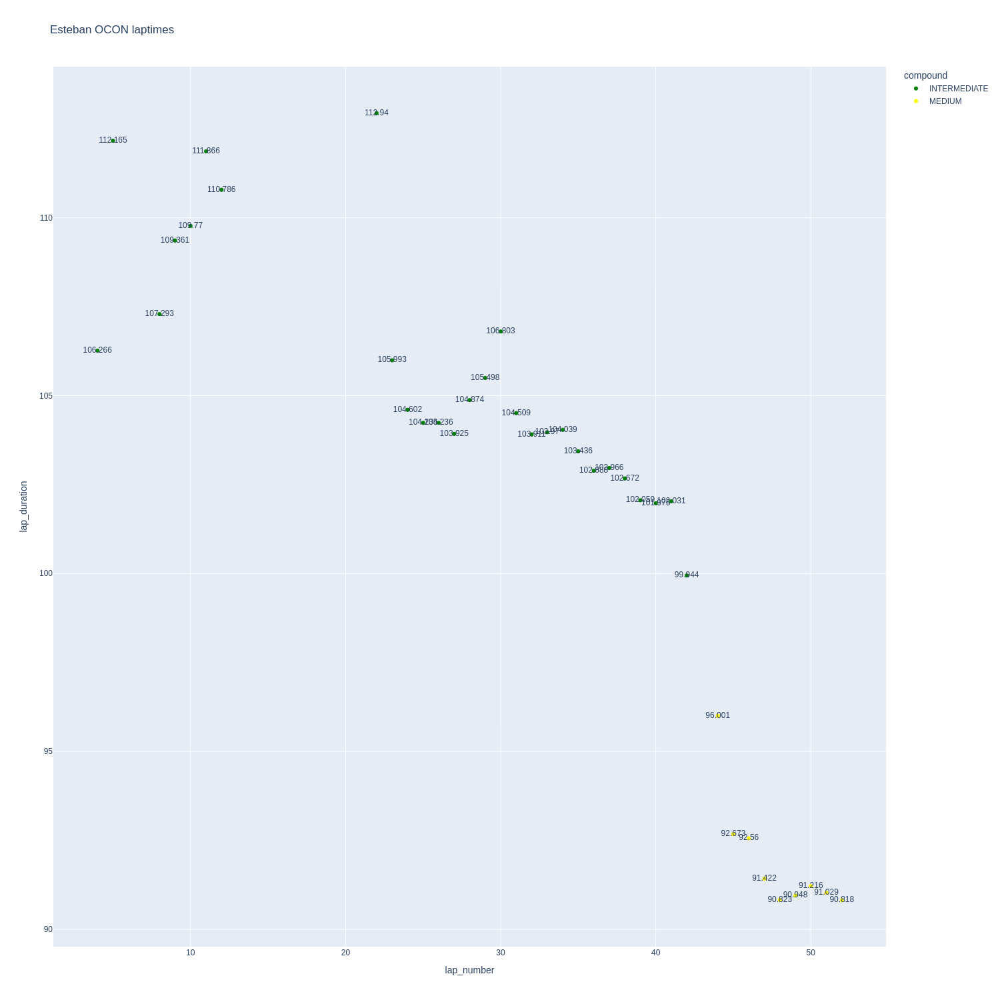

In [270]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

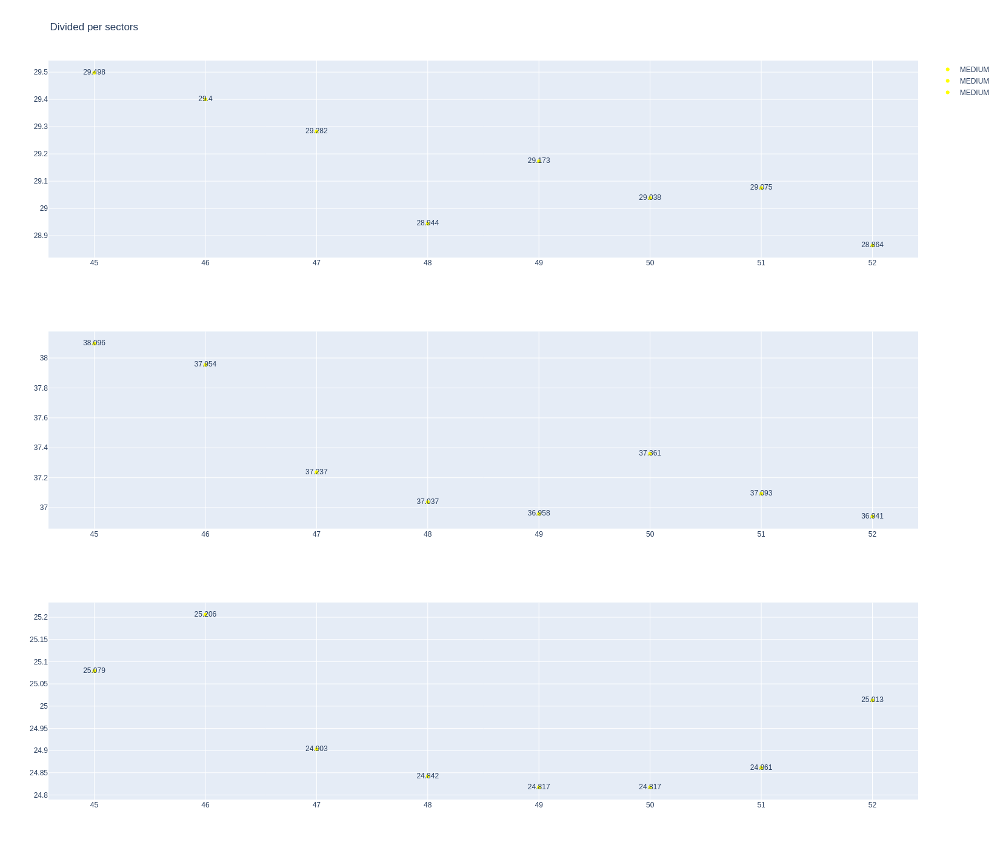

In [200]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [201]:
data = libraryDataF1.getinfolongruns(jointables,87,'Haas F1 Team',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data


,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
664,Oliver BEARMAN,MEDIUM,2025-07-06T15:28:28.476000+00:00,44,30.124,39.106,25.644,94.874
678,Oliver BEARMAN,MEDIUM,2025-07-06T15:30:03.044000+00:00,45,29.412,39.086,25.237,93.735
693,Oliver BEARMAN,MEDIUM,2025-07-06T15:31:36.816000+00:00,46,29.222,37.831,25.049,92.102
708,Oliver BEARMAN,MEDIUM,2025-07-06T15:33:12.004000+00:00,47,29.435,37.530,25.133,92.098
723,Oliver BEARMAN,MEDIUM,2025-07-06T15:34:40.898000+00:00,48,29.191,37.115,24.735,91.041
738,Oliver BEARMAN,MEDIUM,2025-07-06T15:36:11.926000+00:00,49,29.030,37.237,25.006,91.273
753,Oliver BEARMAN,MEDIUM,2025-07-06T15:37:43.252000+00:00,50,29.104,37.062,24.755,90.921
768,Oliver BEARMAN,MEDIUM,2025-07-06T15:39:14.197000+00:00,51,29.159,36.990,24.972,91.121
783,Oliver BEARMAN,MEDIUM,2025-07-06T15:40:45.186000+00:00,52,29.012,38.590,24.983,92.585


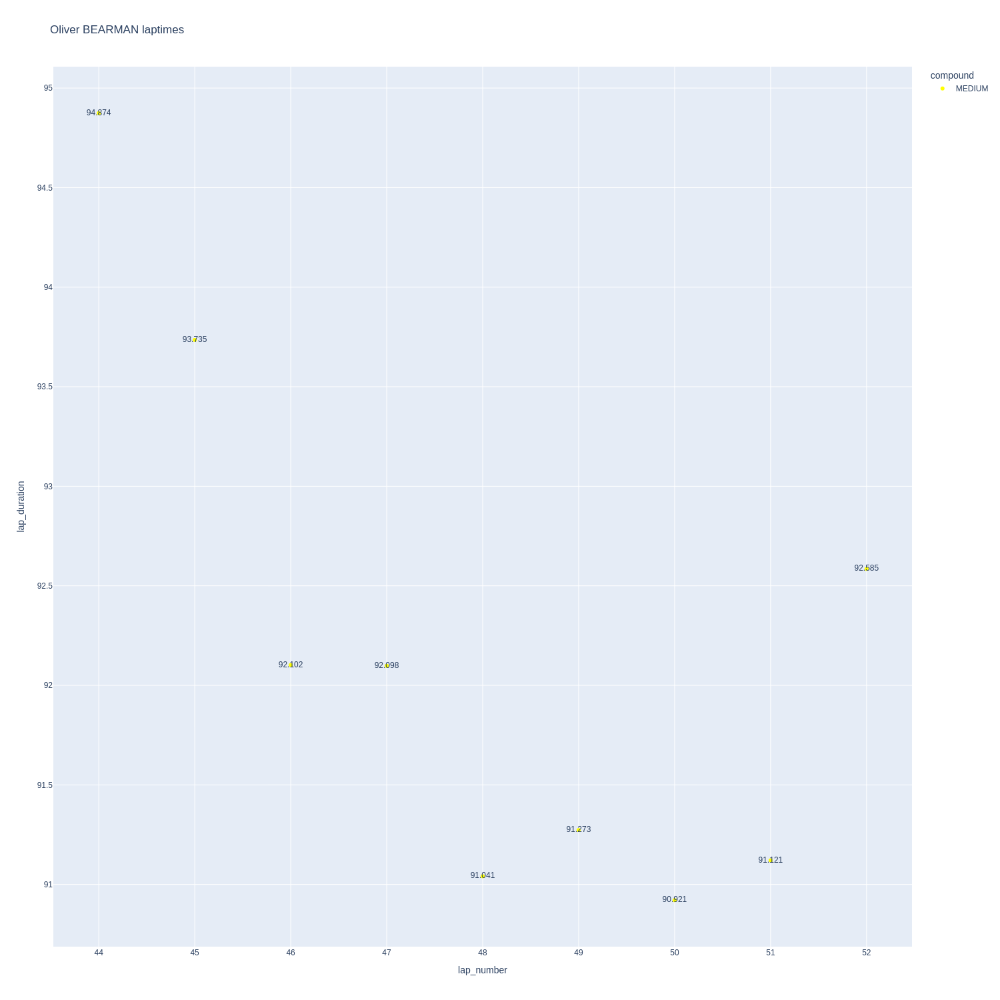

In [202]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

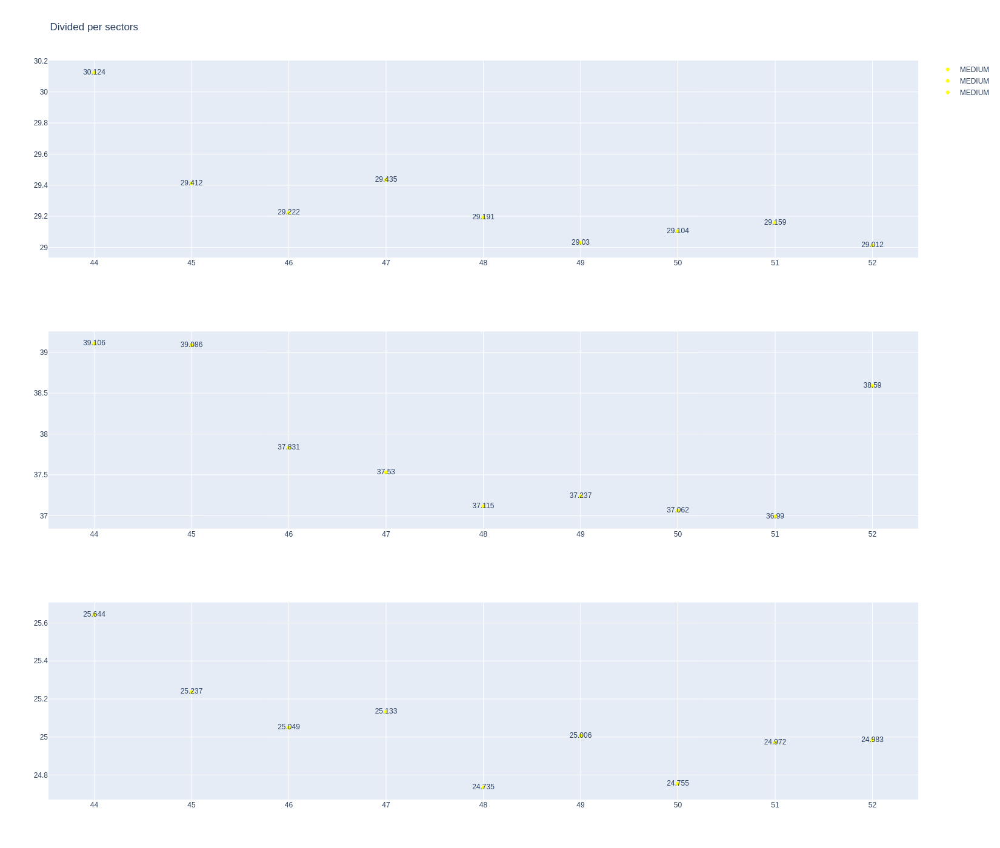

In [203]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Alpine

In [204]:
stintInformation.query('driver_number == 10 or driver_number == 43')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
1,1277,9947,1,43,1,1,HARD,0
12,1277,9947,1,10,1,11,INTERMEDIATE,0
31,1277,9947,2,10,12,41,INTERMEDIATE,0
44,1277,9947,3,10,42,52,MEDIUM,0


In [205]:
data =libraryDataF1.getinfolongruns(jointables,43,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [206]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [207]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [208]:
data = libraryDataF1.getinfolongruns(jointables,10,'Alpine',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
674,Pierre GASLY,MEDIUM,2025-07-06T15:29:51.516000+00:00,45,30.363,38.518,24.877,93.758
689,Pierre GASLY,MEDIUM,2025-07-06T15:31:25.485000+00:00,46,29.897,37.893,24.911,92.701
704,Pierre GASLY,MEDIUM,2025-07-06T15:33:09.519000+00:00,47,29.601,37.348,24.875,91.824
719,Pierre GASLY,MEDIUM,2025-07-06T15:34:29.758000+00:00,48,29.327,36.778,24.646,90.751
734,Pierre GASLY,MEDIUM,2025-07-06T15:36:00.580000+00:00,49,29.209,36.861,24.689,90.759
749,Pierre GASLY,MEDIUM,2025-07-06T15:37:31.344000+00:00,50,29.406,36.976,24.620,91.002
764,Pierre GASLY,MEDIUM,2025-07-06T15:39:02.354000+00:00,51,29.447,37.356,24.662,91.465
779,Pierre GASLY,MEDIUM,2025-07-06T15:40:33.728000+00:00,52,29.149,37.885,24.850,91.884


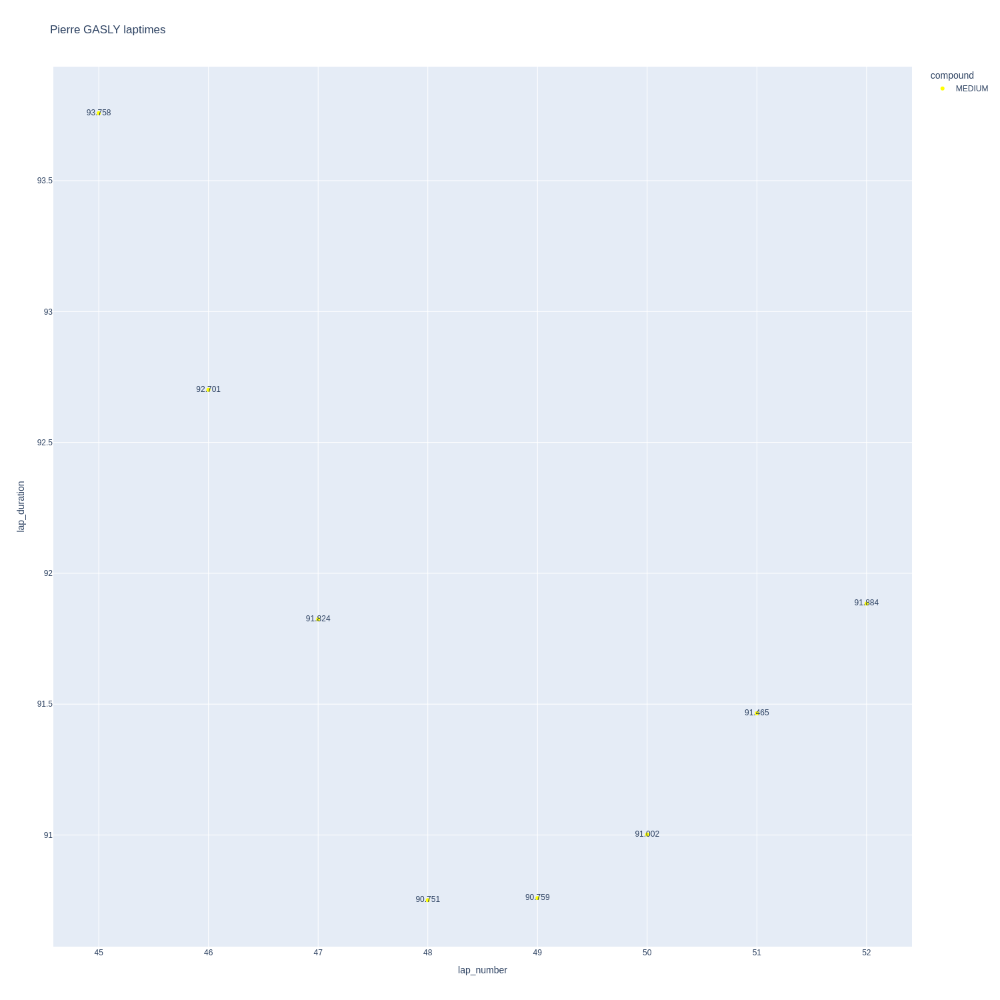

In [209]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

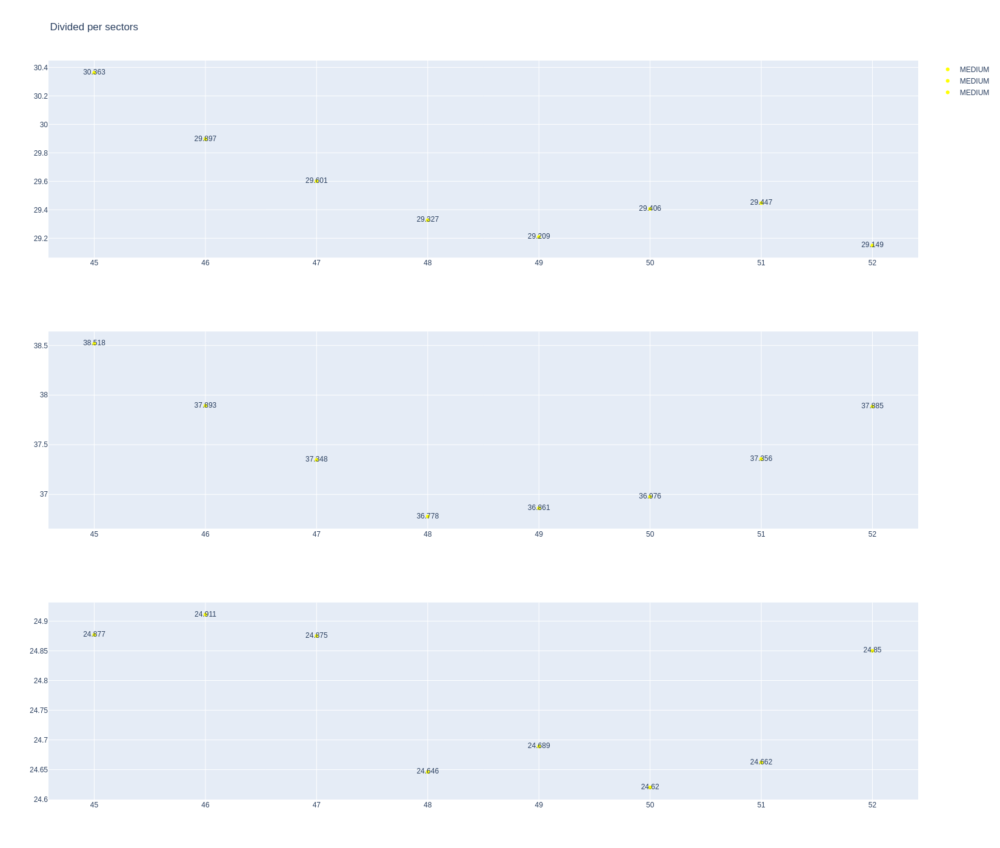

In [210]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Williams

In [211]:
stintInformation.query('driver_number == 55 or driver_number == 23')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
16,1277,9947,1,55,1,11,INTERMEDIATE,0
18,1277,9947,1,23,1,12,INTERMEDIATE,0
34,1277,9947,2,55,12,41,INTERMEDIATE,0
37,1277,9947,2,23,13,42,INTERMEDIATE,0
46,1277,9947,3,55,42,52,MEDIUM,0
50,1277,9947,3,23,43,52,MEDIUM,0


In [212]:
data = libraryDataF1.getinfolongruns(jointables,23,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
676,Alexander ALBON,MEDIUM,2025-07-06T15:30:00.167000+00:00,45,30.107,39.529,25.027,94.663
691,Alexander ALBON,MEDIUM,2025-07-06T15:31:34.817000+00:00,46,29.639,38.122,24.920,92.681
706,Alexander ALBON,MEDIUM,2025-07-06T15:33:11.316000+00:00,47,28.994,37.597,24.718,91.309
721,Alexander ALBON,MEDIUM,2025-07-06T15:34:38.789000+00:00,48,28.742,37.037,24.548,90.327
736,Alexander ALBON,MEDIUM,2025-07-06T15:36:09.063000+00:00,49,28.932,36.707,24.509,90.148
751,Alexander ALBON,MEDIUM,2025-07-06T15:37:39.403000+00:00,50,28.779,36.685,24.583,90.047
766,Alexander ALBON,MEDIUM,2025-07-06T15:39:09.369000+00:00,51,28.834,36.986,24.300,90.120
781,Alexander ALBON,MEDIUM,2025-07-06T15:40:39.488000+00:00,52,28.891,37.161,24.400,90.452


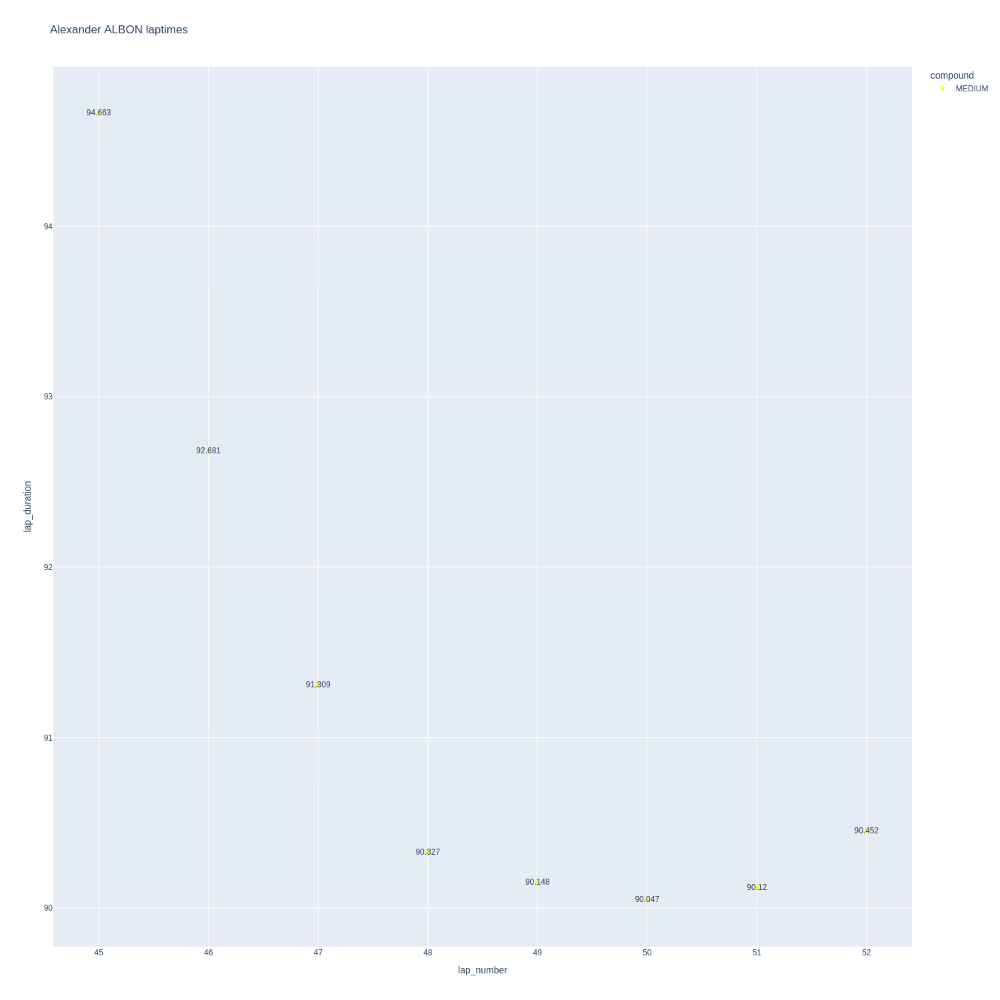

In [213]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

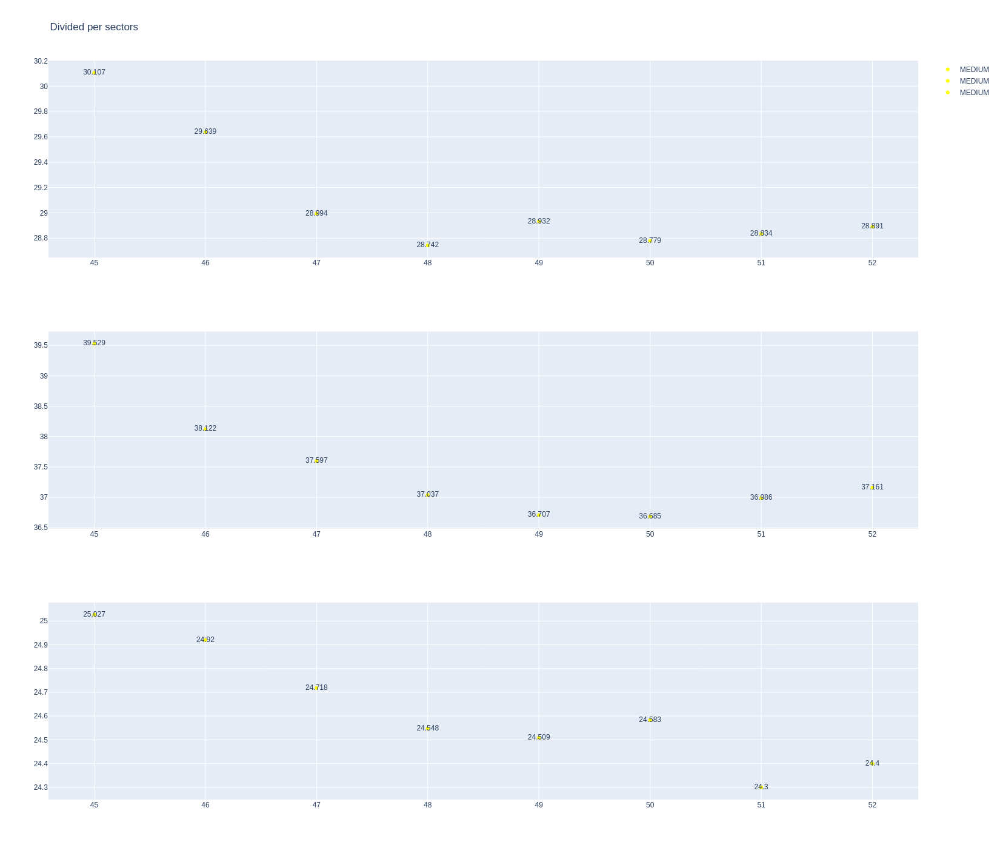

In [214]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [215]:
data= libraryDataF1.getinfolongruns(jointables,55,'Williams',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
679,Carlos SAINZ,MEDIUM,2025-07-06T15:30:07.282000+00:00,45,29.711,38.632,25.174,93.517
694,Carlos SAINZ,MEDIUM,2025-07-06T15:31:41.078000+00:00,46,29.392,39.620,25.068,94.080
709,Carlos SAINZ,MEDIUM,2025-07-06T15:33:14.972000+00:00,47,29.118,37.929,24.775,91.822
724,Carlos SAINZ,MEDIUM,2025-07-06T15:34:46.805000+00:00,48,28.996,37.444,24.630,91.070
739,Carlos SAINZ,MEDIUM,2025-07-06T15:36:17.777000+00:00,49,29.045,37.284,24.623,90.952
754,Carlos SAINZ,MEDIUM,2025-07-06T15:37:48.793000+00:00,50,29.867,37.265,24.833,91.965
769,Carlos SAINZ,MEDIUM,2025-07-06T15:39:20.713000+00:00,51,29.168,37.039,24.810,91.017
784,Carlos SAINZ,MEDIUM,2025-07-06T15:40:51.686000+00:00,52,28.927,36.976,24.742,90.645


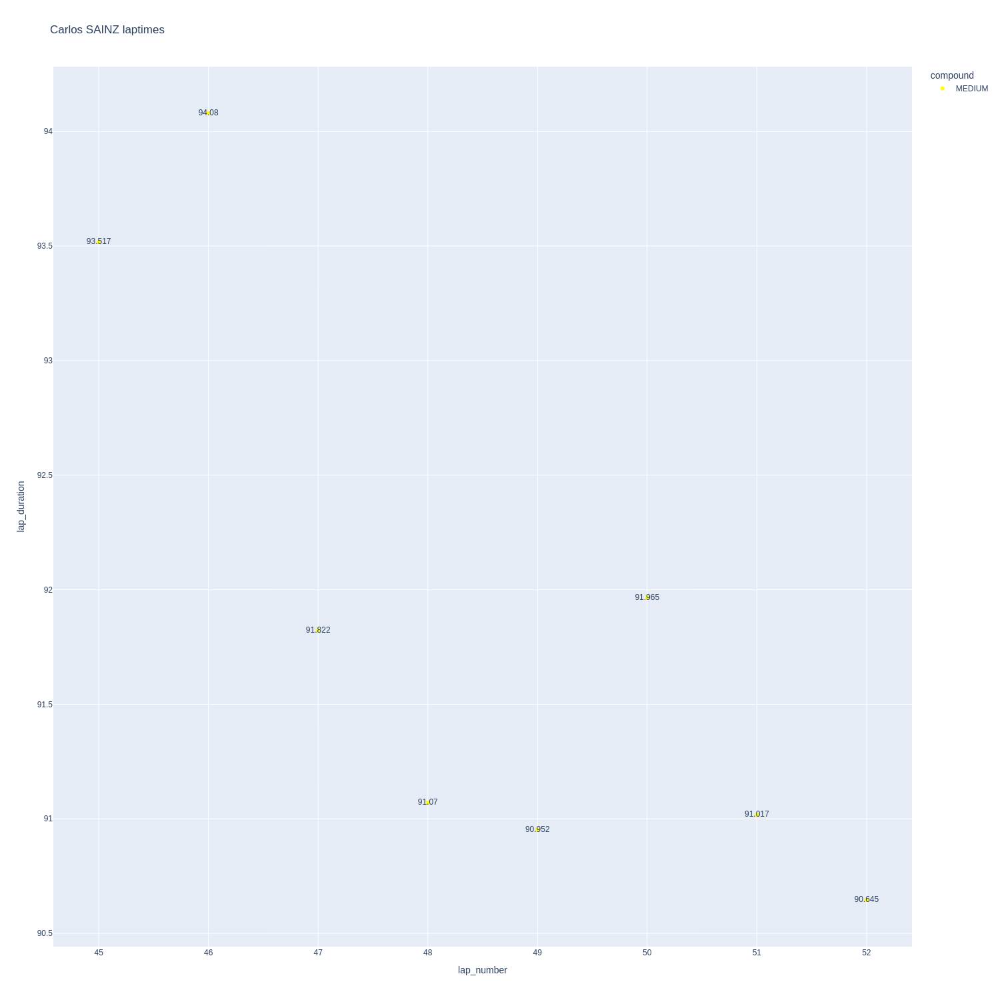

In [216]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

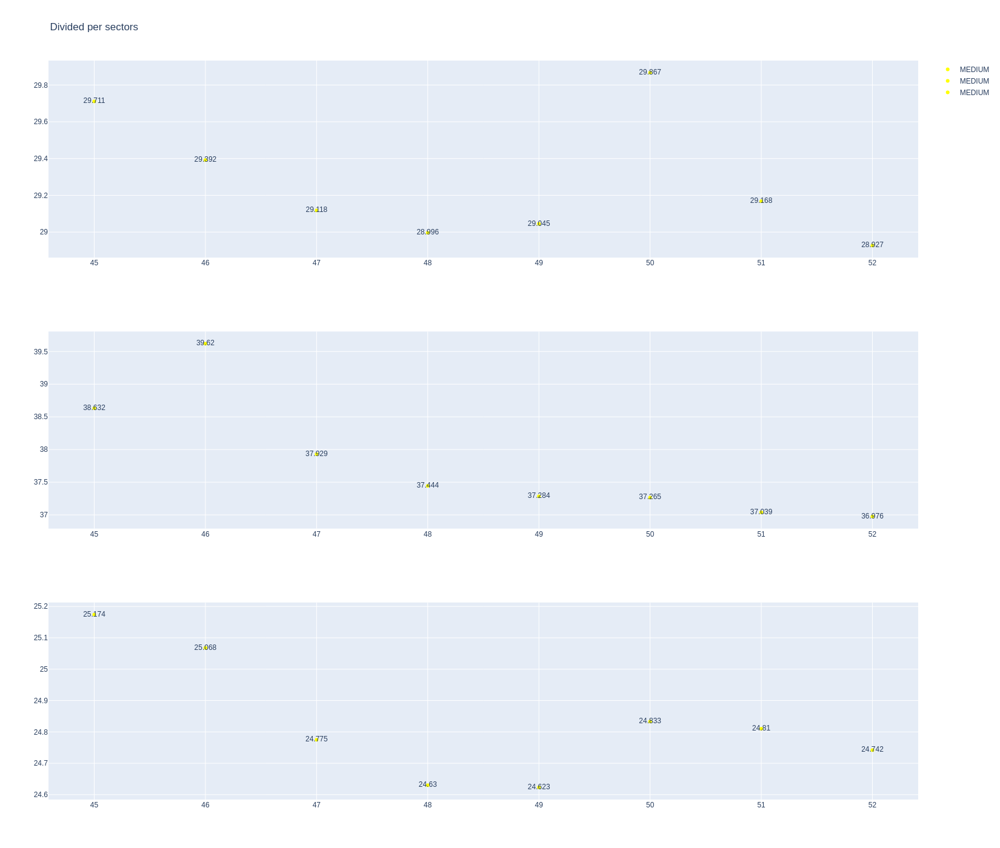

In [217]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

#### Kick Sauber

In [218]:
stintInformation.query('driver_number == 27 or driver_number == 5')

,meeting_key,session_key,stint_number,driver_number,lap_start,lap_end,compound,tyre_age_at_start
3,1277,9947,1,5,1,3,MEDIUM,0
5,1277,9947,1,27,1,9,INTERMEDIATE,0
23,1277,9947,2,27,10,42,INTERMEDIATE,0
51,1277,9947,3,27,43,52,MEDIUM,0


In [219]:
data = libraryDataF1.getinfolongruns(jointables,27,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration
670,Nico HULKENBERG,MEDIUM,2025-07-06T15:29:26.229000+00:00,45,30.127,38.299,25.047,93.473
685,Nico HULKENBERG,MEDIUM,2025-07-06T15:30:59.703000+00:00,46,30.077,37.781,24.837,92.695
700,Nico HULKENBERG,MEDIUM,2025-07-06T15:32:32.386000+00:00,47,29.703,37.269,24.958,91.930
715,Nico HULKENBERG,MEDIUM,2025-07-06T15:34:04.363000+00:00,48,29.404,37.274,24.790,91.468
730,Nico HULKENBERG,MEDIUM,2025-07-06T15:35:35.820000+00:00,49,29.280,37.115,24.686,91.081
745,Nico HULKENBERG,MEDIUM,2025-07-06T15:37:06.936000+00:00,50,29.121,37.170,24.692,90.983
760,Nico HULKENBERG,MEDIUM,2025-07-06T15:38:37.927000+00:00,51,29.470,36.820,24.643,90.933
775,Nico HULKENBERG,MEDIUM,2025-07-06T15:40:08.763000+00:00,52,29.341,37.271,25.093,91.705


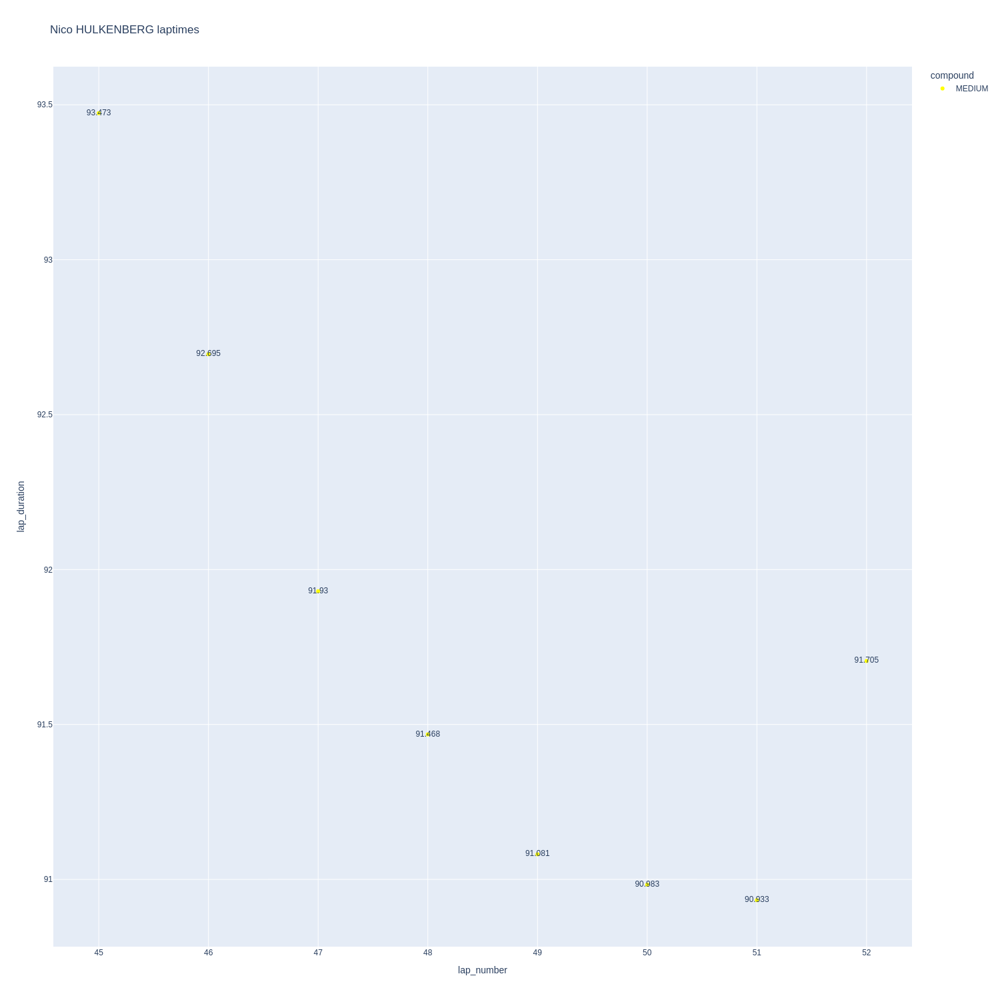

In [220]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

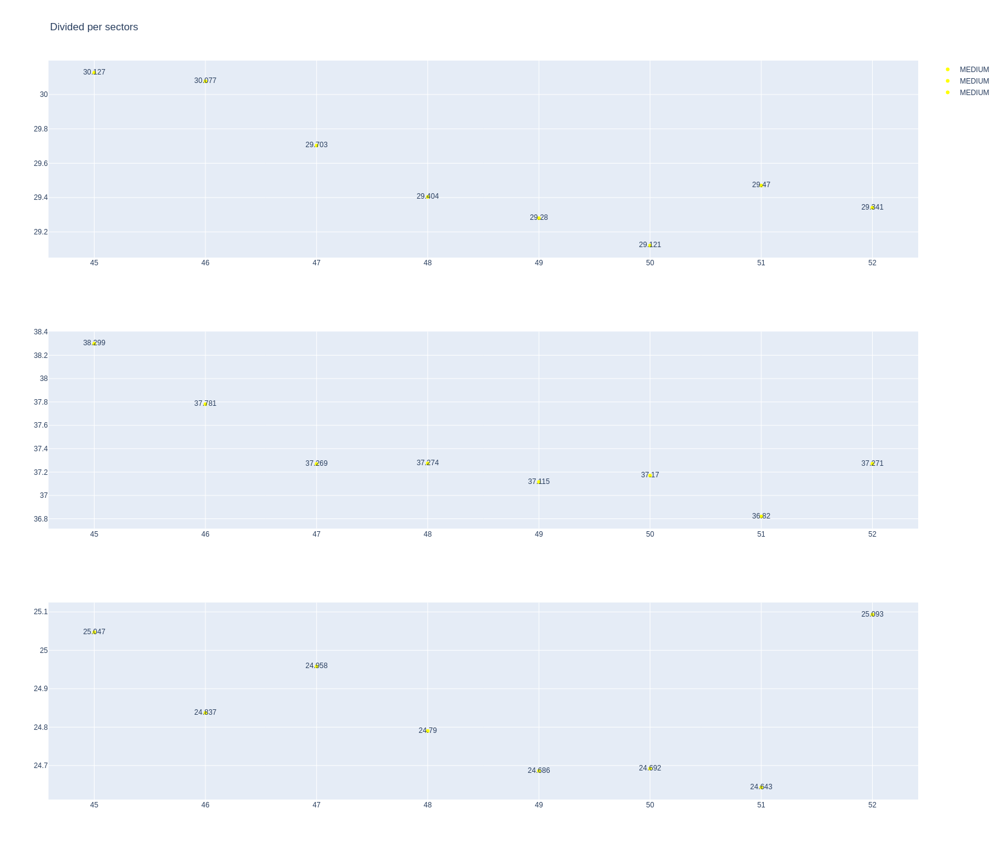

In [221]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

In [222]:
data = libraryDataF1.getinfolongruns(jointables,5,'Kick Sauber',MINIMUN_SECONDS,MAXIMUM_SECONDS)
data

,full_name,compound,date_start,lap_number,duration_sector_1,duration_sector_2,duration_sector_3,lap_duration


In [223]:
if len(data) != 0:
    libraryDataF1.race_pace_graph(data)

In [224]:
if len(data) != 0:
    libraryDataF1.race_pace_divided_per_sectors(data)

### Pits
Before to finish the analysis, I added the Pits sections where it can see how much time teams spent in the box.

In [258]:
pit = libraryDataF1.obtain_information('pit',session_key=9558)

In [259]:
jointables = pd.merge(drivers,pit,on=['driver_number']).query("pit_duration<120")
jointables
pit_duration = pd.DataFrame(jointables.groupby('team_name')['pit_duration'].mean().sort_values(ascending=True))
pit_duration

,pit_duration
team_name,
Alpine,28.700000
Ferrari,28.916667
Aston Martin,29.325000
Red Bull Racing,29.333333
McLaren,29.400000
RB,29.550000
Haas F1 Team,29.925000
Mercedes,30.300000
Kick Sauber,30.516667
